<a href="https://colab.research.google.com/github/MarcCampmanyGar/CNN_photovoltaic_cells/blob/main/TFM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The dataset contains 2,624 samples of 300x300 pixels 8-bit grayscale images of functional and defective solar cells with varying degree of degradations extracted from 44 different solar modules. The defects in the annotated images are either of intrinsic or extrinsic type and are known to reduce the power efficiency of solar modules.

All images are normalized with respect to size and perspective. Additionally, any distortion induced by the camera lens used to capture the EL images was eliminated prior to solar cell extraction.

## Imports

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageDraw
import os
import tensorflow.keras.layers as layers
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

from tensorflow import keras
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
# import tensorflow.keras.layers as layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
TFM_path = "/content/drive/MyDrive/Colab Notebooks/TFM/"
path_images = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/images"
path_labels = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/labels.csv"
labels = pd.read_csv(TFM_path+"labels_final.csv")

METRICS = [
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'), 
      keras.metrics.Accuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc')]

##**PROVES AMB IMATGES**

>### **Obrir imatge cel·la amb tensorflow**

In [ ]:
cell_image_path = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/images/cell0007.png"
cell_image = tf.io.read_file(cell_image_path)
cell_image = tf.io.decode_png(cell_image)
plt.imshow(tf.squeeze(cell_image)) #, cmap="gray")

>### **Obrir imatge cel·la amb PIL**

In [ ]:
PIL_cell_image = Image.open("/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/images/cell0007.png")
PIL_cell_image

>### **Crear figures amb PIL**

In [ ]:
canvas = Image.new('L', (250, 250), "black")
img_draw = ImageDraw.Draw(canvas)
img_draw.ellipse((10, 60, 249, 180), outline='white')
img_draw.text((150, 150), 'Defecte', fill='white')
canvas.save('/content/drive/MyDrive/Colab Notebooks/TFM/drawn_image.jpg')
dibuix = Image.open('/content/drive/MyDrive/Colab Notebooks/TFM/drawn_image.jpg')
dibuix

>### **Imatge cel·la + dibuix**

In [ ]:
cell_image_copy = PIL_cell_image.copy()
#position1 = ((cell_image_copy.width - dibuix.width), (cell_image_copy.height - dibuix.height))
cell_image_copy.paste(dibuix, (0,0), mask=dibuix)
#cell_image_copy.save('pasted_image.jpg')
cell_image_copy

## **EXPLORATORY ANALYSIS (EDA)**

>### **Convert columns into variables (not needed)**

>### **Clean labels, csv and NaNs**

> El csv original de Labels no està separat bé amb comes i necessita tractament






In [ ]:
#té molts NaNs pq el origianl no estava separat bé amb comes
labels_0= pd.read_csv(path_labels, sep=' ', header=None)

labels_0.head()

In [ ]:
#eliminar columnes buides, no amb dropna de columnes pq hi ha problemes amb la columna de type (vist més endavant)
labels_1 = labels_0.drop([1,3,5,6,7,8,9,10,11,12,13,14,15,16,17,18], axis=1)

labels_1.head()

In [ ]:

#guardar nou fitxer i afegir capceleres, index=false per evitar una nova columna unnamed
labels_1.to_csv(TFM_path+"labels_clean.csv",header=["image", "probability", "to_review", "type"], index=False)




> Sembla que per les probabilitats amb molts decimals apareix el 'type' a la columna 4, anomenada ('to review')





In [ ]:
labels_2= pd.read_csv(TFM_path+"labels_clean.csv")
#mostrar les rows on el tipus de cel·la està contingut a la columna 'to_review'
labels_2.loc[labels_2.to_review.notnull()]

> Consolidar tots els tipus de cel·la a la columna 'type' i eliminar la columna 'to_review'

In [ ]:
labels_2.loc[labels_2.to_review.notnull(), "type"] = labels_2.to_review
labels_def = labels_2.drop("to_review", axis=1)
labels_def.to_csv(TFM_path+'labels_final.csv', index=False)

labels_def.head()

> ### **fitxer net**

In [ ]:
#El dataframe té 2624 files i 3 columnes
labels = pd.read_csv(TFM_path+"labels_final.csv")
labels.shape

In [ ]:
ntypes = labels.groupby(['type','probability']).size()
ntypes

In [ ]:
labels.groupby(['type','probability']).size().plot(kind='bar')
plt.title('Class distribution')
plt.ylabel("nº of images")
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7], ['Mono 0%', 'Mono 33%', 'Mono 66%', 'Mono 100%', 'Poly 0%', 'Poly 33%', 'Poly 66%', 'Poly 100%']);
plt.xticks(rotation=60);

In [ ]:
#quantitat d'imatges per cada probabilitat
labels.groupby(['probability']).size() / 2624

In [ ]:
labels.head()

Es treballarà amb les diferents probabilitats com si fossin 4 classes: 0.0, 0.33, 0.66 i 1.0.
Es pot veure que del grup 0,66% hi han poques imatges tant per monocristall com per policristall. Això pot crear problemes degut a "class imbalance" a l'hora de fer el model i les prediccions.

## **CREATE TRAIN/TEST FILES**

Com que no tenim train/test files dividim el original de labels en 80% train i 20% test

In [ ]:
#importar el mòdul de scikit-learn que permet fer divisions en el dataset.
from sklearn.model_selection import train_test_split

#assignar a les variables X i y els valors de les columnes 'image'=ruta i nom de la imatge de la cel·la i 'probability'= % de defecte a la cel·la.
X, y = labels["image"], labels["probability"]

#crear els sets d'entrenament i de test que farem servir per al model a partir del dataset inicial. Un 20% serà per test i la resta, el 80%, serà 
#d'entrenament. Especificar un random_state per assegurar que sempre que executem aquest codi es divideix igual el dataset. Fa la divisió de manera
#agafant files de manera aleatòria per així evitar que els fitxers continguin patrons del dataset.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

#Com que treballem amb un fitxer que especifica la ruta/nom de la imatge i el valor del % i en una altra carpeta estan les imatges en sí, en el mateix csv
# ajuntarem X i y com ho teniem inicialment.

#reajuntar train file + crear csv
train_file = pd.DataFrame(list(zip(X_train, y_train)), columns =['image', 'val'])
train_file.to_csv(TFM_path+'train_file.csv', index=False)

#reajuntar test file + crear csv
test_file = pd.DataFrame(list(zip(X_test, y_test)), columns =['image', 'val'])
test_file.to_csv(TFM_path+'test_file.csv', index=False)

#Aquí podem veure la distribució de 80/20 per a train i test del dataset.
train_file.shape, test_file.shape

In [ ]:
y_train.value_counts()

In [ ]:
y_test.value_counts()

In [ ]:
#Observant el títol de les imatges es pot comprovar que han estat agafdes i barrejades aleatòriament, com s'esperava.
train_file.head()

In [ ]:
#obrir els csv creats a l'ultim punt amb els nous datasets d'entenament i de test.
train_df = pd.read_csv(TFM_path+"train_file.csv", dtype='str')
test_df =  pd.read_csv(TFM_path+"test_file.csv", dtype='str')

In [ ]:
#Mòdul per a poder treballar amb 'Generadors'. Degut a que tenim les imatges en una carpeta i en un fitxer separat els títols i valors de les imatges de cel·les
#amb un generador aconseguirem que faci les relacions automàticament.
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 15% del set s'utilitzi per a validació.
train_val_datagen=ImageDataGenerator(rescale=1./255.,validation_split=0.15)
test_datagen = ImageDataGenerator(rescale=1./255)


#'flow_from_dataframe' checks the path available on the dataframe and then automatically search for the image in directory.
#Then it makes the desired preprocessing steps available in ImageDataGenerator.  

      #training set
train_generator=train_val_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',   #treballarem amb els 3 canals de color
    subset="training",
    batch_size=32,
    seed=42,
    shuffle=False,      
    class_mode="sparse",   # o podria ser "categorical"
    target_size=(300,300))

      #validation set
valid_generator=train_val_datagen.flow_from_dataframe(
  dataframe=train_df,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=32,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="sparse",
  target_size=(300,300))

      #test set
test_generator=test_datagen.flow_from_dataframe(
  dataframe=test_df,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="sparse",
  target_size=(300,300))


# **BENCHMARK MONO+POLY TOGETHER**

### *Define the model*

In [ ]:
cnn_model = keras.Sequential([
    layers.Conv2D(filters=32,kernel_size=3,activation='relu',input_shape = (300,300,3)),
    layers.MaxPooling2D(pool_size=2) ,      # down sampling the output instead of 28*28 it is 14*14
    layers.Dropout(0.2),                    # activa/desactiva neurones per a propiciar generalització del model
    layers.Flatten(),                        # The Flatten layer transforms the 2D outputs of the base into the 1D inputs needed by the head.
    layers.Dense(32,activation='relu'),
    layers.Dense(4,activation = 'softmax')])

cnn_model.summary()

In [ ]:
import tensorflow.keras.layers as layers
from tensorflow import keras

cnn_model_comp = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               # últim 1 era per a b/n i 3 per rgb
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    #Classifier Head
    layers.Dropout(rate=0.3),
    layers.Flatten(),                                        # flatten out the layers
    layers.Dense(256,activation='relu'),
    layers.Dense(4, activation = 'softmax')  
    ])

cnn_model_comp.summary()

### *Compile the model*

In [ ]:
cnn_model.compile(
    loss ='sparse_categorical_crossentropy', 
    optimizer=keras.optimizers.Adam(lr=0.001),
    metrics =['accuracy'])

In [ ]:
cnn_model_comp.compile(
    loss ='sparse_categorical_crossentropy', 
    optimizer=keras.optimizers.Adam(lr=0.001),
    metrics =['accuracy'])

### *Train the model*

In [ ]:
from keras.callbacks import EarlyStopping

history_comp = cnn_model_comp.fit_generator(
    generator= train_generator,
    validation_data= valid_generator,
    epochs=75,
    verbose=1)
   

### save models

In [ ]:
#Guardar model senzill entrenat
cnn_model.save("/content/drive/MyDrive/Colab Notebooks/TFM/CNN_simple.h5")

In [ ]:
#Guardar model complex entrenat
cnn_model_comp.save("/content/drive/MyDrive/Colab Notebooks/TFM/CNN_comp.h5")

### *Results*

In [ ]:
# Once the model is trained we can evaluate it on Test data.

score = cnn_model.evaluate(test_generator, verbose=1)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

In [ ]:
score = cnn_model_comp.evaluate(test_generator, verbose=1)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

Hem evaluat el nostre model en el set de test i obtenim accuracy=0.712. No està malament per ser el primer model senzill però hauriem de poder incrementar-lo

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Function')
plt.xlabel('epochs');

plt.subplot(2, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')
plt.xlabel('epochs');

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.plot(history_comp.history['loss'], label='Loss')
plt.plot(history_comp.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Function')
plt.xlabel('epochs');

plt.subplot(2, 2, 2)
plt.plot(history_comp.history['accuracy'], label='Training Accuracy')
plt.plot(history_comp.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')
plt.xlabel('epochs');

Es pot veure que per a les dades d'entranament el model ho fa molt bé però per al set de validació no. Això és degut a "Overfitting" que vol dir que el model està massa adecuat a les dades d'entrenament i no suficientment generalitzat.

A continuació calculem la matriu de confusió i algunes mesures estadístiques per a cada categoria per avaluar com ha funcionat el model.

In [ ]:
Y_pred = cnn_model.predict_generator(valid_generator)#, num_of_test_samples // batch_size+1)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
print(confusion_matrix(valid_generator.classes, y_pred))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(valid_generator.classes, y_pred, target_names=target_names))

<u>Matriu confusió i Classification Matrix:</u>

La matriu de 4x4 mostra per a Y-axis el valor actual del label i per X-axis el valor predit per el model per a les categories [0.0, 0.33, 0.66, 1.0]. Podem veure per exemple que per a [0.0] 140 l'ha predit bé, 8 l'ha predit com a 0.33, 1 cop com a 0.66 i 21 cops com a 1.0. El problema més important el tenim amb la categoria [0.66] ja que no l'ha etiquetat bé cap cop, segurament degut a que és la categoria de la que tenim menys imatges i per tant en la que està menys entrenat el model.

1. **Precision** = (TP / (TP + FP)) What proportion of positive identifications was actually correct?
\
 *Exemple per classe [0.0] = (155 / (155+22+12+34))= 0.7*

2. **Recall** = (TP / (TP + FN)) What proportion of actual positives was identified correctly? 
\
 *Exemple per classe [0.0] = (155 / (155+3+0+12))= 0.91*

3. **F1-score**= The F1 score can be interpreted as a weighted average of the precision and recall, where an F1 score reaches its best value at 1 and worst score at 0. In the multi-class and multi-label case, this is the average of the F1 score of each class with weighting depending on the average parameter.
\
F1 = 2 * (precision * recall) / (precision + recall)


-	TP = **True positive** is an outcome where the model correctly predicts the positive class. 
-	TN = **True negative** is an outcome where the model correctly predicts the negative class.
-	FP = **False positive** is an outcome where the model incorrectly predicts the positive class. Like a False Alarm, that says that there are robbers but its not true.
-	FN = **False negative** is an outcome where the model incorrectly predicts the negative class. Imagine there are robbers actually but your alarm system predicts negative (so alarm doesn’t sound).

In [ ]:
Y_pred_comp = cnn_model_comp.predict_generator(valid_generator)#, num_of_test_samples // batch_size+1)
y_pred_comp = np.argmax(Y_pred_comp, axis=1)
print('Confusion Matrix')
print(confusion_matrix(valid_generator.classes, y_pred_comp))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(valid_generator.classes, y_pred_comp, target_names=target_names))

# **BENCHMARK MONO-POLY SEPARATED**

## Crear fitxers separats 

In [ ]:
labels = pd.read_csv(TFM_path+"labels_final.csv")
mono_file = labels[labels['type']=='mono']
poly_file = labels[labels['type']=='poly']

mono_file.to_csv(TFM_path+'mono_file.csv', index=False)
poly_file.to_csv(TFM_path+'poly_file.csv', index=False)

In [ ]:
mono = pd.read_csv(TFM_path+'mono_file.csv')
poly = pd.read_csv(TFM_path+'poly_file.csv')

mono.head(), poly.head()

In [ ]:
mono.groupby('probability').count()

In [ ]:
poly.groupby('probability').count()

## crear train/test

In [ ]:
mono = pd.read_csv(TFM_path+'mono_file.csv')
poly = pd.read_csv(TFM_path+'poly_file.csv')

#importar el mòdul de scikit-learn que permet fer divisions en el dataset.
from sklearn.model_selection import train_test_split

#assignar a les variables X i y els valors de les columnes 'image'=ruta i nom de la imatge de la cel·la i 'probability'= % de defecte a la cel·la.
x_mono, y_mono = mono["image"], mono["probability"]
x_poly, y_poly = poly["image"], poly["probability"]


#crear els sets d'entrenament i de test que farem servir per al model a partir del dataset inicial. Un 10% serà per test i la resta, el 90%, serà 
#d'entrenament. Especificar un random_state per assegurar que sempre que executem aquest codi es divideix igual el dataset. Fa la divisió de manera
#agafant files de manera aleatòria per així evitar que els fitxers continguin patrons del dataset.
X_train_mono, X_test_mono, y_train_mono, y_test_mono = train_test_split(x_mono, y_mono, test_size=0.10, random_state=42)
X_train_poly, X_test_poly, y_train_poly, y_test_poly = train_test_split(x_poly, y_poly, test_size=0.10, random_state=42)


#Com que treballem amb un fitxer que especifica la ruta/nom de la imatge i el valor del % i en una altra carpeta estan les imatges en sí, en el mateix csv
# ajuntarem X i y com ho teniem inicialment.

#reajuntar train file + crear csv
train_file_mono = pd.DataFrame(list(zip(X_train_mono, y_train_mono)), columns =['image', 'val'])
train_file_mono.to_csv(TFM_path+'train_file_mono.csv', index=False)
train_file_poly = pd.DataFrame(list(zip(X_train_poly, y_train_poly)), columns =['image', 'val'])
train_file_poly.to_csv(TFM_path+'train_file_poly.csv', index=False)

#reajuntar test file + crear csv
test_file_mono = pd.DataFrame(list(zip(X_test_mono, y_test_mono)), columns =['image', 'val'])
test_file_mono.to_csv(TFM_path+'test_file_mono.csv', index=False)
test_file_poly = pd.DataFrame(list(zip(X_test_poly, y_test_poly)), columns =['image', 'val'])
test_file_poly.to_csv(TFM_path+'test_file_poly.csv', index=False)

#Aquí podem veure la distribució de 80/20 per a train i test del dataset.
train_file_mono.shape, test_file_mono.shape, train_file_poly.shape, test_file_poly.shape

## MONO

In [ ]:
#obrir els csv creats a l'ultim punt amb els nous datasets d'entenament i de test.
train_df_mono = pd.read_csv(TFM_path+"train_file_mono.csv", dtype='str')
test_df_mono =  pd.read_csv(TFM_path+"test_file_mono.csv", dtype='str')

In [ ]:
#Mòdul per a poder treballar amb 'Generadors'. Degut a que tenim les imatges en una carpeta i en un fitxer separat els títols i valors de les imatges de cel·les
#amb un generador aconseguirem que faci les relacions automàticament.
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 10% del set s'utilitzi per a validació.
train_val_datagen_mono=ImageDataGenerator(rescale=1./255.,validation_split=0.10)
test_datagen_mono = ImageDataGenerator(rescale=1./255)

#'flow_from_dataframe' checks the path available on the dataframe and then automatically search for the image in directory.
#Then it makes the desired preprocessing steps available in ImageDataGenerator.  

      #training set
train_generator_mono=train_val_datagen_mono.flow_from_dataframe(
    dataframe=train_df_mono,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',
    subset="training",
    batch_size=64,
    seed=42,
    shuffle=False,      
    class_mode="categorical",
    target_size=(300,300))

      #validation set
valid_generator_mono=train_val_datagen_mono.flow_from_dataframe(
  dataframe=train_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=64,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="categorical",
  target_size=(300,300))

      #test set
test_generator_mono=test_datagen_mono.flow_from_dataframe(
  dataframe=test_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="categorical",
  target_size=(300,300))


### define models

In [ ]:
mono_comp = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               # últim 1 era per a b/n i 3 per rgb
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    #Classifier Head
    layers.Dropout(rate=0.4),
    layers.Flatten(),                                        # flatten out the layers
    layers.Dense(256,activation='relu'),
    layers.Dense(4, activation = 'softmax')    #kernel_regularizer=keras.regularizers.l2(0.001)
    ])


In [ ]:
METRICS = [
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'), 
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc')]

In [ ]:
mono_comp.compile(
    loss ='categorical_crossentropy', 
    optimizer=keras.optimizers.Adam(lr=0.0001),
    metrics =METRICS)

### fit models

In [ ]:
history_mono_comp = mono_comp.fit_generator(
    generator= train_generator_mono,
    validation_data= valid_generator_mono,
    epochs=75,
    verbose=1
)

In [ ]:
mono_comp.save("/content/drive/MyDrive/Colab Notebooks/TFM/comp_mono.h5")

### evaluate

In [ ]:
# Once the model is trained we can evaluate it on Test data.

score_mono_comp = mono_comp.evaluate(test_generator_mono, verbose=1)
print('Test Loss:', score_mono_comp[0])
print('Test accuracy:', score_mono_comp[1])

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.plot(history_mono_comp.history['loss'], label='Loss')
plt.plot(history_mono_comp.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Function')

plt.subplot(2, 2, 2)
plt.plot(history_mono_comp.history['accuracy'], label='Training Accuracy')
plt.plot(history_mono_comp.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy');

In [ ]:
Y_pred_mono = mono_comp.predict_generator(test_generator_mono)
y_pred_mono = np.argmax(Y_pred_mono, axis=1)
print('Confusion Matrix')
print(confusion_matrix(test_generator_mono.classes, y_pred_mono))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(test_generator_mono.classes, y_pred_mono, target_names=target_names))

## POLY

In [ ]:
#obrir els csv creats a l'ultim punt amb els nous datasets d'entenament i de test.
train_df_poly = pd.read_csv(TFM_path+"train_file_poly.csv", dtype='str')
test_df_poly =  pd.read_csv(TFM_path+"test_file_poly.csv", dtype='str')

In [ ]:
#Mòdul per a poder treballar amb 'Generadors'. Degut a que tenim les imatges en una carpeta i en un fitxer separat els títols i valors de les imatges de cel·les
#amb un generador aconseguirem que faci les relacions automàticament.
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 10% del set s'utilitzi per a validació.
train_val_datagen_poly=ImageDataGenerator(rescale=1./255.,validation_split=0.10)
test_datagen_poly = ImageDataGenerator(rescale=1./255)


      #training set
train_generator_poly=train_val_datagen_poly.flow_from_dataframe(
    dataframe=train_df_poly,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',
    subset="training",
    batch_size=64,
    seed=42,
    shuffle=False,      
    class_mode="categorical",
    target_size=(300,300))

      #validation set
valid_generator_poly=train_val_datagen_poly.flow_from_dataframe(
  dataframe=train_df_poly,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=64,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="categorical",
  target_size=(300,300))

      #test set
test_generator_poly=test_datagen_poly.flow_from_dataframe(
  dataframe=test_df_poly,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="categorical",
  target_size=(300,300))


In [ ]:
poly_comp = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               # últim 1 era per a b/n i 3 per rgb
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    #Classifier Head
    layers.Dropout(rate=0.4),
    layers.Flatten(),                                        # flatten out the layers
    layers.Dense(256,activation='relu'),
    layers.Dense(4, activation = 'softmax')    #kernel_regularizer=keras.regularizers.l2(0.001)
    ])

In [ ]:
poly_comp.compile(
    loss ='categorical_crossentropy', 
    optimizer=keras.optimizers.Adam(lr=0.0001),
    metrics = METRICS)

In [ ]:
history_poly = poly_comp.fit_generator(
    generator= train_generator_poly,
    validation_data= valid_generator_poly,
    epochs=75,
    verbose=1,
)

In [ ]:
# poly_comp.save("/content/drive/MyDrive/Colab Notebooks/TFM/comp_poly.h5")   no està guardat al drive

In [ ]:
# Once the model is trained we can evaluate it on Test data.

score_poly = poly_comp.evaluate(test_generator_poly, verbose=1)
print('Test Loss:', score_poly[0])
print('Test accuracy:', score_poly[1])

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.plot(history_poly.history['loss'], label='Loss')
plt.plot(history_poly.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Function')

plt.subplot(2, 2, 2)
plt.plot(history_poly.history['accuracy'], label='Training Accuracy')
plt.plot(history_poly.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

In [ ]:
Y_pred_poly = poly_comp.predict_generator(valid_generator_poly)
y_pred_poly = np.argmax(Y_pred_poly, axis=1)
print('Confusion Matrix')
print(confusion_matrix(valid_generator_poly.classes, y_pred_poly))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(valid_generator_poly.classes, y_pred_poly, target_names=target_names))

# **DATA AUGMENTATION**

https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html


These are just a few of the options available (for more, see the documentation). Let's quickly go over what we just wrote:

- **rotation_range** is a value in degrees (0-180), a range within which to randomly rotate pictures
- **width_shift** and **height_shift** are ranges (as a fraction of total width or height) within which to randomly translate pictures vertically or horizontally
- **rescale** is a value by which we will multiply the data before any other processing. Our original images consist in RGB coefficients in the 0-255, but such values would be too high for our models to process (given a typical learning rate), so we target values between 0 and 1 instead by scaling with a 1/255. factor.
- **shear_range** is for randomly applying shearing transformations
- **zoom_range** is for randomly zooming inside pictures
- **horizontal_flip** is for randomly flipping half of the images horizontally --relevant when there are no assumptions of horizontal assymetry (e.g. real-world pictures).
- **fill_mode** is the strategy used for filling in newly created pixels, which can appear after a rotation or a width/height shift.

In [ ]:
# # Exemple de data augmentation amb una imatge específica, que guarda 10 transformacions a la ruta = ('Colab Notebooks/TFM/preview_augment')##

# from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
# datagen = ImageDataGenerator(
#         rescale = 1./255.,
#         rotation_range=5,
#         width_shift_range=0.1,
#         height_shift_range=0.1,
#         shear_range=0.2,
#         zoom_range=0.1,
#         horizontal_flip=True,
#         fill_mode='nearest')

# img = load_img("/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/images/cell0388.png")  # this is a PIL image
# x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
# x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)

# # the .flow() command below generates batches of randomly transformed images and saves the results to the `preview/` directory
# i = 0
# for batch in datagen.flow(x, batch_size=1, save_to_dir='/content/drive/MyDrive/Colab Notebooks/TFM/preview_augment', save_prefix='cell', save_format='png'):
#     i += 1
#     if i > 10:
#         break  # otherwise the generator would loop indefinitely

In [ ]:
#Mòdul per a poder treballar amb 'Generadors'. Degut a que tenim les imatges en una carpeta i en un fitxer separat els títols i valors de les imatges de cel·les
#amb un generador aconseguirem que faci les relacions automàticament.

from tensorflow.keras.preprocessing.image import ImageDataGenerator

#obrir els csv creats a l'ultim punt amb els nous datasets d'entenament i de test.
train_df = pd.read_csv(TFM_path+"train_file.csv", dtype='str')
test_df =  pd.read_csv(TFM_path+"test_file.csv", dtype='str')

# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 10% del set s'utilitzi per a validació.

# this is the augmentation configuration we will use for training
train_datagen_aug = ImageDataGenerator(rescale = 1./255.,
                                      validation_split=0.10,  
                                      rotation_range=5,
                                      width_shift_range=0.1,
                                      height_shift_range=0.1,
                                      shear_range=0.1,
                                      zoom_range=0.1,
                                      horizontal_flip=True,
                                      fill_mode='nearest')

# this is the augmentation configuration we will use for testing only rescaling
test_datagen_noaug = ImageDataGenerator(rescale=1./255)
# Valid DataGenerator, we only specify the scaling factor. Other transformations not# required because we are not training the model on this data.
val_datagen_noaug=ImageDataGenerator(rescale=1./255.,validation_split=0.10)


      #training set
train_generator_aug = train_datagen_aug.flow_from_dataframe(
    dataframe=train_df,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',
    subset="training",
    batch_size=64,
    seed=42,
    shuffle=False,      
    class_mode="categorical",
    target_size=(300,300))

#test_generator and valid_generator will remain the same

      #validation set
valid_generator_noaug=val_datagen_noaug.flow_from_dataframe(
  dataframe=train_df,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=64,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="categorical",
  target_size=(300,300))

      #test set
test_generator_noaug=test_datagen_noaug.flow_from_dataframe(
  dataframe=test_df,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="categorical",
  target_size=(300,300))


In [ ]:
train_generator_aug.class_indices

Does ImageDataGenerator add more images to my dataset?

**Short answer**: 1) All the original images are just transformed (i.e. rotation, zooming, etc.) every epoch and then used for training, and 2) [Therefore] the number of images in each epoch is equal to the number of original images you have.

**Long answer**: In each epoch, the ImageDataGenerator applies a transformation on the images you have and use the transformed images for training. The set of transformations includes rotation, zooming, etc. By doing this you're somehow creating new data (i.e. also called data augmentation), but obviously the generated images are not totally different from the original ones. This way the learned model may be more robust and accurate as it is trained on different variations of the same image.

You need to set the steps_per_epoch argument of fit method to n_samples / batch_size, where n_samples is the total number of training data you have (i.e. 1000 in your case). This way in each epoch, each training sample is augmented only one time and therefore 1000 transformed images will be generated in each epoch.

Further, I think it's worth clarifying the meaning of "augmentation" in this context: basically we are augmenting the images when we use ImageDataGenerator and enabling its augmentation capabilities. But the word "augmentation" here does not mean, say, if we have 100 original training images we end up having 1000 images per epoch after augmentation (i.e. the number of training images does not increase per epoch). Instead, it means we use a different transformation of each image in each epoch; hence, if we train our model for, say, 5 epochs, we have used 5 different versions of each original image in training (or 100 * 5 = 500 different images in the whole training, instead of using just the 100 original images in the whole training). To put it differently, the total number of unique images increases in the whole training from start to finish, and not per epoch.

## model

In [ ]:
import tensorflow.keras.layers as layers
from tensorflow import keras

cnn_model_aug_comp = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               # últim 1 era per a b/n i 3 per rgb
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    #Classifier Head
    layers.Flatten(),                                        # flatten out the layers
    layers.Dense(256,activation='relu'),
    layers.Dropout(rate=0.5),
    layers.Dense(4, activation = 'softmax')  
    ])

cnn_model_aug_comp.summary()

In [ ]:
cnn_model_aug_comp.compile(
    loss ='categorical_crossentropy', 
    optimizer=keras.optimizers.Adam(lr=0.0001),
    metrics = METRICS)

In [ ]:
#Entrenar model amb els generadors de Train i validation

history_aug_comp = cnn_model_aug_comp.fit_generator(
    generator= train_generator_aug,
    validation_data= valid_generator_noaug,
    epochs=75,
    verbose=1)

In [ ]:
cnn_model_aug_comp.save("/content/drive/MyDrive/Colab Notebooks/TFM/CNN_aug_comp.h5")

In [ ]:
score = cnn_model_aug_comp.evaluate(test_generator_noaug, verbose=1)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.plot(history_aug_comp.history['loss'], label='Loss')
plt.plot(history_aug_comp.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Function')

plt.subplot(2, 2, 2)
plt.plot(history_aug_comp.history['accuracy'], label='Training Accuracy')
plt.plot(history_aug_comp.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

In [ ]:
Y_pred_aug_comp = cnn_model_aug_comp.predict_generator(valid_generator_noaug)
y_pred_aug_comp = np.argmax(Y_pred_aug_comp, axis=1)
print('Confusion Matrix')
print(confusion_matrix(valid_generator_noaug.classes, y_pred_aug_comp))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(valid_generator_noaug.classes, y_pred_aug_comp, target_names=target_names))

# **WEIGHT BALANCING**

Donat que tenim "class imbalance" (molt poques imatges per a les classes 0.33 i 0.66) donarem uns pesos inicials a ls classes per incrementar la seva importància a la hora de generalitzar el model.

### Calculate weights

In [ ]:
total_labels = labels.groupby(['probability']).size().sum()
total_labels

In [ ]:
#dividit per 2 dona millors resultats
weight_for_0 = (1 / labels.groupby(['probability']).size()[0])*(total_labels)/2.0 
weight_for_03 = (1 / labels.groupby(['probability']).size()[1/3])*(total_labels)/2.0
weight_for_06 = (1 / labels.groupby(['probability']).size()[2/3])*(total_labels)/2.0
weight_for_1 = (1 / labels.groupby(['probability']).size()[1])*(total_labels)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

### Define model weights

In [ ]:
#Mòdul per a poder treballar amb 'Generadors'. Degut a que tenim les imatges en una carpeta i en un fitxer separat els títols i valors de les imatges de cel·les
#amb un generador aconseguirem que faci les relacions automàticament.
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 10% del set s'utilitzi per a validació.
train_val_datagen=ImageDataGenerator(rescale=1./255.,validation_split=0.10)
test_datagen = ImageDataGenerator(rescale=1./255)


#'flow_from_dataframe' checks the path available on the dataframe and then automatically search for the image in directory.
#Then it makes the desired preprocessing steps available in ImageDataGenerator.  

      #training set
train_generator=train_val_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',   #treballarem amb els 3 canals de color
    subset="training",
    batch_size=64,
    seed=42,
    shuffle=False,      
    class_mode="categorical",   # o podria ser "categorical"
    target_size=(300,300))

      #validation set
valid_generator=train_val_datagen.flow_from_dataframe(
  dataframe=train_df,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=64,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="categorical",
  target_size=(300,300))

      #test set
test_generator=test_datagen.flow_from_dataframe(
  dataframe=test_df,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="categorical",
  target_size=(300,300))


In [ ]:
cnn_saved_model_comp = tf.keras.models.load_model(TFM_path+'CNN_comp.h5')
ini_weights_comp = cnn_saved_model_comp.get_weights()

In [ ]:
weighted_model_comp = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               # últim 1 era per a b/n i 3 per rgb
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    #Classifier Head
    layers.Flatten(),                                        # flatten out the layers
    layers.Dense(256,activation='relu'),
    layers.Dropout(rate=0.4),
    layers.Dense(4, activation = 'softmax')  
    ])

# weighted_model_comp.set_weights(ini_weights_comp)
# weighted_model_comp.load_weights(ini_weights_comp)

In [ ]:
weighted_model_comp.compile(
    loss ='categorical_crossentropy', 
    optimizer=keras.optimizers.Adam(lr=0.0001),
    metrics = METRICS)

In [ ]:
weighted_history_comp = weighted_model_comp.fit_generator(
    generator= train_generator,
    validation_data= valid_generator,
    epochs=75,
    # The class weights go here
    class_weight = class_weight)

In [ ]:
# weighted_model_comp.save("/content/drive/MyDrive/Colab Notebooks/TFM/weighted.h5")  no guardat al drive!

### Results weighted

In [ ]:
# Once the model is trained we can evaluate it on Test data.

score = weighted_model_comp.evaluate(test_generator, verbose=1)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.plot(weighted_history_comp.history['loss'], label='Loss')
plt.plot(weighted_history_comp.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Function')

plt.subplot(2, 2, 2)
plt.plot(weighted_history_comp.history['accuracy'], label='Training Accuracy')
plt.plot(weighted_history_comp.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

In [ ]:
Y_pred_w_comp = weighted_model_comp.predict_generator(valid_generator)
y_pred_w_comp = np.argmax(Y_pred_w_comp, axis=1)
print('Confusion Matrix')
print(confusion_matrix(valid_generator.classes, y_pred_w_comp))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(valid_generator.classes, y_pred_w_comp, target_names=target_names))

# **VGG16 - TRANSFER LEARNING**

### *Define the model vgg16*

Import vgg16 base trained on imagenet

In [ ]:
from tensorflow import keras
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
# import tensorflow.keras.layers as layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten

vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(300, 300, 3))
# i.e. freeze all convolutional VGG16 layers
for layer in vgg_model.layers:
    layer.trainable = False

# We set layer.trainable=False for each layer of the VGG model, as we are using the pre-trained weights of the model.
# HEAD= we flatten the outputs, add a custom Dense layer with ReLU activation and an Output layer with a softmax activation.

flat1 = Flatten()(vgg_model.layers[-1].output)
class1 = Dense(256, activation='relu')(flat1)
output = Dense(4, activation='softmax')(class1)

# this is the model we will train
model_vgg = Model(inputs = vgg_model.inputs, outputs = output)

model_vgg.summary()

In [ ]:
model_vgg.compile(loss = 'categorical_crossentropy',
                  optimizer=keras.optimizers.Adam(lr=0.0001),
                  metrics= METRICS)

### Train model vgg16

In [ ]:
historyvgg16 = model_vgg.fit(train_generator,
                    validation_data = valid_generator,
                    epochs=75, verbose=1) 

In [ ]:
model_vgg.save("/content/drive/MyDrive/Colab Notebooks/TFM/CNN_vgg.h5")

### Results vgg16

In [ ]:
score = model_vgg.evaluate(test_generator, verbose=1)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.plot(historyvgg16.history['loss'], label='Loss')
plt.plot(historyvgg16.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Function');

plt.subplot(2, 2, 2)
plt.plot(historyvgg16.history['accuracy'], label='Training Accuracy')
plt.plot(historyvgg16.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy');

In [ ]:
Y_pred_vgg = model_vgg.predict_generator(valid_generator)
y_pred_vgg = np.argmax(Y_pred_vgg, axis=1)
print('Confusion Matrix')
print(confusion_matrix(valid_generator.classes, y_pred_vgg))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(valid_generator.classes, y_pred_vgg, target_names=target_names))

# **OVERSAMPLING**

#### mono+poly

In [ ]:
import pandas as pd
import numpy as np
import os
import shutil

# name of folder containing your images
fol_name = '/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master'
#destination folder
data_name = '/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono+poly'

# filename of csv containing image labels
lab_csv = '/content/drive/MyDrive/Colab Notebooks/TFM/labels_final.csv'
# name of column in labels csv containing your file names
fn_col_name = 'image'
# name of column in labels csv containing your target labels
tar_col_name = 'probability'
os.chdir(data_name)


# load in our training labels, make sure they get read as str data
df = pd.read_csv(lab_csv, dtype='str')
# compile list of category names
labels = list(df.probability.unique())

# for each category
for label in labels:
    # create a pandas series containing only the filenames of 
    # images belonging to the current category
    curr_cat = df[df[tar_col_name]==label][fn_col_name]
    
    # if our current category is already a folder in our current working
    # directory, skip this if/else clause
    if os.path.isdir(f'{data_name}/{label}'):
        continue
    
    # if our current category is not already a folder in our current
    # working directory, create a folder and name it our current category
    else:
        os.system(f'mkdir {label}')
        
    
    # for each filename in our curr_cat dataframe
    for fn in curr_cat:
        # if fn is still an image in the original data directory
        if os.path.isfile(f"{fol_name}/{fn}"):
            # move the image to it's corresponding new folder
            shutil.copy(f'{fol_name}/{fn}', f'{data_name}/{label}')

# canviar nom carpetes per a les classes 0.3333 i 0.6666

#### mono i poly separat

In [ ]:
## MONOCRISTALL ## 

import pandas as pd
import numpy as np
import os
import shutil

# CHANGE THESE VARIABLES SO THAT THEY MATCH YOUR DATA AND LABELS CSV
# name of folder containing your images
fol_name = '/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master'

data_name = '/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train'
# filename of csv containing image labels
lab_csv = '/content/drive/MyDrive/Colab Notebooks/TFM/mono_file.csv'
# name of column in labels csv containing your file names
fn_col_name = 'image'
# name of column in labels csv containing your target labels
tar_col_name = 'probability'
os.chdir(data_name)

# load in our training labels, make sure they get read as str data
df = pd.read_csv(lab_csv, dtype='str')
# compile list of category names
labels = list(df.probability.unique())

# for each category
for label in labels:
    # create a pandas series containing only the filenames of 
    # images belonging to the current category
    curr_cat = df[df[tar_col_name]==label][fn_col_name]
    
    # if our current category is already a folder in our current working
    # directory, skip this if/else clause
    if os.path.isdir(f'{data_name}/{label}'):
        continue
    
    # if our current category is not already a folder in our current
    # working directory, create a folder and name it our current category
    else:
        os.system(f'mkdir {label}')
    
    # for each filename in our curr_cat dataframe
    for fn in curr_cat:
        # if fn is still an image in the original data directory
        if os.path.isfile(f"{fol_name}/{fn}"):
            # move the image to it's corresponding new folder
            shutil.copy(f'{fol_name}/{fn}', f'{data_name}/{label}')

# canviar nom carpetes per a les classes 0.3333 i 0.6666

In [ ]:
## POLYCRISTALL ## 

import pandas as pd
import numpy as np
import os
import shutil

# CHANGE THESE VARIABLES SO THAT THEY MATCH YOUR DATA AND LABELS CSV
# name of folder containing your images
fol_name = '/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master'

data_name = '/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/poly/train'
# filename of csv containing image labels
lab_csv = '/content/drive/MyDrive/Colab Notebooks/TFM/poly_file.csv'
# name of column in labels csv containing your file names
fn_col_name = 'image'
# name of column in labels csv containing your target labels
tar_col_name = 'probability'
os.chdir(data_name)

# load in our training labels, make sure they get read as str data
df = pd.read_csv(lab_csv, dtype='str')
# compile list of category names
labels = list(df.probability.unique())

# for each category
for label in labels:
    # create a pandas series containing only the filenames of 
    # images belonging to the current category
    curr_cat = df[df[tar_col_name]==label][fn_col_name]
    
    # if our current category is already a folder in our current working
    # directory, skip this if/else clause
    if os.path.isdir(f'{data_name}/{label}'):
        continue
    
    # if our current category is not already a folder in our current
    # working directory, create a folder and name it our current category
    else:
        os.system(f'mkdir {label}')
    
    # for each filename in our curr_cat dataframe
    for fn in curr_cat:
        # if fn is still an image in the original data directory
        if os.path.isfile(f"{fol_name}/{fn}"):
            # move the image to it's corresponding new folder
            shutil.copy(f'{fol_name}/{fn}', f'{data_name}/{label}')

# canviar nom carpetes per a les classes 0.3333 i 0.6666

#### comprovacions

In [ ]:
'''
type  probability
mono  0.000000       588
      0.333333       117
      0.666667        56
      1.000000       313
poly  0.000000       920
      0.333333       178
      0.666667        50
      1.000000       402
'''

In [ ]:
import os, os.path

###  comprovació per MONO ###
DIR = '/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train'
class_0=0
class_1=0
class_2=0
class_3=0
for classes in os.listdir(DIR):
  for image in os.listdir(f'{DIR}/{classes}'):
    if classes == '0.0':
      class_0= class_0 +1
    elif classes == '0.3':
      class_1= class_1 +1
    elif classes == '0.6':
      class_2=class_2+1
    elif classes == '1.0':
      class_3=class_3+1
    # else:
    #   next
print(class_0, class_1, class_2, class_3)

In [ ]:
###  comprovació per POLY ###

DIR = '/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/poly/train'
class_0=0
class_1=0
class_2=0
class_3=0
for classes in os.listdir(DIR):
  for image in os.listdir(f'{DIR}/{classes}'):
    if classes == '0.0':
      class_0= class_0 +1
    elif classes == '0.3':
      class_1= class_1 +1
    elif classes == '0.6':
      class_2=class_2+1
    elif classes == '1.0':
      class_3=class_3+1
    # else:
    #   next
print(class_0, class_1, class_2, class_3)

#### oversample classes minoritaries

In [ ]:
# crear imatges aumentades a una carpeta X

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

datagen = ImageDataGenerator(
        rescale = 1./255.,
        width_shift_range=0.01,    #ojo amb pixels arrossegats
        height_shift_range=0.01,   #ojo
        # shear_range=0.01,
        zoom_range=0.1,           #if you specify 0.3, then the range will be [0.7, 1.3], or between 70% (zoom in) and 130% (zoom out). 
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest')

# zoom values less than 1.0 will zoom the image in, e.g. [0.5,0.5] makes 50% closer, values larger than 1.0 will zoom the image out

for each_image in os.listdir(f'/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/0.6'):
  img = load_img(f'/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/0.6/{each_image}') 
  x = img_to_array(img)  # this is a Numpy array with shape (3, 300, 300)
  x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 300, 300)
  # the .flow() command below generates batches of randomly transformed images
  i = 0
  for batch in datagen.flow(x, batch_size=1, save_to_dir='/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/0.6', save_prefix='cell', save_format='png'):
      i += 1
      if i > 4:
          break  # otherwise the generator would loop indefinitely

In [ ]:
for each_image in os.listdir(f'/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/0.3'):
  img = load_img(f'/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/0.3/{each_image}') 
  x = img_to_array(img)  # this is a Numpy array with shape (3, 300, 300)
  x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 300, 300)
  # the .flow() command below generates batches of randomly transformed images
  i = 0
  for batch in datagen.flow(x, batch_size=1, save_to_dir='/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/0.3', save_prefix='cell', save_format='png'):
      i += 1
      if i > 2:
          break  # otherwise the generator would loop indefinitely

In [ ]:
for each_image in os.listdir(f'/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/1.0'):
  img = load_img(f'/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/1.0/{each_image}') 
  x = img_to_array(img)  # this is a Numpy array with shape (3, 300, 300)
  x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 300, 300)
  # the .flow() command below generates batches of randomly transformed images
  i = 0
  for batch in datagen.flow(x, batch_size=1, save_to_dir='/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/1.0', save_prefix='cell', save_format='png'):
      i += 1
      if i > 1:
          break  # otherwise the generator would loop indefinitely

# cal borrar algunes imatges ja que després de l'augment la classe en té massa.

In [ ]:
#mides finals de classes
len(os.listdir(f'/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/0.0')), len(os.listdir(f'/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/0.3')),len(os.listdir(f'/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/0.6')),len(os.listdir(f'/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train/1.0'))

#### Model monochristal

In [ ]:
# ## create test folder
# import os
# import shutil

# source1 = "/content/drive/MyDrive/Colab Notebooks/TFM/mono"
# dest1 = "/content/drive/MyDrive/Colab Notebooks/TFM/test/mono"
# folders = os.listdir(source1)

# for f in folders:
#   for images in os.listdir(source1 + '/' + f):
#     if np.random.rand(1) < 0.1:
#         shutil.move(source1 + '/'+ f + '/' + images, dest1 + '/' + f + '/')

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

test_df =  pd.read_csv(TFM_path+"test_file.csv", dtype='str')
test_df_mono =  pd.read_csv(TFM_path+"test_file_mono.csv", dtype='str')

# ---datagens---
train_datagen_dir = ImageDataGenerator(rescale = 1./255.,
                                      validation_split=0.15,  
                                      rotation_range=20,
                                      width_shift_range=0.1,
                                      height_shift_range=0.1,
                                      shear_range=0.1,
                                      zoom_range=0.1,
                                      horizontal_flip=True,
                                      vertical_flip = True,
                                      fill_mode='nearest')

val_datagen_dir=ImageDataGenerator(rescale=1./255.,validation_split=0.15)
test_datagen_dir = ImageDataGenerator(rescale=1./255)



#---- generators------
train_generator_3 = train_datagen_dir.flow_from_directory('/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train',
                                              target_size=(300,300),
                                              batch_size=64,
                                              class_mode='categorical',
                                              shuffle=True,
                                              subset='training',
                                              color_mode='rgb',
                                              seed=42)

valid_generator_3 = val_datagen_dir.flow_from_directory('/content/drive/MyDrive/Colab Notebooks/TFM/flow_directory/mono/train',
                                              target_size=(300,300),
                                              batch_size=64,
                                              class_mode='categorical',
                                              subset='validation',
                                              seed=42)

test_generator_3=test_datagen_dir.flow_from_dataframe(
                                              dataframe=test_df_mono,
                                              directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                              x_col="image",
                                              y_col="val",
                                              color_mode='rgb',
                                              batch_size=1,     
                                              seed=42,
                                              shuffle=False,
                                              class_mode="categorical",
                                              target_size=(300,300))

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Activation, Flatten, Dropout, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras import regularizers, optimizers
from keras.models import Model, Sequential

cnn_model_3 = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               # últim 1 era per a b/n i 3 per rgb
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    #Classifier Head
    layers.Flatten(),                                        # flatten out the layers
    layers.Dense(256,activation='relu'),
    layers.Dropout(rate=0.4),
    layers.Dense(4, activation = 'softmax')  
    ])

cnn_model_3.summary()

In [ ]:
cnn_model_3.compile(
    loss ='categorical_crossentropy', 
    optimizer=keras.optimizers.Adam(lr=0.0001),
    metrics = METRICS)

In [ ]:
history_3 = cnn_model_3.fit(
    train_generator_3,
    validation_data= valid_generator_3,
    epochs=75,
    verbose=1)

In [ ]:
score_3 = cnn_model_3.evaluate(test_generator_3, verbose=1)
print('Test Loss:', score_3[0])
print('Test accuracy:', score_3[1])

In [ ]:
cnn_model_3.save("/content/drive/MyDrive/Colab Notebooks/TFM/CNN_3.h5")

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.plot(history_3.history['loss'], label='Loss')
plt.plot(history_3.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Function')

plt.subplot(2, 2, 2)
plt.plot(history_3.history['accuracy'], label='Training Accuracy')
plt.plot(history_3.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

In [ ]:
Y_pred_3 = cnn_model_3.predict_generator(valid_generator_3)#, num_of_test_samples // batch_size+1)
y_pred_3 = np.argmax(Y_pred_3, axis=1)
print('Confusion Matrix')
print(confusion_matrix(valid_generator_3.classes, y_pred_3))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(valid_generator_3.classes, y_pred_3, target_names=target_names))

# **MONO+WEIGHTS+L2+EarlyStop**

In [ ]:
#obrir els csv creats a l'ultim punt amb els nous datasets d'entenament i de test.
train_df_mono = pd.read_csv(TFM_path+"train_file_mono.csv", dtype='str')
test_df_mono =  pd.read_csv(TFM_path+"test_file_mono.csv", dtype='str')

In [ ]:
#Mòdul per a poder treballar amb 'Generadors'. Degut a que tenim les imatges en una carpeta i en un fitxer separat els títols i valors de les imatges de cel·les
#amb un generador aconseguirem que faci les relacions automàticament.
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 15% del set s'utilitzi per a validació.
train_val_datagen_mono=ImageDataGenerator(rescale=1./255.,validation_split=0.15)
test_datagen_mono = ImageDataGenerator(rescale=1./255)

#'flow_from_dataframe' checks the path available on the dataframe and then automatically search for the image in directory.
#Then it makes the desired preprocessing steps available in ImageDataGenerator.  

      #training set
train_generator_mono=train_val_datagen_mono.flow_from_dataframe(
    dataframe=train_df_mono,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',
    subset="training",
    batch_size=64,
    seed=42,
    shuffle=False,      
    class_mode="categorical",
    target_size=(300,300))

      #validation set
valid_generator_mono=train_val_datagen_mono.flow_from_dataframe(
  dataframe=train_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=64,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="categorical",
  target_size=(300,300))

      #test set
test_generator_mono=test_datagen_mono.flow_from_dataframe(
  dataframe=test_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="categorical",
  target_size=(300,300))


## define weights & metrics

In [ ]:
lab_mono = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFM/mono_file.csv')
total_monolab = lab_mono.groupby(['probability']).size().sum()

#dividit per 2 dona millors resultats
weight_for_0 = (1 / lab_mono.groupby(['probability']).size()[0])*(total_monolab)/2.0 
weight_for_03 = (1 / lab_mono.groupby(['probability']).size()[1/3])*(total_monolab)/2.0
weight_for_06 = (1 / lab_mono.groupby(['probability']).size()[2/3])*(total_monolab)/2.0
weight_for_1 = (1 / lab_mono.groupby(['probability']).size()[1])*(total_monolab)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

In [ ]:
#no existeix per f1-score

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=100,
    mode='max',
    restore_best_weights=True)

In [ ]:
# saved_model_c = tf.keras.models.load_model(TFM_path+'comp_mono.h5')
# initial_weights_c = saved_model_c.get_weights()

## define complex model

In [ ]:
w_mono_comp = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               # últim 1 era per a b/n i 3 per rgb
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    #Classifier Head
    layers.Dropout(rate=0.4),
    layers.Flatten(),                                        # flatten out the layers
    layers.Dense(256,activation='relu'),
    layers.Dense(4, kernel_regularizer=keras.regularizers.l2(0.001), activation = 'softmax')  
    ])

# w_mono_comp.set_weights(initial_weights_c)

In [ ]:
w_mono_comp.compile(
    loss ='categorical_crossentropy', 
    optimizer=keras.optimizers.Adam(lr=0.0001),
    metrics =METRICS)

In [ ]:
history_w_mono_c = w_mono_comp.fit_generator(
    train_generator_mono,
    validation_data= valid_generator_mono,
    epochs=300,
    callbacks=[early_stopping],
    class_weight=class_weight,
    verbose=1)


In [ ]:
# w_mono_comp.save("/content/drive/MyDrive/Colab Notebooks/TFM/CNN_w_mono_comp.h5")

## Results weighted

In [ ]:
w_mono_comp = tf.keras.models.load_model(TFM_path+'CNN_w_mono_comp.h5')

In [ ]:
score_w_mono_c = w_mono_comp.evaluate(test_generator_mono, verbose=1)
for name, value in zip(w_mono_comp.metrics_names, score_w_mono_c):
  print(name, ': ', value)
print()

In [ ]:
plt.figure(figsize=(12, 12))

metrics_plot = ['loss', 'auc', 'precision', 'recall']
for n, metric in enumerate(metrics_plot):
  name = metric.replace("_"," ").capitalize()
  plt.subplot(2,2,n+1)
  plt.plot(history_w_mono_c.epoch, history_w_mono_c.history[metric], label='Train')
  plt.plot(history_w_mono_c.epoch, history_w_mono_c.history['val_'+metric], linestyle="--", label='Val')
  plt.xlabel('Epoch')
  plt.ylabel(name)
  if metric == 'loss':
    plt.ylim([0, plt.ylim()[1]])
  elif metric == 'auc':
    plt.ylim([0.2,1])
  else:
    plt.ylim([0,1])

  plt.legend()

In [ ]:
test_generator_mono.reset()

Y_pred_w = w_mono_comp.predict_generator(test_generator_mono)
y_pred_w = np.argmax(Y_pred_w, axis=1)
print('Confusion Matrix')
print(confusion_matrix(test_generator_mono.classes, y_pred_w))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(test_generator_mono.classes, y_pred_w, target_names=target_names))

# **MONO+DataAug+WEIGHTS+L2+EarlyStop**

In [ ]:
#obrir els csv creats a l'ultim punt amb els nous datasets d'entenament i de test.
train_df_mono = pd.read_csv(TFM_path+"train_file_mono.csv", dtype='str')
test_df_mono =  pd.read_csv(TFM_path+"test_file_mono.csv", dtype='str')

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 15% del set s'utilitzi per a validació.
train_datagen_mono=ImageDataGenerator(rescale=1./255.,
                                      validation_split=0.15,
                                      rotation_range=5,
                                      width_shift_range=0.1,
                                      height_shift_range=0.1,
                                      shear_range=0.1,
                                      zoom_range=0.1,
                                      horizontal_flip=True,
                                      vertical_flip=True,
                                      fill_mode='nearest')

val_datagen_mono=ImageDataGenerator(rescale=1./255.,validation_split=0.15)
test_datagen_mono = ImageDataGenerator(rescale=1./255)

      #training set
train_generator_mono=train_datagen_mono.flow_from_dataframe(
    dataframe=train_df_mono,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',
    subset="training",
    batch_size=64,
    seed=42,
    shuffle=False,      
    class_mode="categorical",
    target_size=(300,300))

      #validation set
valid_generator_mono=val_datagen_mono.flow_from_dataframe(
  dataframe=train_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=64,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="categorical",
  target_size=(300,300))

      #test set
test_generator_mono=test_datagen_mono.flow_from_dataframe(
  dataframe=test_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="categorical",
  target_size=(300,300))


## define weights & metrics

In [ ]:
lab_mono = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFM/mono_file.csv')
total_monolab = lab_mono.groupby(['probability']).size().sum()

#dividit per 2 dona millors resultats
weight_for_0 = (1 / lab_mono.groupby(['probability']).size()[0])*(total_monolab)/2.0 
weight_for_03 = (1 / lab_mono.groupby(['probability']).size()[1/3])*(total_monolab)/2.0
weight_for_06 = (1 / lab_mono.groupby(['probability']).size()[2/3])*(total_monolab)/2.0
weight_for_1 = (1 / lab_mono.groupby(['probability']).size()[1])*(total_monolab)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

In [ ]:
#no existeix per f1-score

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=100,
    mode='max',
    restore_best_weights=True)

## define complex model

In [ ]:
w_mono_comp_aug = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               # últim 1 era per a b/n i 3 per rgb
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    #Classifier Head
    layers.Dropout(rate=0.4),
    layers.Flatten(),                                        # flatten out the layers
    layers.Dense(256,activation='relu'),
    layers.Dense(4, kernel_regularizer=keras.regularizers.l2(0.001), activation = 'softmax')  
    ])

In [ ]:
w_mono_comp_aug.compile(
    loss ='categorical_crossentropy', 
    optimizer=keras.optimizers.Adam(lr=0.0001),
    metrics =METRICS)

In [ ]:
history_w_mono_c_aug = w_mono_comp_aug.fit_generator(
    train_generator_mono,
    validation_data= valid_generator_mono,
    epochs=300,
    callbacks=[early_stopping],
    class_weight=class_weight,
    verbose=1)


In [ ]:
w_mono_comp_aug.save("/content/drive/MyDrive/Colab Notebooks/TFM/mono_weights_aug.h5")

## Results weighted

In [ ]:
score_w_mono_c_aug = w_mono_comp_aug.evaluate(test_generator_mono, verbose=1)
for name, value in zip(w_mono_comp_aug.metrics_names, score_w_mono_c_aug):
  print(name, ': ', value)
print()

In [ ]:
plt.figure(figsize=(12, 12))

metrics_plot = ['loss', 'auc', 'precision', 'recall']
for n, metric in enumerate(metrics_plot):
  name = metric.replace("_"," ").capitalize()
  plt.subplot(2,2,n+1)
  plt.plot(history_w_mono_c_aug.epoch, history_w_mono_c_aug.history[metric], label='Train')
  plt.plot(history_w_mono_c_aug.epoch, history_w_mono_c_aug.history['val_'+metric], linestyle="--", label='Val')
  plt.xlabel('Epoch')
  plt.ylabel(name)
  if metric == 'loss':
    plt.ylim([0, plt.ylim()[1]])
  elif metric == 'auc':
    plt.ylim([0.2,1])
  else:
    plt.ylim([0,1])

  plt.legend()

In [ ]:
test_generator_mono.reset()

Y_pred_w_aug = w_mono_comp_aug.predict_generator(test_generator_mono)
y_pred_w_aug = np.argmax(Y_pred_w_aug, axis=1)
print('Confusion Matrix')
print(confusion_matrix(test_generator_mono.classes, y_pred_w_aug))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(test_generator_mono.classes, y_pred_w_aug, target_names=target_names))

# **MONO+TransfLearn+DataAug+L2+EarlyStop**

## Define

In [ ]:
#obrir els csv creats a l'ultim punt amb els nous datasets d'entenament i de test.
train_df_mono = pd.read_csv(TFM_path+"train_file_mono.csv", dtype='str')
test_df_mono =  pd.read_csv(TFM_path+"test_file_mono.csv", dtype='str')

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 15% del set s'utilitzi per a validació.
train_datagen_mono=ImageDataGenerator(rescale=1./255.,
                                      validation_split=0.15,
                                      width_shift_range=0.1,
                                      height_shift_range=0.1,
                                      zoom_range=0.1,
                                      horizontal_flip=True,
                                      vertical_flip=True,
                                      fill_mode='nearest')

val_datagen_mono=ImageDataGenerator(rescale=1./255.,validation_split=0.15)
test_datagen_mono = ImageDataGenerator(rescale=1./255)

      #training set
train_generator_mono=train_datagen_mono.flow_from_dataframe(
    dataframe=train_df_mono,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',
    subset="training",
    batch_size=64,
    seed=42,
    shuffle=False,      
    class_mode="categorical",
    target_size=(300,300))

      #validation set
valid_generator_mono=val_datagen_mono.flow_from_dataframe(
  dataframe=train_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=64,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="categorical",
  target_size=(300,300))

      #test set
test_generator_mono=test_datagen_mono.flow_from_dataframe(
  dataframe=test_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="categorical",
  target_size=(300,300))


In [ ]:
from tensorflow import keras
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
# import tensorflow.keras.layers as layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten

vgg_model_mono = VGG16(weights='imagenet', include_top=False, input_shape=(300, 300, 3))
# i.e. freeze all convolutional VGG16 layers
for layer in vgg_model_mono.layers:
    layer.trainable = False

# We set layer.trainable=False for each layer of the VGG model, as we are using the pre-trained weights of the model.
# HEAD= we flatten the outputs, add a custom Dense layer with ReLU activation and an Output layer with a softmax activation.

flat1 = Flatten()(vgg_model_mono.layers[-1].output)
class1 = Dense(256, activation='relu')(flat1)
output = Dense(4, kernel_regularizer=keras.regularizers.l2(0.001), activation='softmax')(class1)

# this is the model we will train
model_vgg_mono = Model(inputs = vgg_model_mono.inputs, outputs = output)

model_vgg_mono.summary()

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=100,
    mode='max',
    restore_best_weights=True)

In [ ]:
model_vgg_mono.compile(loss = 'categorical_crossentropy',
                  optimizer=keras.optimizers.Adam(lr=0.0001),
                  metrics= METRICS)

## Train

In [ ]:
historyvgg16_mono = model_vgg_mono.fit(
                    train_generator_mono,
                    validation_data = valid_generator_mono,
                    epochs=300,
                    callbacks=[early_stopping],
                    verbose=1) 

In [ ]:
model_vgg_mono.save("/content/drive/MyDrive/Colab Notebooks/TFM/vgg_mono_aug.h5")

## Results

In [ ]:
score_vgg_mono = model_vgg_mono.evaluate(test_generator_mono, verbose=1)
for name, value in zip(model_vgg_mono.metrics_names, score_vgg_mono):
  print(name, ': ', value)
print()

In [ ]:
plt.figure(figsize=(12, 12))

metrics_plot = ['loss', 'auc', 'precision', 'recall']
for n, metric in enumerate(metrics_plot):
  name = metric.replace("_"," ").capitalize()
  plt.subplot(2,2,n+1)
  plt.plot(historyvgg16_mono.epoch, historyvgg16_mono.history[metric], label='Train')
  plt.plot(historyvgg16_mono.epoch, historyvgg16_mono.history['val_'+metric], linestyle="--", label='Val')
  plt.xlabel('Epoch')
  plt.ylabel(name)
  if metric == 'loss':
    plt.ylim([0, plt.ylim()[1]])
  elif metric == 'auc':
    plt.ylim([0.2,1])
  else:
    plt.ylim([0,1])

  plt.legend()

In [ ]:
test_generator_mono.reset()

Y_pred_vgg_mono = model_vgg_mono.predict_generator(test_generator_mono)
y_pred_vgg_mono = np.argmax(Y_pred_vgg_mono, axis=1)
print('Confusion Matrix')
print(confusion_matrix(test_generator_mono.classes, y_pred_vgg_mono))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(test_generator_mono.classes, y_pred_vgg_mono, target_names=target_names))

# **MONO+TF+weights+L2+EARLY**

## Define

In [ ]:
lab_mono = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFM/mono_file.csv')
total_monolab = lab_mono.groupby(['probability']).size().sum()

#dividit per 2 dona millors resultats
weight_for_0 = (1 / lab_mono.groupby(['probability']).size()[0])*(total_monolab)/2.0 
weight_for_03 = (1 / lab_mono.groupby(['probability']).size()[1/3])*(total_monolab)/2.0
weight_for_06 = (1 / lab_mono.groupby(['probability']).size()[2/3])*(total_monolab)/2.0
weight_for_1 = (1 / lab_mono.groupby(['probability']).size()[1])*(total_monolab)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

In [ ]:
#obrir els csv creats a l'ultim punt amb els nous datasets d'entenament i de test.
train_df_mono = pd.read_csv(TFM_path+"train_file_mono.csv", dtype='str')
test_df_mono =  pd.read_csv(TFM_path+"test_file_mono.csv", dtype='str')

In [ ]:
#Mòdul per a poder treballar amb 'Generadors'. Degut a que tenim les imatges en una carpeta i en un fitxer separat els títols i valors de les imatges de cel·les
#amb un generador aconseguirem que faci les relacions automàticament.
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 15% del set s'utilitzi per a validació.
train_val_datagen_mono=ImageDataGenerator(rescale=1./255.,validation_split=0.15)
test_datagen_mono = ImageDataGenerator(rescale=1./255)

#'flow_from_dataframe' checks the path available on the dataframe and then automatically search for the image in directory.
#Then it makes the desired preprocessing steps available in ImageDataGenerator.  

      #training set
train_generator_mono=train_val_datagen_mono.flow_from_dataframe(
    dataframe=train_df_mono,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',
    subset="training",
    batch_size=64,
    seed=42,
    shuffle=False,      
    class_mode="categorical",
    target_size=(300,300))

      #validation set
valid_generator_mono=train_val_datagen_mono.flow_from_dataframe(
  dataframe=train_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=64,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="categorical",
  target_size=(300,300))

      #test set
test_generator_mono=test_datagen_mono.flow_from_dataframe(
  dataframe=test_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="categorical",
  target_size=(300,300))

In [ ]:
from tensorflow import keras
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
# import tensorflow.keras.layers as layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten

mono_TF_weights = VGG16(weights='imagenet', include_top=False, input_shape=(300, 300, 3))
# i.e. freeze all convolutional VGG16 layers
for layer in mono_TF_weights.layers:
    layer.trainable = False

# We set layer.trainable=False for each layer of the VGG model, as we are using the pre-trained weights of the model.
# HEAD= we flatten the outputs, add a custom Dense layer with ReLU activation and an Output layer with a softmax activation.

flat1 = Flatten()(mono_TF_weights.layers[-1].output)
class1 = Dense(256, activation='relu')(flat1)
output = Dense(4, kernel_regularizer=keras.regularizers.l2(0.001), activation='softmax')(class1)

# this is the model we will train
mono_TF_weights = Model(inputs = mono_TF_weights.inputs, outputs = output)

mono_TF_weights.summary()

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=100,
    mode='max',
    restore_best_weights=True)

In [ ]:
mono_TF_weights.compile(loss = 'categorical_crossentropy',
                  optimizer=keras.optimizers.Adam(lr=0.0001),
                  metrics= METRICS)

## Train

In [ ]:
history_TF_mono_weights = mono_TF_weights.fit(
                    train_generator_mono,
                    validation_data = valid_generator_mono,
                    epochs=300,
                    callbacks=[early_stopping],
                    class_weight=class_weight,
                    verbose=1) 

In [ ]:
mono_TF_weights.save("/content/drive/MyDrive/Colab Notebooks/TFM/vgg_mono_weights.h5")

## Results

In [ ]:
score_vgg_mono_weights = mono_TF_weights.evaluate(test_generator_mono, verbose=1)
for name, value in zip(mono_TF_weights.metrics_names, score_vgg_mono_weights):
  print(name, ': ', value)
print()

In [ ]:
plt.figure(figsize=(12, 12))

metrics_plot = ['loss', 'auc', 'precision', 'recall']
for n, metric in enumerate(metrics_plot):
  name = metric.replace("_"," ").capitalize()
  plt.subplot(2,2,n+1)
  plt.plot(history_TF_mono_weights.epoch, history_TF_mono_weights.history[metric], label='Train')
  plt.plot(history_TF_mono_weights.epoch, history_TF_mono_weights.history['val_'+metric], linestyle="--", label='Val')
  plt.xlabel('Epoch')
  plt.ylabel(name)
  if metric == 'loss':
    plt.ylim([0, plt.ylim()[1]])
  elif metric == 'auc':
    plt.ylim([0.2,1])
  else:
    plt.ylim([0,1])

  plt.legend()

In [ ]:
test_generator_mono.reset()

Y_pred_vgg_mono_weights = mono_TF_weights.predict_generator(test_generator_mono)
y_pred_vgg_mono_weights = np.argmax(Y_pred_vgg_mono_weights, axis=1)
print('Confusion Matrix')
print(confusion_matrix(test_generator_mono.classes, y_pred_vgg_mono_weights))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(test_generator_mono.classes, y_pred_vgg_mono_weights
                            , target_names=target_names))

# **MONO+DataAugm+TF+weigts+l2+early**

## Define

In [ ]:
lab_mono = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFM/mono_file.csv')
total_monolab = lab_mono.groupby(['probability']).size().sum()

#dividit per 2 dona millors resultats
weight_for_0 = (1 / lab_mono.groupby(['probability']).size()[0])*(total_monolab)/2.0 
weight_for_03 = (1 / lab_mono.groupby(['probability']).size()[1/3])*(total_monolab)/2.0
weight_for_06 = (1 / lab_mono.groupby(['probability']).size()[2/3])*(total_monolab)/2.0
weight_for_1 = (1 / lab_mono.groupby(['probability']).size()[1])*(total_monolab)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

In [ ]:
#obrir els csv creats a l'ultim punt amb els nous datasets d'entenament i de test.
train_df_mono = pd.read_csv(TFM_path+"train_file_mono.csv", dtype='str')
test_df_mono =  pd.read_csv(TFM_path+"test_file_mono.csv", dtype='str')

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 15% del set s'utilitzi per a validació.
train_datagen_mono=ImageDataGenerator(rescale=1./255.,
                                      validation_split=0.15,
                                      zoom_range=0.01,
                                      horizontal_flip=True,
                                      vertical_flip=True,
                                      fill_mode='nearest')

val_datagen_mono=ImageDataGenerator(rescale=1./255.,validation_split=0.15)
test_datagen_mono = ImageDataGenerator(rescale=1./255)

      #training set
train_generator_mono=train_datagen_mono.flow_from_dataframe(
    dataframe=train_df_mono,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',
    subset="training",
    batch_size=64,
    seed=42,
    shuffle=False,      
    class_mode="categorical",
    target_size=(300,300))

      #validation set
valid_generator_mono=val_datagen_mono.flow_from_dataframe(
  dataframe=train_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=64,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="categorical",
  target_size=(300,300))

      #test set
test_generator_mono=test_datagen_mono.flow_from_dataframe(
  dataframe=test_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="categorical",
  target_size=(300,300))


In [ ]:
from tensorflow import keras
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
# import tensorflow.keras.layers as layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten

mono_TF_weights_DA = VGG16(weights='imagenet', include_top=False, input_shape=(300, 300, 3))
# i.e. freeze all convolutional VGG16 layers
for layer in mono_TF_weights_DA.layers:
    layer.trainable = False

# We set layer.trainable=False for each layer of the VGG model, as we are using the pre-trained weights of the model.
# HEAD= we flatten the outputs, add a custom Dense layer with ReLU activation and an Output layer with a softmax activation.

flat1 = Flatten()(mono_TF_weights_DA.layers[-1].output)
class1 = Dense(256, activation='relu')(flat1)
output = Dense(4, kernel_regularizer=keras.regularizers.l2(0.001), activation='softmax')(class1)

# this is the model we will train
mono_TF_weights_DA = Model(inputs = mono_TF_weights_DA.inputs, outputs = output)

mono_TF_weights_DA.summary()

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=100,
    mode='max',
    restore_best_weights=True)

In [ ]:
mono_TF_weights_DA.compile(loss = 'categorical_crossentropy',
                  optimizer=keras.optimizers.Adam(lr=0.0001),
                  metrics= METRICS)


## Train

In [ ]:
history_TF_mono_weights_DA = mono_TF_weights_DA.fit(
                    train_generator_mono,
                    validation_data = valid_generator_mono,
                    epochs=500,
                    callbacks=[early_stopping],
                    class_weight=class_weight,
                    verbose=1) 

In [ ]:
mono_TF_weights_DA.save("/content/drive/MyDrive/Colab Notebooks/TFM/vgg_mono_weights_DA.h5")

## Results

In [ ]:
score_vgg_mono_weights_DA = mono_TF_weights_DA.evaluate(test_generator_mono, verbose=1)
for name, value in zip(mono_TF_weights_DA.metrics_names, score_vgg_mono_weights_DA):
  print(name, ': ', value)
print()

In [ ]:
plt.figure(figsize=(12, 12))

metrics_plot = ['loss', 'auc', 'precision', 'recall']
for n, metric in enumerate(metrics_plot):
  name = metric.replace("_"," ").capitalize()
  plt.subplot(2,2,n+1)
  plt.plot(history_TF_mono_weights_DA.epoch, history_TF_mono_weights_DA.history[metric], label='Train')
  plt.plot(history_TF_mono_weights_DA.epoch, history_TF_mono_weights_DA.history['val_'+metric], linestyle="--", label='Val')
  plt.xlabel('Epoch')
  plt.ylabel(name)
  if metric == 'loss':
    plt.ylim([0, plt.ylim()[1]])
  elif metric == 'auc':
    plt.ylim([0.2,1])
  else:
    plt.ylim([0,1])

  plt.legend()

In [ ]:
test_generator_mono.reset()

Y_pred_vgg_mono_weights_DA = mono_TF_weights_DA.predict_generator(test_generator_mono)
y_pred_vgg_mono_weights_DA = np.argmax(Y_pred_vgg_mono_weights_DA, axis=1)
print('Confusion Matrix')
print(confusion_matrix(test_generator_mono.classes, y_pred_vgg_mono_weights_DA))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(test_generator_mono.classes, y_pred_vgg_mono_weights_DA
                            , target_names=target_names))

# **4 LAYERS Mono**

In [ ]:
#obrir els csv creats a l'ultim punt amb els nous datasets d'entenament i de test.
train_df_mono = pd.read_csv(TFM_path+"train_file_mono.csv", dtype='str')
test_df_mono =  pd.read_csv(TFM_path+"test_file_mono.csv", dtype='str')

In [ ]:
#Mòdul per a poder treballar amb 'Generadors'. Degut a que tenim les imatges en una carpeta i en un fitxer separat els títols i valors de les imatges de cel·les
#amb un generador aconseguirem que faci les relacions automàticament.
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Reescalem les imatges per a que tinguin valors entre [0,1] i que un 10% del set s'utilitzi per a validació.
train_val_datagen_mono=ImageDataGenerator(rescale=1./255.,validation_split=0.10)
test_datagen_mono = ImageDataGenerator(rescale=1./255)

#'flow_from_dataframe' checks the path available on the dataframe and then automatically search for the image in directory.
#Then it makes the desired preprocessing steps available in ImageDataGenerator.  

      #training set
train_generator_mono=train_val_datagen_mono.flow_from_dataframe(
    dataframe=train_df_mono,
    directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
    x_col="image",
    y_col="val",
    color_mode='rgb',
    subset="training",
    batch_size=64,
    seed=42,
    shuffle=False,      
    class_mode="categorical",
    target_size=(300,300))

      #validation set
valid_generator_mono=train_val_datagen_mono.flow_from_dataframe(
  dataframe=train_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",  #no posem subcarpeta "/images" pq les X ja ho tenen al path
  x_col="image",
  y_col="val",
  color_mode='rgb',
  subset="validation",
  batch_size=64,
  seed=42,
  shuffle=False,             # make sure shuffle is set to false, so the predictions are done on the same order
  class_mode="categorical",
  target_size=(300,300))

      #test set
test_generator_mono=test_datagen_mono.flow_from_dataframe(
  dataframe=test_df_mono,
  directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
  x_col="image",
  y_col="val",
  color_mode='rgb',
  batch_size=1,           # as they appear on the directory. batch_size should be 1 to make the predictions image by image
  seed=42,
  shuffle=False,
  class_mode="categorical",
  target_size=(300,300))


Found 870 validated image filenames belonging to 4 classes.
Found 96 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.


## define weights & metrics

In [ ]:
lab_mono = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFM/mono_file.csv')
total_monolab = lab_mono.groupby(['probability']).size().sum()

#dividit per 2 dona millors resultats
weight_for_0 = (1 / lab_mono.groupby(['probability']).size()[0])*(total_monolab)/2.0 
weight_for_03 = (1 / lab_mono.groupby(['probability']).size()[1/3])*(total_monolab)/2.0
weight_for_06 = ((1 / lab_mono.groupby(['probability']).size()[2/3])*(total_monolab)/2.0)+1
weight_for_1 = (1 / lab_mono.groupby(['probability']).size()[1])*(total_monolab)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

Weight for class 0.0: 0.91
Weight for class 0.33: 4.59
Weight for class 0.66: 10.59
Weight for class 1.0: 1.72


In [ ]:
#no existeix per f1-score

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=100,
    mode='max',
    restore_best_weights=True)

## define model

In [ ]:
w_mono_comp_4 = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               # últim 1 era per a b/n i 3 per rgb
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),
    layers.Dropout(rate=0.5),

    layers.Conv2D(filters=256, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),
    layers.Dropout(rate=0.6),

    #Classifier Head
    layers.Flatten(),                                        # flatten out the layers
    layers.Dense(512,activation='relu'),
    layers.Dense(4, kernel_regularizer=keras.regularizers.l2(0.1), activation = 'softmax')  
    ])

w_mono_comp_4.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 300, 300, 32)      2432      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 150, 150, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 150, 150, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 75, 75, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 75, 75, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 37, 37, 128)       0         
_________________________________________________________________
dropout (Dropout)            (None, 37, 37, 128)       0

In [ ]:
w_mono_comp_4.compile(
    loss ='categorical_crossentropy', 
    optimizer=keras.optimizers.Adam(lr=0.0001),
    metrics =METRICS)

In [ ]:
history_w_mono_4 = w_mono_comp_4.fit_generator(
    train_generator_mono,
    validation_data= valid_generator_mono,
    epochs=500,
    callbacks=[early_stopping],
    class_weight=class_weight,
    verbose=1)


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/500
14/14 [==============================] - 6s 330ms/step - loss: 0.7335 - tp: 714.0000 - fp: 107.0000 - tn: 2503.0000 - fn: 156.0000 - accuracy: 0.0000e+00 - precision: 0.8697 - recall: 0.8207 - auc: 0.9742 - val_loss: 1.2195 - val_tp: 59.0000 - val_fp: 31.0000 - val_tn: 257.0000 - val_fn: 37.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.6556 - val_recall: 0.6146 - val_auc: 0.8437
Epoch 2/500
14/14 [==============================] - 5s 315ms/step - loss: 0.7785 - tp: 710.0000 - fp: 112.0000 - tn: 2498.0000 - fn: 160.0000 - accuracy: 5.7471e-04 - precision: 0.8637 - recall: 0.8161 - auc: 0.9697 - val_loss: 1.2355 - val_tp: 60.0000 - val_fp: 28.0000 - val_tn: 260.0000 - val_fn: 36.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.6818 - val_recall: 0.6250 - val_auc: 0.8454
Epoch 3/500
14/14 [==============================] - 5s 336ms/step - loss: 0.8216 - tp: 688.0000 - fp: 126.0000 - tn: 2484.0000 - fn: 182.0000 - accuracy: 8.6207e-04 - precision: 0.8452 - recall: 0.7908

In [ ]:
w_mono_comp_4.save("/content/drive/MyDrive/Colab Notebooks/TFM/CNN_w_mono_comp_4.h5")

## Results

In [ ]:
# w_mono_comp_4 = tf.keras.models.load_model(TFM_path+'CNN_w_mono_comp_4.h5')

In [ ]:
score_w_mono_4 = w_mono_comp_4.evaluate(test_generator_mono, verbose=1)
for name, value in zip(w_mono_comp_4.metrics_names, score_w_mono_4):
  print(name, ': ', value)
print()

108/108 [==============================] - 1s 11ms/step - loss: 0.8556 - tp: 75.0000 - fp: 24.0000 - tn: 300.0000 - fn: 33.0000 - accuracy: 0.0000e+00 - precision: 0.7576 - recall: 0.6944 - auc: 0.9114
loss :  0.8555727601051331
tp :  75.0
fp :  24.0
tn :  300.0
fn :  33.0
accuracy :  0.0
precision :  0.7575757503509521
recall :  0.6944444179534912
auc :  0.9113940000534058



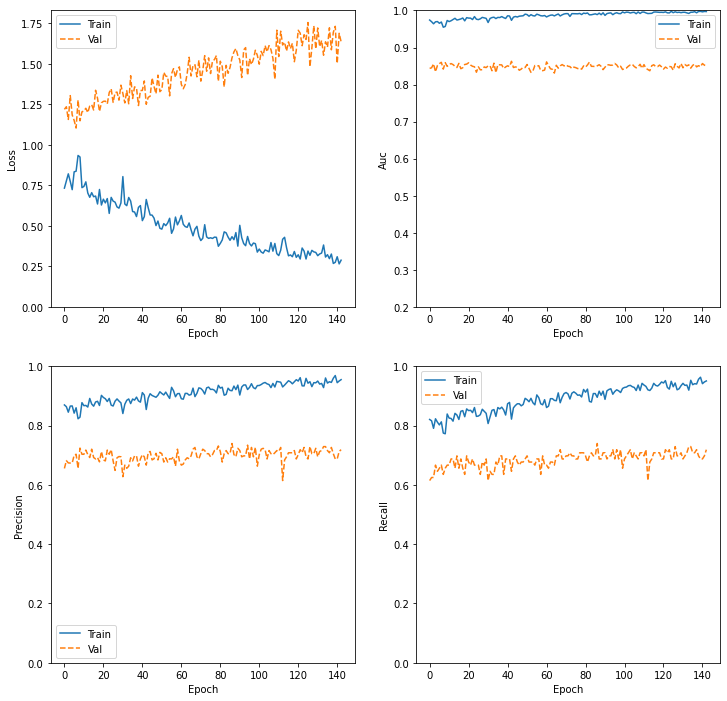

In [ ]:
plt.figure(figsize=(12, 12))

metrics_plot = ['loss', 'auc', 'precision', 'recall']
for n, metric in enumerate(metrics_plot):
  name = metric.replace("_"," ").capitalize()
  plt.subplot(2,2,n+1)
  plt.plot(history_w_mono_4.epoch, history_w_mono_4.history[metric], label='Train')
  plt.plot(history_w_mono_4.epoch, history_w_mono_4.history['val_'+metric], linestyle="--", label='Val')
  plt.xlabel('Epoch')
  plt.ylabel(name)
  if metric == 'loss':
    plt.ylim([0, plt.ylim()[1]])
  elif metric == 'auc':
    plt.ylim([0.2,1])
  else:
    plt.ylim([0,1])

  plt.legend()

In [ ]:
test_generator_mono.reset()

Y_pred_w = w_mono_comp_4.predict_generator(test_generator_mono)
y_pred_w = np.argmax(Y_pred_w, axis=1)
print('Confusion Matrix')
print(confusion_matrix(test_generator_mono.classes, y_pred_w))
print('Classification Report')
target_names = ['0.0', '0.33', '0.66', '1.0']
print(classification_report(test_generator_mono.classes, y_pred_w, target_names=target_names))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[58  2  4  3]
 [ 5  3  4  0]
 [ 4  0  2  0]
 [ 5  0  1 17]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.81      0.87      0.83        67
        0.33       0.60      0.25      0.35        12
        0.66       0.18      0.33      0.24         6
         1.0       0.85      0.74      0.79        23

    accuracy                           0.74       108
   macro avg       0.61      0.55      0.55       108
weighted avg       0.76      0.74      0.74       108



# **K-FOLDS 3-capes Mono**

In [ ]:
from sklearn.model_selection import StratifiedKFold

In [ ]:
#We don’t need to create X, because as mentioned in the documentation page for StratifiedKFold , it is sufficient to provide only the labels Y to generate the splits and hence we can put np.zeros(n_samples) instead of X.

train_df_mono = pd.read_csv(TFM_path+"mono_file.csv", dtype='str')
Y = train_df_mono[['probability']]
                         
skf = StratifiedKFold(n_splits = 10, random_state = 7, shuffle = True) 

In [ ]:
idg_train = ImageDataGenerator(rescale=1./255, validation_split=0.15)
idg_test = ImageDataGenerator(rescale=1./255)

In [ ]:
# We also need to save the best model in each fold.
# Auxiliary function for getting model name in each of the k iterations

def get_model_name(k):
    return '3-capes_kfolds_'+str(k)+'.h5'

In [ ]:
lab_mono = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFM/mono_file.csv')
total_monolab = lab_mono.groupby(['probability']).size().sum()

#dividit per 2 dona millors resultats
weight_for_0 = (1 / lab_mono.groupby(['probability']).size()[0])*(total_monolab)/2.0 
weight_for_03 = (1 / lab_mono.groupby(['probability']).size()[1/3])*(total_monolab)/2.0
weight_for_06 = (1 / lab_mono.groupby(['probability']).size()[2/3])*(total_monolab)/2.0
weight_for_1 = (1 / lab_mono.groupby(['probability']).size()[1])*(total_monolab)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

Weight for class 0.0: 0.91
Weight for class 0.33: 4.59
Weight for class 0.66: 9.59
Weight for class 1.0: 1.72


In [ ]:
def create_new_model():
  model = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),
    layers.Dropout(rate=0.4),

    layers.Flatten(),                                        
    layers.Dense(256,activation='relu'),
    layers.Dense(4, kernel_regularizer=keras.regularizers.l2(0.001), activation = 'softmax')  
    ])
  
  return model

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=150,
    mode='max',
    restore_best_weights=True)

## **Define & Train**

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/400
13/13 [==============================] - 457s 34s/step - loss: 3.8111 - tp: 0.0000e+00 - fp: 62.8571 - tn: 1344.1429 - fn: 469.0000 - accuracy: 0.0000e+00 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4904 - val_loss: 1.4529 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 432.0000 - val_fn: 144.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.3892

Epoch 00001: val_auc improved from -inf to 0.38920, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/3-capes_kfolds_1.h5
Epoch 2/400
13/13 [==============================] - 4s 308ms/step - loss: 2.7312 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 1409.1429 - fn: 469.7143 - accuracy: 0.0000e+00 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6746 - val_loss: 1.5128 - val_tp: 0.0000e

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[43  9  4  3]
 [ 3  5  2  1]
 [ 1  2  3  0]
 [10  2  2 18]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.75      0.73      0.74        59
        0.33       0.28      0.45      0.34        11
        0.66       0.27      0.50      0.35         6
         1.0       0.82      0.56      0.67        32

    accuracy                           0.64       108
   macro avg       0.53      0.56      0.53       108
weighted avg       0.70      0.64      0.66       108

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/400
13/13 [==============================] - 6s 370ms/step - loss: 3.8197 - tp: 110.0000 - fp: 196.1429 - tn: 1539.1429 - fn: 468.4286 - accuracy: 0.0000e+00 - precision: 0.3924 - recall: 0.2335 - auc: 0.6235 - val_loss: 1.5278 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[42  4  4  8]
 [ 3  7  2  0]
 [ 1  0  4  1]
 [ 7  2  2 21]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.79      0.72      0.76        58
        0.33       0.54      0.58      0.56        12
        0.66       0.33      0.67      0.44         6
         1.0       0.70      0.66      0.68        32

    accuracy                           0.69       108
   macro avg       0.59      0.66      0.61       108
weighted avg       0.71      0.69      0.69       108

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/400
13/13 [==============================] - 7s 364ms/step - loss: 3.7936 - tp: 129.7143 - fp: 165.9286 - tn: 1562.9286 - fn: 446.5714 - accuracy: 0.0000e+00 - precision: 0.4586 - recall: 0.2410 - auc: 0.6714 - val_loss: 1.6827 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[47  2  1  8]
 [ 1  7  2  2]
 [ 2  0  2  2]
 [ 5  2  1 24]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.85      0.81      0.83        58
        0.33       0.64      0.58      0.61        12
        0.66       0.33      0.33      0.33         6
         1.0       0.67      0.75      0.71        32

    accuracy                           0.74       108
   macro avg       0.62      0.62      0.62       108
weighted avg       0.75      0.74      0.74       108

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/400
13/13 [==============================] - 6s 369ms/step - loss: 3.2164 - tp: 164.5000 - fp: 118.4286 - tn: 1604.0000 - fn: 409.6429 - accuracy: 0.0000e+00 - precision: 0.5791 - recall: 0.3067 - auc: 0.7142 - val_loss: 2.0897 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[37 10  2 10]
 [ 3  8  0  1]
 [ 4  0  1  1]
 [ 3  0  4 24]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.79      0.63      0.70        59
        0.33       0.44      0.67      0.53        12
        0.66       0.14      0.17      0.15         6
         1.0       0.67      0.77      0.72        31

    accuracy                           0.65       108
   macro avg       0.51      0.56      0.53       108
weighted avg       0.68      0.65      0.65       108

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/400
13/13 [==============================] - 7s 400ms/step - loss: 2.6784 - tp: 169.5000 - fp: 150.1429 - tn: 1570.1429 - fn: 403.9286 - accuracy: 0.0000e+00 - precision: 0.5365 - recall: 0.3276 - auc: 0.7375 - val_loss: 1.8782 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[49  7  0  3]
 [ 5  7  0  0]
 [ 2  3  0  0]
 [ 5  3  1 22]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.80      0.83      0.82        59
        0.33       0.35      0.58      0.44        12
        0.66       0.00      0.00      0.00         5
         1.0       0.88      0.71      0.79        31

    accuracy                           0.73       107
   macro avg       0.51      0.53      0.51       107
weighted avg       0.74      0.73      0.73       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/400
13/13 [==============================] - 6s 372ms/step - loss: 4.1403 - tp: 166.6429 - fp: 210.3571 - tn: 1521.9286 - fn: 410.7857 - accuracy: 0.0000e+00 - precision: 0.4910 - recall: 0.3302 - auc: 0.7201 - val_loss: 1.5145 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[38  6  5 10]
 [ 2  8  2  0]
 [ 0  2  3  0]
 [ 3  1  3 24]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.64      0.75        59
        0.33       0.47      0.67      0.55        12
        0.66       0.23      0.60      0.33         5
         1.0       0.71      0.77      0.74        31

    accuracy                           0.68       107
   macro avg       0.57      0.67      0.59       107
weighted avg       0.76      0.68      0.70       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/400
13/13 [==============================] - 6s 376ms/step - loss: 3.3700 - tp: 144.3571 - fp: 102.0000 - tn: 1630.2857 - fn: 433.0714 - accuracy: 0.0000e+00 - precision: 0.5958 - recall: 0.2905 - auc: 0.5768 - val_loss: 1.5773 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[47  6  2  4]
 [ 7  5  0  0]
 [ 5  0  0  0]
 [12  1  2 16]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.66      0.80      0.72        59
        0.33       0.42      0.42      0.42        12
        0.66       0.00      0.00      0.00         5
         1.0       0.80      0.52      0.63        31

    accuracy                           0.64       107
   macro avg       0.47      0.43      0.44       107
weighted avg       0.64      0.64      0.63       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/400
13/13 [==============================] - 7s 412ms/step - loss: 4.4449 - tp: 112.7143 - fp: 257.0000 - tn: 1477.4286 - fn: 465.4286 - accuracy: 0.0000e+00 - precision: 0.3426 - recall: 0.2270 - auc: 0.6008 - val_loss: 1.6183 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[40  3  5 11]
 [ 4  5  1  2]
 [ 1  0  2  2]
 [ 1  0  0 30]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.68      0.76        59
        0.33       0.62      0.42      0.50        12
        0.66       0.25      0.40      0.31         5
         1.0       0.67      0.97      0.79        31

    accuracy                           0.72       107
   macro avg       0.60      0.62      0.59       107
weighted avg       0.75      0.72      0.72       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/400
13/13 [==============================] - 7s 385ms/step - loss: 5.2482 - tp: 162.7143 - fp: 186.9286 - tn: 1536.7857 - fn: 411.8571 - accuracy: 0.0000e+00 - precision: 0.4777 - recall: 0.3033 - auc: 0.6216 - val_loss: 2.0453 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[53  1  3  2]
 [ 5  4  1  1]
 [ 4  0  0  2]
 [ 5  0  1 25]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.79      0.90      0.84        59
        0.33       0.80      0.36      0.50        11
        0.66       0.00      0.00      0.00         6
         1.0       0.83      0.81      0.82        31

    accuracy                           0.77       107
   macro avg       0.61      0.52      0.54       107
weighted avg       0.76      0.77      0.75       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/400
13/13 [==============================] - 6s 369ms/step - loss: 2.9367 - tp: 127.5000 - fp: 173.7857 - tn: 1543.5000 - fn: 444.9286 - accuracy: 0.0000e+00 - precision: 0.4625 - recall: 0.2694 - auc: 0.7407 - val_loss: 1.3599 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[25  7  5 22]
 [ 2  4  2  3]
 [ 0  1  3  2]
 [ 1  1  2 27]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.42      0.57        59
        0.33       0.31      0.36      0.33        11
        0.66       0.25      0.50      0.33         6
         1.0       0.50      0.87      0.64        31

    accuracy                           0.55       107
   macro avg       0.49      0.54      0.47       107
weighted avg       0.68      0.55      0.55       107



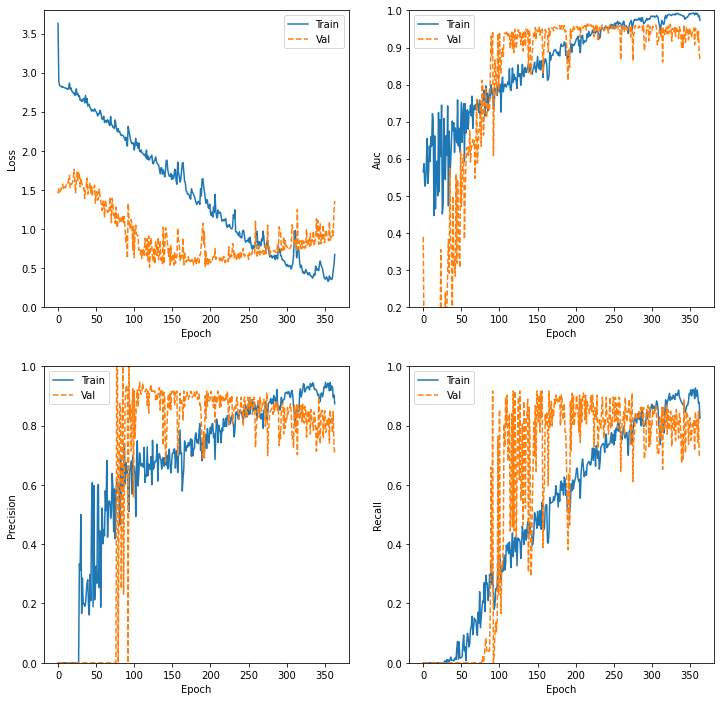

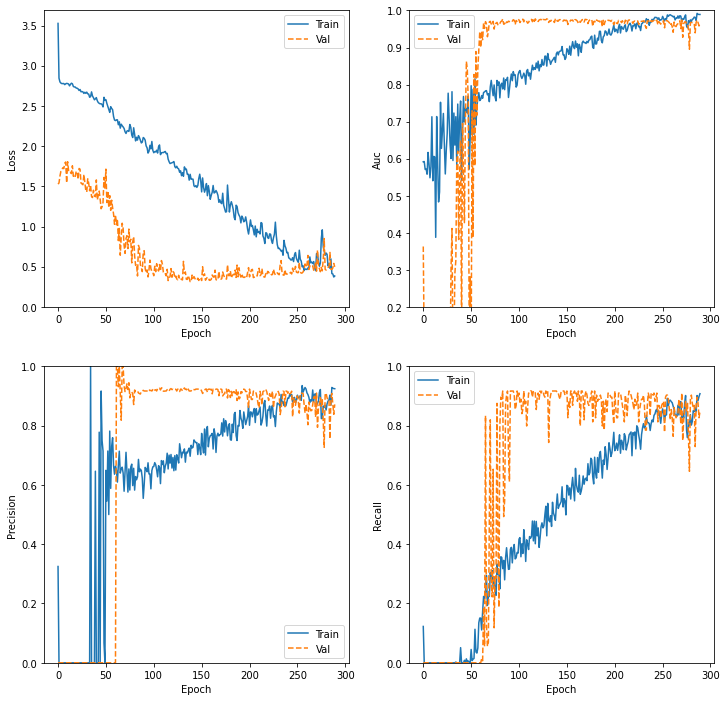

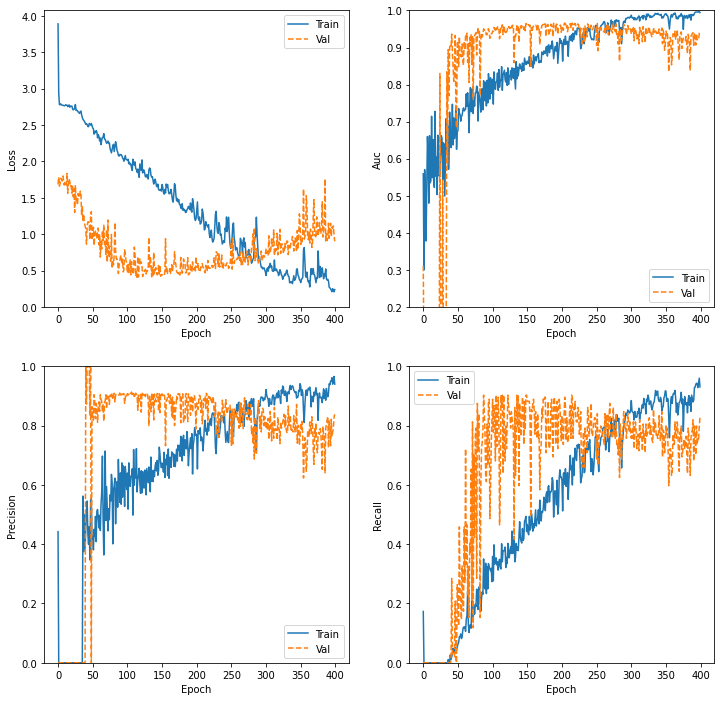

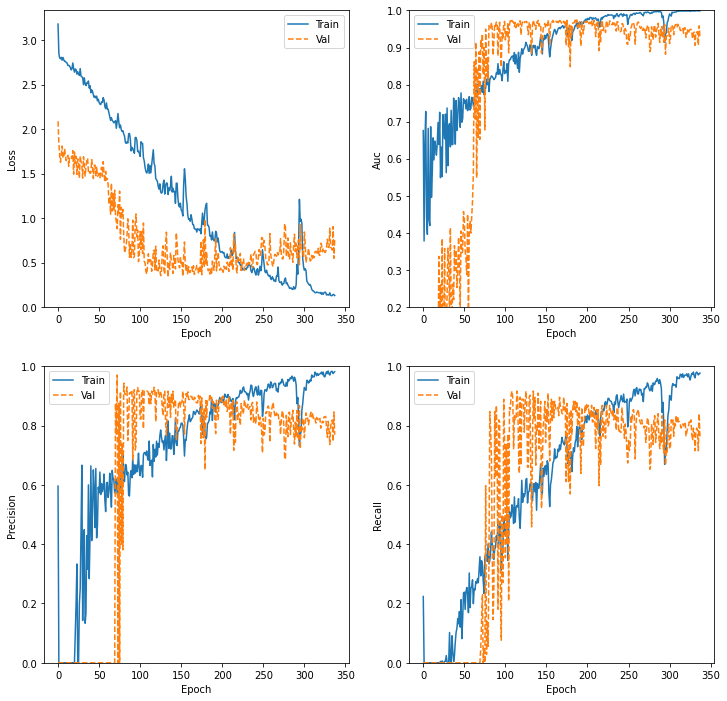

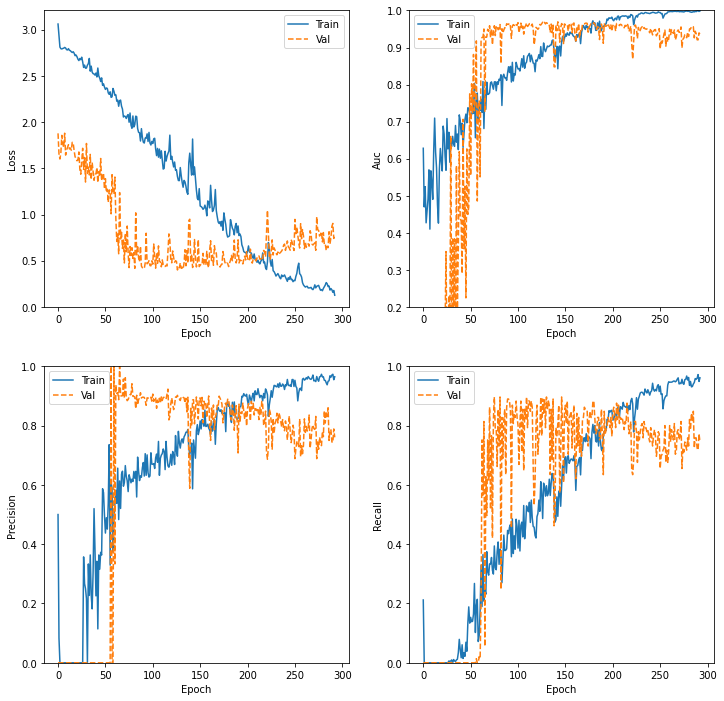

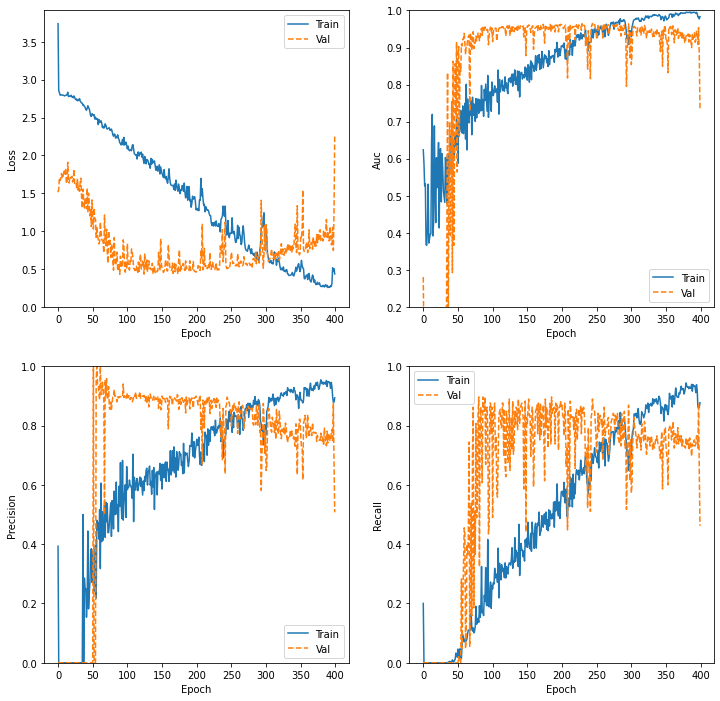

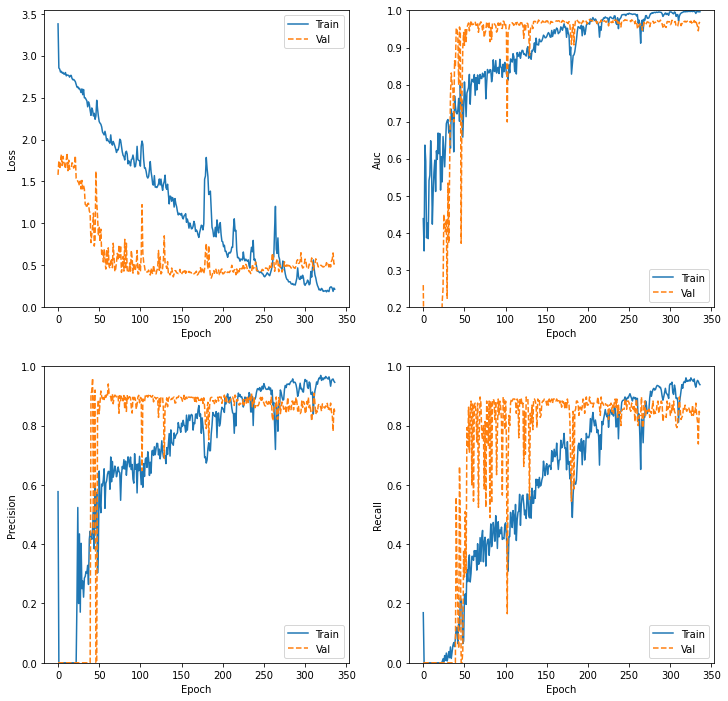

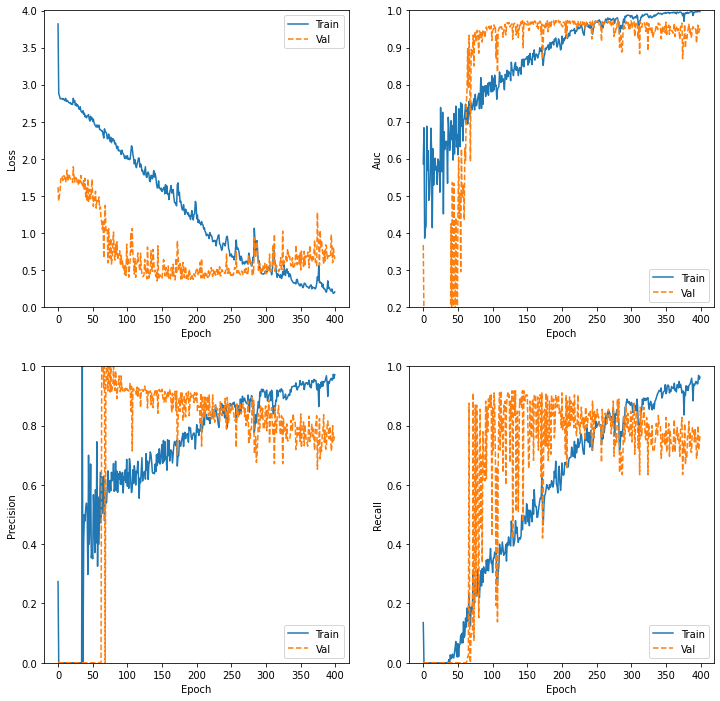

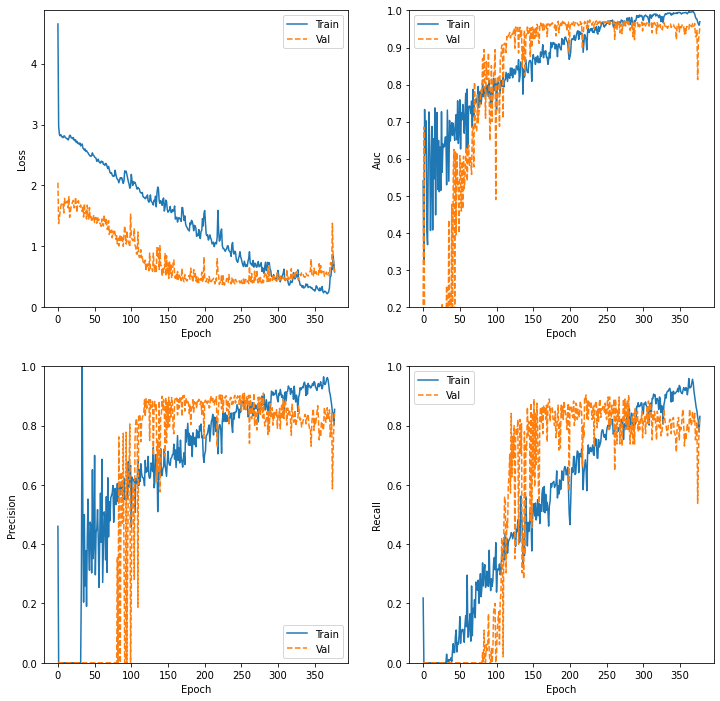

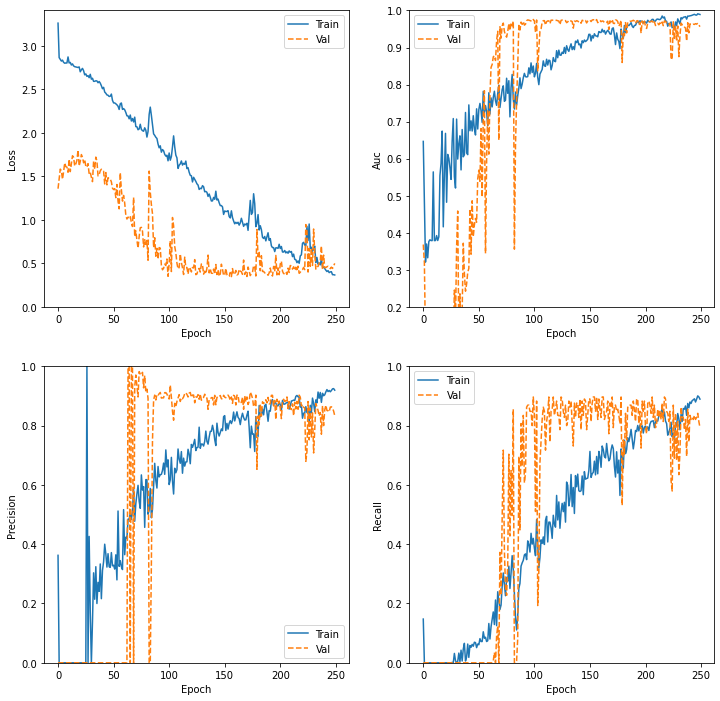

In [ ]:
VAL_LOSS = []
VAL_PRECISION =[]
VAL_RECALL=[]
VAL_AUC =[]

save_dir = '/content/drive/MyDrive/Colab Notebooks/TFM/'
fold_var = 1

for train_index, test_index in skf.split(np.zeros(1074),Y):
  training_data = train_df_mono.iloc[train_index]
  test_data = train_df_mono.iloc[test_index]


  train_data_generator = idg_train.flow_from_dataframe(training_data, 
                                                directory = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                                x_col = "image", 
                                                y_col = "probability",
                                                color_mode='rgb',
                                                subset = 'training',
                                                batch_size=64,
                                                shuffle=False,
                                                class_mode="categorical",
                                                target_size=(300,300))
  
  valid_data_generator=idg_train.flow_from_dataframe(training_data,
                                               directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                               x_col="image",
                                               y_col="probability",
                                               color_mode='rgb',
                                               subset="validation",
                                               batch_size=64,
                                               shuffle=False,
                                               class_mode="categorical",
                                               target_size=(300,300))

  test_data_generator  = idg_test.flow_from_dataframe(test_data, 
                                                 directory = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                                 x_col = "image",
                                                 y_col = "probability",
                                                 class_mode = "categorical", 
                                                 shuffle = False,
                                                 color_mode='rgb',
                                                 batch_size=1,
                                                 target_size=(300,300))
  #CREATE NEW MODEL
  model = create_new_model()

  #COMPILE NEW MODEL
  model.compile(loss='categorical_crossentropy',
		      optimizer=keras.optimizers.Adam(lr=0.0001),
		      metrics=METRICS)
  
  # CREATE CALLBACKS
  checkpoint = tf.keras.callbacks.ModelCheckpoint(save_dir+get_model_name(fold_var),
                                                 monitor='val_auc',
                                                 verbose=1,
                                                 save_best_only=True,
                                                 mode='max')
  callbacks_list = [checkpoint, early_stopping]
  
  # FIT THE MODEL
  history = model.fit(train_data_generator,
                      epochs=400,
                      callbacks=callbacks_list,
                      class_weight=class_weight,
                      validation_data=valid_data_generator)
  
  #PLOT HISTORY
  plt.figure(figsize=(12, 12))

  metrics_plot = ['loss', 'auc', 'precision', 'recall']
  for n, metric in enumerate(metrics_plot):
    name = metric.replace("_"," ").capitalize()
    plt.subplot(2,2,n+1)
    plt.plot(history.epoch, history.history[metric], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    if metric == 'loss':
      plt.ylim([0, plt.ylim()[1]])
    elif metric == 'auc':
      plt.ylim([0.2,1])
    else:
      plt.ylim([0,1])
    plt.legend()
    
  # LOAD BEST MODEL to evaluate the performance of the model
  model.load_weights(save_dir+get_model_name(fold_var))
  

  results = model.evaluate(test_data_generator)
  results = dict(zip(model.metrics_names,results))
  
  VAL_LOSS.append(results['loss'])
  VAL_PRECISION.append(results['precision'])
  VAL_RECALL.append(results['recall'])
  VAL_AUC.append(results['auc'])

  test_data_generator.reset()
  Y_pred = model.predict_generator(test_data_generator)
  y_pred = np.argmax(Y_pred, axis=1)
  print('Confusion Matrix')
  print(confusion_matrix(test_data_generator.classes, y_pred))
  print('Classification Report')
  target_names = ['0.0', '0.33', '0.66', '1.0']
  print(classification_report(test_data_generator.classes, y_pred, target_names=target_names))
  
  fold_var += 1
  keras.backend.clear_session()

# **K-FOLDS- Transfer Learning Mono**

In [ ]:
from sklearn.model_selection import StratifiedKFold

In [ ]:
#We don’t need to create X, because as mentioned in the documentation page for StratifiedKFold , it is sufficient to provide only the labels Y to generate the splits and hence we can put np.zeros(n_samples) instead of X.

train_df_mono = pd.read_csv(TFM_path+"mono_file.csv", dtype='str')
Y = train_df_mono[['probability']]
                         
skf = StratifiedKFold(n_splits = 10, random_state = 7, shuffle = True) 

In [ ]:
idg_train = ImageDataGenerator(rescale=1./255, validation_split=0.15)
idg_test = ImageDataGenerator(rescale=1./255)

In [ ]:
# We also need to save the best model in each fold.
# Auxiliary function for getting model name in each of the k iterations

def get_model_name(k):
    return 'kfolds_TransferLearn_'+str(k)+'.h5'

In [ ]:
lab_mono = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFM/mono_file.csv')
total_monolab = lab_mono.groupby(['probability']).size().sum()

#dividit per 2 dona millors resultats
weight_for_0 = (1 / lab_mono.groupby(['probability']).size()[0])*(total_monolab)/2.0 
weight_for_03 = (1 / lab_mono.groupby(['probability']).size()[1/3])*(total_monolab)/2.0
weight_for_06 = (1 / lab_mono.groupby(['probability']).size()[2/3])*(total_monolab)/2.0
weight_for_1 = (1 / lab_mono.groupby(['probability']).size()[1])*(total_monolab)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

Weight for class 0.0: 0.91
Weight for class 0.33: 4.59
Weight for class 0.66: 9.59
Weight for class 1.0: 1.72


In [ ]:
def create_new_model():

  model_TF = VGG16(weights='imagenet', include_top=False, input_shape=(300, 300, 3))
  # i.e. freeze all convolutional VGG16 layers
  for layer in model_TF.layers:
      layer.trainable = False

  flat1 = Flatten()(model_TF.layers[-1].output)
  class1 = Dense(256, activation='relu')(flat1)
  output = Dense(4, kernel_regularizer=keras.regularizers.l2(0.001), activation='softmax')(class1)

  # this is the model we will train
  model_TF = Model(inputs = model_TF.inputs, outputs = output)

  return model_TF

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=100,
    mode='max',
    restore_best_weights=True)

## **Define & train**

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
58892288/58889256 [==============================] - 1s 0us/step
Epoch 1/350
13/13 [==============================] - 19s 924ms/step - loss: 4.8932 - tp: 96.5714 - fp: 308.2857 - tn: 1424.0000 - fn: 480.8571 - accuracy: 0.0000e+00 - precision: 0.2831 - recall: 0.1845 - auc: 0.5514 - val_loss: 3.1520 - val_tp: 0.0000e+00 - val_fp: 144.0000 - val_tn: 288.0000 - val_fn: 144.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.0446

Epoch 00001: val_auc improved from -inf to 0.04457, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/kfolds_TransferLearn_1.h5
Epoch 2/350
13/13 [==============================] - 4s 313ms/step - loss: 3.1671 - tp: 81.5000 - fp: 159.2143 - tn: 1247.7857 - fn: 387.5000 - accuracy: 0.0000e+00 - precision: 0.2973 - recall: 0.1595 - a

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[49  4  1  5]
 [ 5  5  0  1]
 [ 1  2  2  1]
 [ 7  1  0 24]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.79      0.83      0.81        59
        0.33       0.42      0.45      0.43        11
        0.66       0.67      0.33      0.44         6
         1.0       0.77      0.75      0.76        32

    accuracy                           0.74       108
   macro avg       0.66      0.59      0.61       108
weighted avg       0.74      0.74      0.74       108

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/350
13/13 [==============================] - 7s 405ms/step - loss: 4.0430 - tp: 171.2857 - fp: 256.6429 - tn: 1467.9286 - fn: 403.5714 - accuracy: 0.0000e+00 - precision: 0.4690 - recall: 0.3411 - auc: 0.6940 - val_loss: 1.0421 - val_tp: 11.0000 - val_fp: 71.0000 - val_tn: 361

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[48  3  2  5]
 [ 2  9  1  0]
 [ 3  0  3  0]
 [10  2  0 20]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.76      0.83      0.79        58
        0.33       0.64      0.75      0.69        12
        0.66       0.50      0.50      0.50         6
         1.0       0.80      0.62      0.70        32

    accuracy                           0.74       108
   macro avg       0.68      0.68      0.67       108
weighted avg       0.75      0.74      0.74       108

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/350
13/13 [==============================] - 7s 399ms/step - loss: 3.3583 - tp: 152.7857 - fp: 288.5714 - tn: 1453.1429 - fn: 427.7857 - accuracy: 0.0000e+00 - precision: 0.4036 - recall: 0.2927 - auc: 0.7244 - val_loss: 2.2496 - val_tp: 1.0000 - val_fp: 70.0000 - val_tn: 362.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[53  2  1  2]
 [ 4  6  2  0]
 [ 3  1  2  0]
 [ 3  1  2 26]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.84      0.91      0.88        58
        0.33       0.60      0.50      0.55        12
        0.66       0.29      0.33      0.31         6
         1.0       0.93      0.81      0.87        32

    accuracy                           0.81       108
   macro avg       0.66      0.64      0.65       108
weighted avg       0.81      0.81      0.80       108

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/350
13/13 [==============================] - 7s 411ms/step - loss: 4.7712 - tp: 182.2143 - fp: 275.8571 - tn: 1468.0000 - fn: 399.0714 - accuracy: 0.0000e+00 - precision: 0.4214 - recall: 0.3158 - auc: 0.5793 - val_loss: 1.3977 - val_tp: 0.0000e+00 - val_fp: 110.0000 - val_tn:

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[40  6  4  9]
 [ 4  5  1  2]
 [ 5  0  1  0]
 [ 2  0  3 26]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.78      0.68      0.73        59
        0.33       0.45      0.42      0.43        12
        0.66       0.11      0.17      0.13         6
         1.0       0.70      0.84      0.76        31

    accuracy                           0.67       108
   macro avg       0.51      0.53      0.52       108
weighted avg       0.69      0.67      0.67       108

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/350
13/13 [==============================] - 9s 556ms/step - loss: 4.2913 - tp: 93.5714 - fp: 222.5714 - tn: 1517.0000 - fn: 486.2857 - accuracy: 0.0000e+00 - precision: 0.3319 - recall: 0.1924 - auc: 0.5613 - val_loss: 3.9336 - val_tp: 1.0000 - val_fp: 37.0000 - val_tn: 398.0

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[55  4  0  0]
 [ 5  7  0  0]
 [ 3  1  1  0]
 [10  1  0 20]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.75      0.93      0.83        59
        0.33       0.54      0.58      0.56        12
        0.66       1.00      0.20      0.33         5
         1.0       1.00      0.65      0.78        31

    accuracy                           0.78       107
   macro avg       0.82      0.59      0.63       107
weighted avg       0.81      0.78      0.77       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/350
13/13 [==============================] - 7s 400ms/step - loss: 4.2023 - tp: 165.9286 - fp: 273.0000 - tn: 1444.2857 - fn: 406.5000 - accuracy: 0.0000e+00 - precision: 0.4211 - recall: 0.3133 - auc: 0.6896 - val_loss: 3.6095 - val_tp: 1.0000 - val_fp: 29.0000 - val_tn: 406.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[52  1  3  3]
 [ 5  6  1  0]
 [ 0  2  3  0]
 [ 5  1  2 23]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.84      0.88      0.86        59
        0.33       0.60      0.50      0.55        12
        0.66       0.33      0.60      0.43         5
         1.0       0.88      0.74      0.81        31

    accuracy                           0.79       107
   macro avg       0.66      0.68      0.66       107
weighted avg       0.80      0.79      0.79       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/350
13/13 [==============================] - 7s 427ms/step - loss: 3.8713 - tp: 177.7143 - fp: 105.0000 - tn: 1612.2857 - fn: 394.7143 - accuracy: 0.0000e+00 - precision: 0.6663 - recall: 0.3531 - auc: 0.6427 - val_loss: 2.5248 - val_tp: 1.0000 - val_fp: 100.0000 - val_tn: 335

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[45  6  5  3]
 [ 5  5  2  0]
 [ 4  1  0  0]
 [ 7  0  7 17]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.74      0.76      0.75        59
        0.33       0.42      0.42      0.42        12
        0.66       0.00      0.00      0.00         5
         1.0       0.85      0.55      0.67        31

    accuracy                           0.63       107
   macro avg       0.50      0.43      0.46       107
weighted avg       0.70      0.63      0.65       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/350
13/13 [==============================] - 7s 410ms/step - loss: 4.4091 - tp: 110.8571 - fp: 259.3571 - tn: 1475.0714 - fn: 467.2857 - accuracy: 0.0000e+00 - precision: 0.3356 - recall: 0.2152 - auc: 0.5959 - val_loss: 1.6966 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[51  1  1  6]
 [ 5  6  1  0]
 [ 3  1  1  0]
 [ 5  0  0 26]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.80      0.86      0.83        59
        0.33       0.75      0.50      0.60        12
        0.66       0.33      0.20      0.25         5
         1.0       0.81      0.84      0.83        31

    accuracy                           0.79       107
   macro avg       0.67      0.60      0.63       107
weighted avg       0.77      0.79      0.78       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/350
13/13 [==============================] - 8s 477ms/step - loss: 4.3781 - tp: 160.0000 - fp: 291.5714 - tn: 1447.1429 - fn: 419.5714 - accuracy: 0.0000e+00 - precision: 0.4321 - recall: 0.3153 - auc: 0.6254 - val_loss: 0.9631 - val_tp: 7.0000 - val_fp: 22.0000 - val_tn: 413.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[51  3  3  2]
 [ 6  4  0  1]
 [ 4  1  1  0]
 [ 6  1  3 21]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.76      0.86      0.81        59
        0.33       0.44      0.36      0.40        11
        0.66       0.14      0.17      0.15         6
         1.0       0.88      0.68      0.76        31

    accuracy                           0.72       107
   macro avg       0.56      0.52      0.53       107
weighted avg       0.73      0.72      0.72       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/350
13/13 [==============================] - 7s 396ms/step - loss: 5.1388 - tp: 82.8571 - fp: 269.5714 - tn: 1473.4286 - fn: 498.1429 - accuracy: 0.0000e+00 - precision: 0.2942 - recall: 0.1786 - auc: 0.5710 - val_loss: 1.0654 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[52  2  5  0]
 [ 2  3  6  0]
 [ 1  1  4  0]
 [ 4  1  2 24]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88        59
        0.33       0.43      0.27      0.33        11
        0.66       0.24      0.67      0.35         6
         1.0       1.00      0.77      0.87        31

    accuracy                           0.78       107
   macro avg       0.64      0.65      0.61       107
weighted avg       0.83      0.78      0.79       107



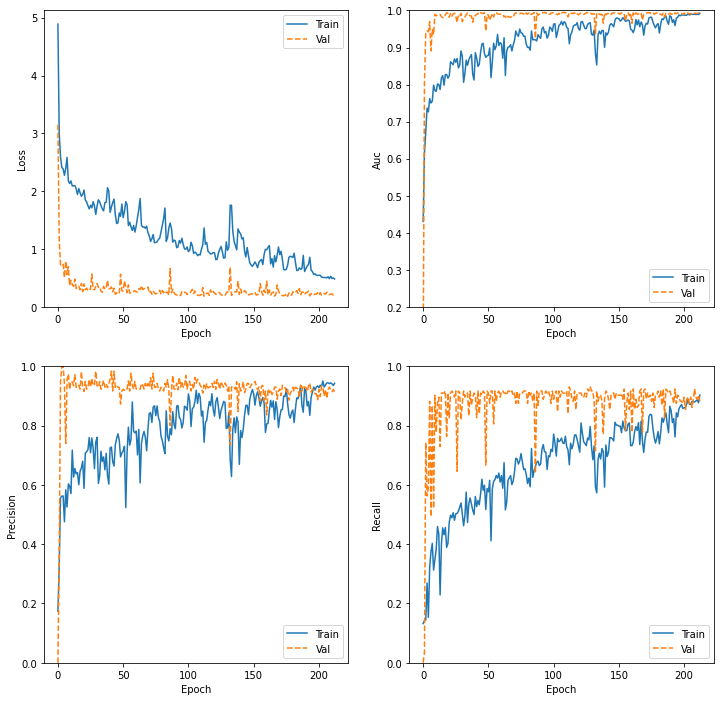

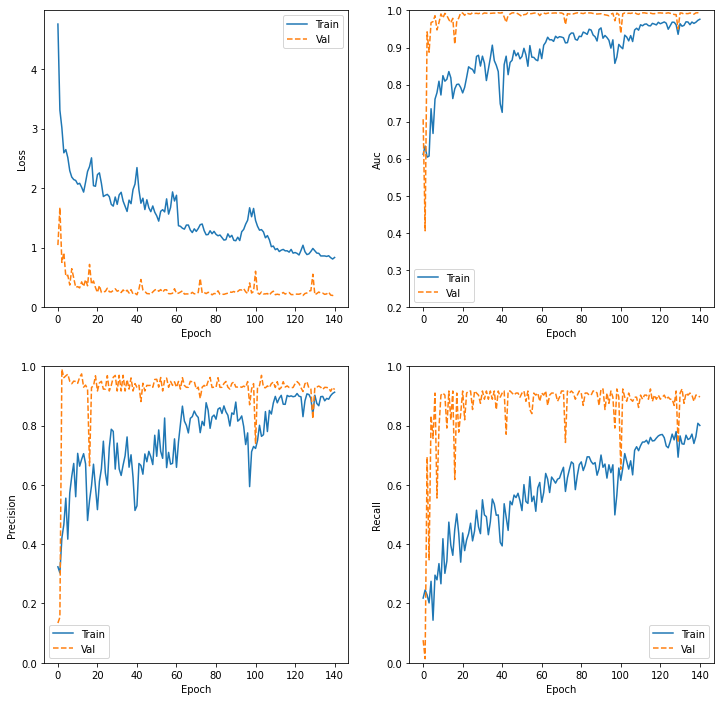

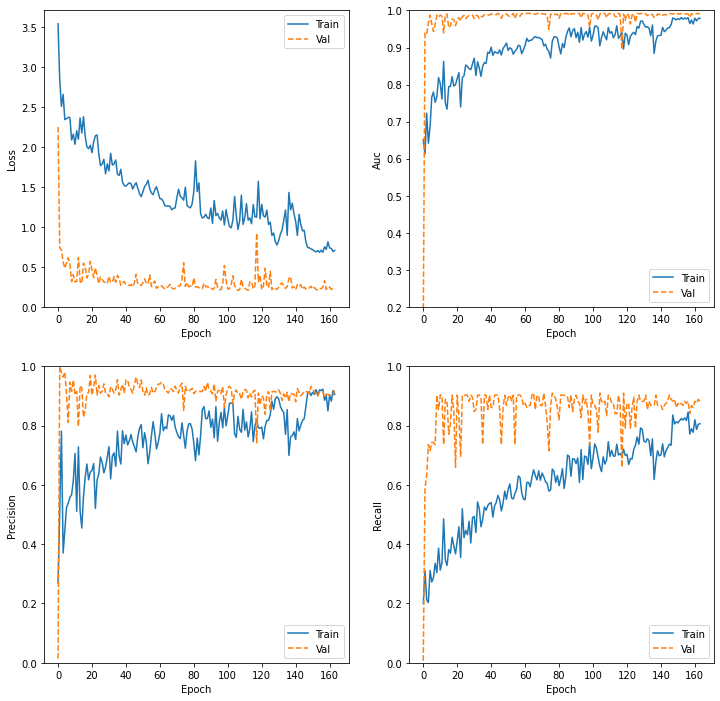

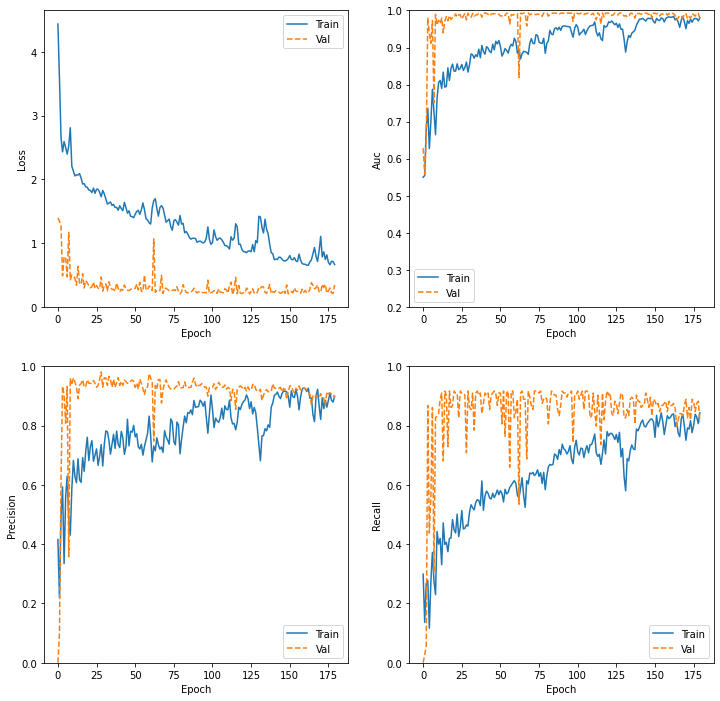

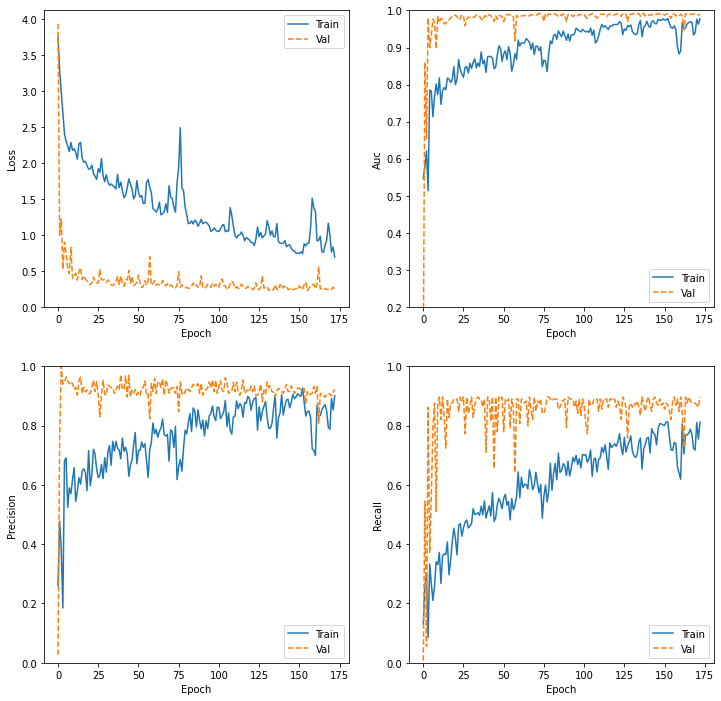

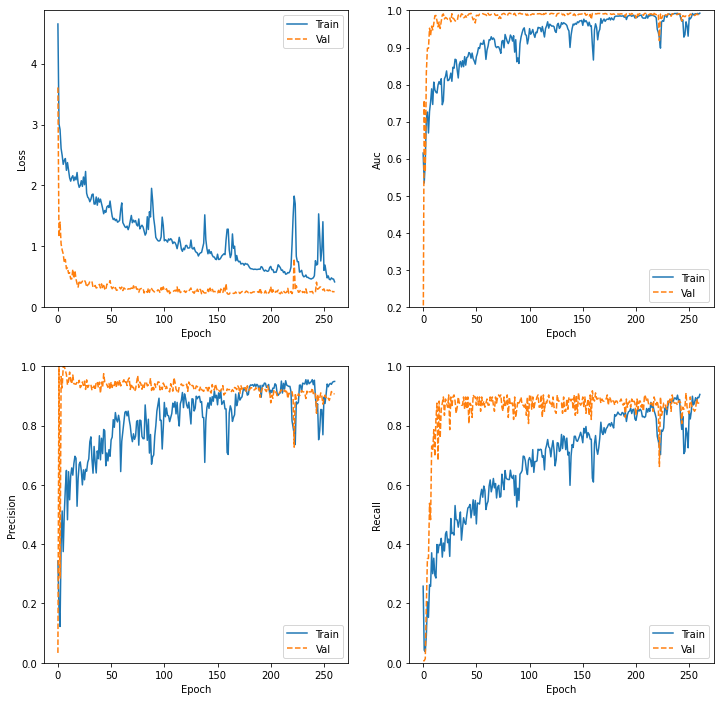

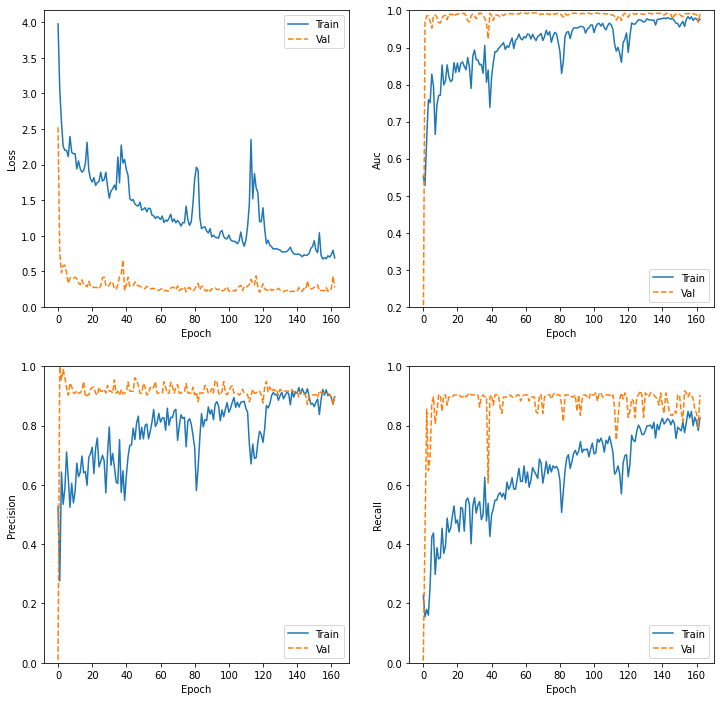

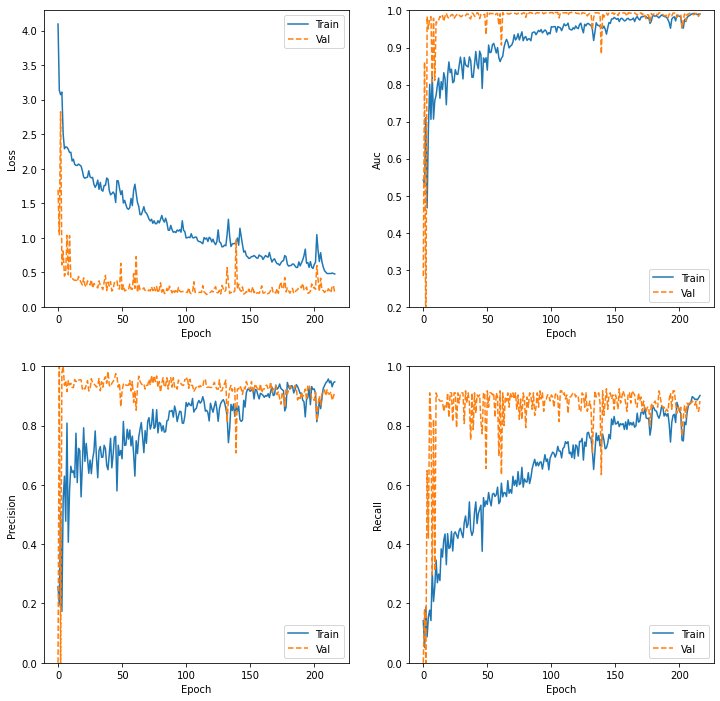

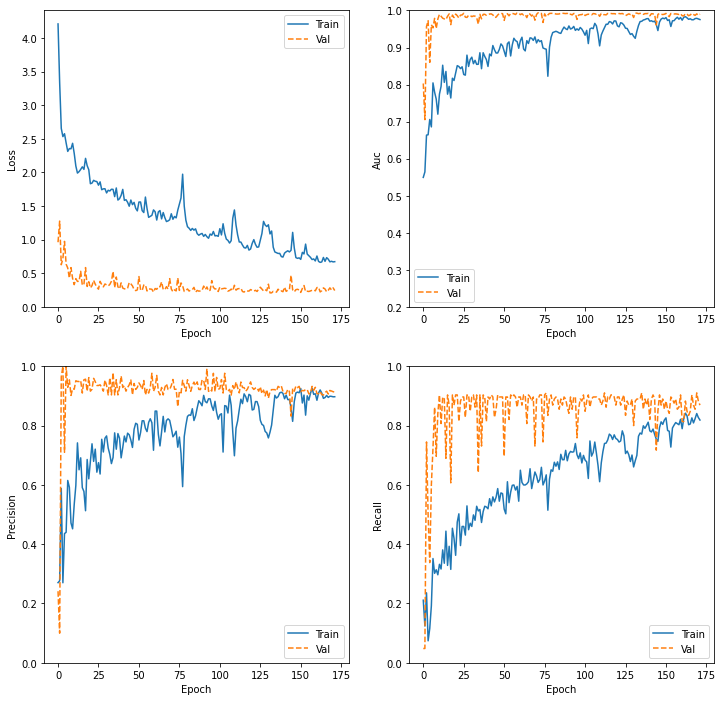

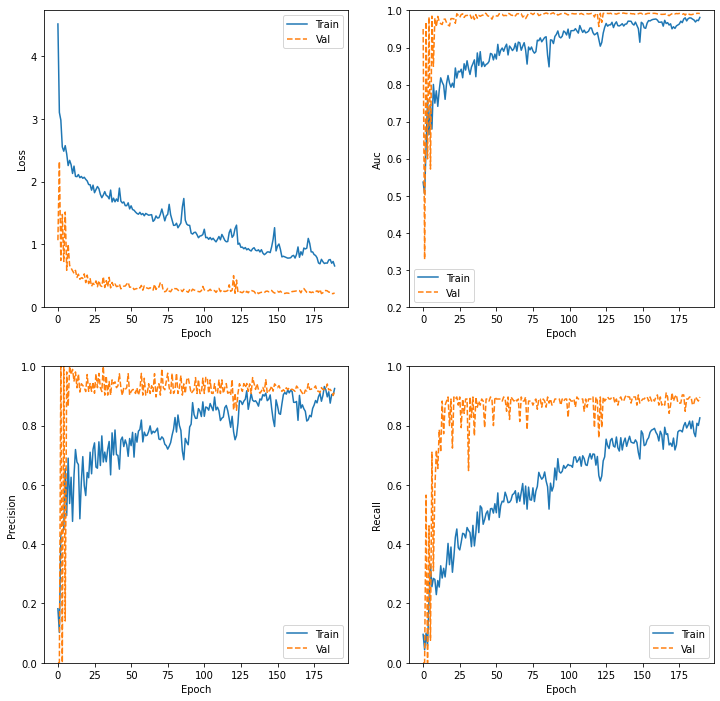

In [ ]:
VAL_LOSS = []
VAL_PRECISION =[]
VAL_RECALL=[]
VAL_AUC =[]

save_dir = '/content/drive/MyDrive/Colab Notebooks/TFM/'
fold_var = 1

for train_index, test_index in skf.split(np.zeros(1074),Y):
  training_data = train_df_mono.iloc[train_index]
  test_data = train_df_mono.iloc[test_index]


  train_data_generator = idg_train.flow_from_dataframe(training_data, 
                                                directory = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                                x_col = "image", 
                                                y_col = "probability",
                                                color_mode='rgb',
                                                subset = 'training',
                                                batch_size=64,
                                                shuffle=False,
                                                class_mode="categorical",
                                                target_size=(300,300))
  
  valid_data_generator=idg_train.flow_from_dataframe(training_data,
                                               directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                               x_col="image",
                                               y_col="probability",
                                               color_mode='rgb',
                                               subset="validation",
                                               batch_size=64,
                                               shuffle=False,
                                               class_mode="categorical",
                                               target_size=(300,300))

  test_data_generator  = idg_test.flow_from_dataframe(test_data, 
                                                 directory = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                                 x_col = "image",
                                                 y_col = "probability",
                                                 class_mode = "categorical", 
                                                 shuffle = False,
                                                 color_mode='rgb',
                                                 batch_size=1,
                                                 target_size=(300,300))
  #CREATE NEW MODEL
  model = create_new_model()

  #COMPILE NEW MODEL
  model.compile(loss='categorical_crossentropy',
		      optimizer=keras.optimizers.Adam(lr=0.0001),
		      metrics=METRICS)
  
  # CREATE CALLBACKS
  checkpoint = tf.keras.callbacks.ModelCheckpoint(save_dir+get_model_name(fold_var),
                                                 monitor='val_auc',
                                                 verbose=1,
                                                 save_best_only=True,
                                                 mode='max')
  callbacks_list = [checkpoint, early_stopping]
  
  # FIT THE MODEL
  history = model.fit(train_data_generator,
                      epochs=350,
                      callbacks=callbacks_list,
                      class_weight=class_weight,
                      validation_data=valid_data_generator)
  
  #PLOT HISTORY
  plt.figure(figsize=(12, 12))

  metrics_plot = ['loss', 'auc', 'precision', 'recall']
  for n, metric in enumerate(metrics_plot):
    name = metric.replace("_"," ").capitalize()
    plt.subplot(2,2,n+1)
    plt.plot(history.epoch, history.history[metric], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    if metric == 'loss':
      plt.ylim([0, plt.ylim()[1]])
    elif metric == 'auc':
      plt.ylim([0.2,1])
    else:
      plt.ylim([0,1])
    plt.legend()
    
  # LOAD BEST MODEL to evaluate the performance of the model
  model.load_weights(save_dir+get_model_name(fold_var))
  

  results = model.evaluate(test_data_generator)
  results = dict(zip(model.metrics_names,results))
  
  VAL_LOSS.append(results['loss'])
  VAL_PRECISION.append(results['precision'])
  VAL_RECALL.append(results['recall'])
  VAL_AUC.append(results['auc'])

  test_data_generator.reset()
  Y_pred = model.predict_generator(test_data_generator)
  y_pred = np.argmax(Y_pred, axis=1)
  print('Confusion Matrix')
  print(confusion_matrix(test_data_generator.classes, y_pred))
  print('Classification Report')
  target_names = ['0.0', '0.33', '0.66', '1.0']
  print(classification_report(test_data_generator.classes, y_pred, target_names=target_names))
  
  fold_var += 1
  keras.backend.clear_session()

# **K-FOLDS- Transfer Learning Poli**

In [ ]:
from sklearn.model_selection import StratifiedKFold

In [ ]:
#We don’t need to create X, because as mentioned in the documentation page for StratifiedKFold , it is sufficient to provide only the labels Y to generate the splits and hence we can put np.zeros(n_samples) instead of X.

train_df_poly = pd.read_csv(TFM_path+"poly_file.csv", dtype='str')
Y = train_df_poly[['probability']]
                         
skf = StratifiedKFold(n_splits = 10, random_state = 7, shuffle = True) 

In [ ]:
idg_train = ImageDataGenerator(rescale=1./255, validation_split=0.15)
idg_test = ImageDataGenerator(rescale=1./255)

In [ ]:
# We also need to save the best model in each fold.
# Auxiliary function for getting model name in each of the k iterations

def get_model_name(k):
    return 'kfolds_TransferLearn_poly_'+str(k)+'.h5'

In [ ]:
lab_poly = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFM/poly_file.csv')
total_polylab = lab_poly.groupby(['probability']).size().sum()

#dividit per 2 dona millors resultats
weight_for_0 = (1 / lab_poly.groupby(['probability']).size()[0])*(total_polylab)/2.0 
weight_for_03 = (1 / lab_poly.groupby(['probability']).size()[1/3])*(total_polylab)/2.0
weight_for_06 = (1 / lab_poly.groupby(['probability']).size()[2/3])*(total_polylab)/2.0+1
weight_for_1 = (1 / lab_poly.groupby(['probability']).size()[1])*(total_polylab)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

Weight for class 0.0: 0.84
Weight for class 0.33: 4.35
Weight for class 0.66: 16.50
Weight for class 1.0: 1.93


In [ ]:
def create_new_model():

  model_TF = VGG16(weights='imagenet', include_top=False, input_shape=(300, 300, 3))
  # i.e. freeze all convolutional VGG16 layers
  for layer in model_TF.layers:
      layer.trainable = False

  flat1 = Flatten()(model_TF.layers[-1].output)
  class1 = Dense(256, activation='relu')(flat1)
  output = Dense(4, kernel_regularizer=keras.regularizers.l2(0.1), activation='softmax')(class1)

  # this is the model we will train
  model_TF = Model(inputs = model_TF.inputs, outputs = output)

  return model_TF

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=150,
    mode='max',
    restore_best_weights=True)

## **Define & train**

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
58892288/58889256 [==============================] - 2s 0us/step
Epoch 1/350
19/19 [==============================] - 744s 38s/step - loss: 4.2579 - tp: 68.1500 - fp: 234.2000 - tn: 1700.2000 - fn: 576.6500 - accuracy: 0.0000e+00 - precision: 0.2548 - recall: 0.0951 - auc: 0.5591 - val_loss: 2.1275 - val_tp: 5.0000 - val_fp: 2.0000 - val_tn: 625.0000 - val_fn: 204.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.7143 - val_recall: 0.0239 - val_auc: 0.6347

Epoch 00001: val_auc improved from -inf to 0.63473, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/kfolds_TransferLearn_poly_1.h5
Epoch 2/350
19/19 [==============================] - 6s 301ms/step - loss: 3.1107 - tp: 47.9000 - fp: 43.0500 - tn: 1886.8500 - fn: 595.4000 - accuracy: 0.0000e+00 - precision: 0.6648 - recall: 0.0692 - auc: 0.7635

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[88  1  0  3]
 [11  6  0  0]
 [ 3  2  0  0]
 [18  1  0 22]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.73      0.96      0.83        92
        0.33       0.60      0.35      0.44        17
        0.66       0.00      0.00      0.00         5
         1.0       0.88      0.54      0.67        41

    accuracy                           0.75       155
   macro avg       0.55      0.46      0.49       155
weighted avg       0.73      0.75      0.72       155



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/350
19/19 [==============================] - 8s 349ms/step - loss: 4.3413 - tp: 157.3000 - fp: 352.1500 - tn: 2029.2500 - fn: 636.5000 - accuracy: 0.0000e+00 - precision: 0.3453 - recall: 0.2361 - auc: 0.6146 - val_loss: 2.3827 - val_tp: 3.0000 - val_fp: 19.0000 - val_tn: 608.0000 - val_fn: 206.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.1364 - val_recall: 0.0144 - val_auc: 0.4123

Epoch 00001: val_auc improved from -inf to 0.41229, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/kfolds_TransferLearn_poly_2.h5
Epoch 2/350
19/19 [==============================] - 8s 402ms/step - loss: 3.0833 - tp: 69.4500 - fp: 43.7000 - tn: 1931.2000 - fn: 588.8500 - accuracy: 0.0000e+00 - precision: 0.5899 - recall: 0.0958 - auc: 0.6339 - val_loss: 2.2770 - val_tp: 14.0000 - val_fp: 13.0000 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[70  4  0 18]
 [ 5 10  0  2]
 [ 2  1  1  1]
 [ 9  0  0 32]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.81      0.76      0.79        92
        0.33       0.67      0.59      0.62        17
        0.66       1.00      0.20      0.33         5
         1.0       0.60      0.78      0.68        41

    accuracy                           0.73       155
   macro avg       0.77      0.58      0.61       155
weighted avg       0.75      0.73      0.73       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/350
19/19 [==============================] - 8s 346ms/step - loss: 4.8438 - tp: 204.1000 - fp: 220.6000 - tn: 2219.3000 - fn: 609.2000 - accuracy: 0.0000e+00 - precision: 0.4974 - recall: 0.2735 - auc: 0.6223 - val_loss: 2.4292 - val_tp: 2.0000 - val_fp: 6.0000 - val_tn: 621.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[70 10  0 12]
 [ 8  6  1  3]
 [ 2  0  0  3]
 [15  0  0 25]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.74      0.76      0.75        92
        0.33       0.38      0.33      0.35        18
        0.66       0.00      0.00      0.00         5
         1.0       0.58      0.62      0.60        40

    accuracy                           0.65       155
   macro avg       0.42      0.43      0.43       155
weighted avg       0.63      0.65      0.64       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/350
19/19 [==============================] - 8s 346ms/step - loss: 3.9871 - tp: 274.0500 - fp: 298.8500 - tn: 2145.5500 - fn: 540.7500 - accuracy: 0.0000e+00 - precision: 0.4941 - recall: 0.3540 - auc: 0.6818 - val_loss: 2.1940 - val_tp: 64.0000 - val_fp: 95.0000 - val_tn: 53

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[32 28  0 32]
 [ 5  6  0  7]
 [ 1  1  0  3]
 [ 4  2  1 33]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.76      0.35      0.48        92
        0.33       0.16      0.33      0.22        18
        0.66       0.00      0.00      0.00         5
         1.0       0.44      0.82      0.57        40

    accuracy                           0.46       155
   macro avg       0.34      0.38      0.32       155
weighted avg       0.58      0.46      0.46       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/350
19/19 [==============================] - 8s 347ms/step - loss: 4.5816 - tp: 161.1000 - fp: 301.9000 - tn: 2079.5000 - fn: 632.7000 - accuracy: 0.0000e+00 - precision: 0.3590 - recall: 0.2096 - auc: 0.5705 - val_loss: 2.5389 - val_tp: 52.0000 - val_fp: 88.0000 - val_tn: 53

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[79  8  0  5]
 [ 7  5  1  5]
 [ 4  0  0  1]
 [12  0  0 28]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.77      0.86      0.81        92
        0.33       0.38      0.28      0.32        18
        0.66       0.00      0.00      0.00         5
         1.0       0.72      0.70      0.71        40

    accuracy                           0.72       155
   macro avg       0.47      0.46      0.46       155
weighted avg       0.69      0.72      0.70       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/350
19/19 [==============================] - 9s 377ms/step - loss: 4.4647 - tp: 196.7500 - fp: 412.5000 - tn: 2000.4000 - fn: 607.5500 - accuracy: 0.0000e+00 - precision: 0.3661 - recall: 0.2679 - auc: 0.6160 - val_loss: 2.2041 - val_tp: 43.0000 - val_fp: 58.0000 - val_tn: 56

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[74  5  2 11]
 [ 4 11  0  3]
 [ 2  0  0  3]
 [ 9  0  0 31]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.83      0.80      0.82        92
        0.33       0.69      0.61      0.65        18
        0.66       0.00      0.00      0.00         5
         1.0       0.65      0.78      0.70        40

    accuracy                           0.75       155
   macro avg       0.54      0.55      0.54       155
weighted avg       0.74      0.75      0.74       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/350
19/19 [==============================] - 8s 342ms/step - loss: 4.3986 - tp: 178.4000 - fp: 385.8000 - tn: 2036.1000 - fn: 628.9000 - accuracy: 4.0562e-04 - precision: 0.3584 - recall: 0.2543 - auc: 0.6493 - val_loss: 2.1226 - val_tp: 14.0000 - val_fp: 42.0000 - val_tn: 58

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[75  5  1 11]
 [ 9  6  2  1]
 [ 4  0  0  1]
 [10  1  1 28]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.77      0.82      0.79        92
        0.33       0.50      0.33      0.40        18
        0.66       0.00      0.00      0.00         5
         1.0       0.68      0.70      0.69        40

    accuracy                           0.70       155
   macro avg       0.49      0.46      0.47       155
weighted avg       0.69      0.70      0.69       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/350
19/19 [==============================] - 8s 346ms/step - loss: 3.9877 - tp: 239.8500 - fp: 378.9500 - tn: 2029.4500 - fn: 562.9500 - accuracy: 4.0832e-04 - precision: 0.4254 - recall: 0.3203 - auc: 0.6990 - val_loss: 2.3577 - val_tp: 69.0000 - val_fp: 86.0000 - val_tn: 54

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[70 12  1  9]
 [ 7  8  0  3]
 [ 2  1  0  2]
 [11  0  0 29]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.78      0.76      0.77        92
        0.33       0.38      0.44      0.41        18
        0.66       0.00      0.00      0.00         5
         1.0       0.67      0.72      0.70        40

    accuracy                           0.69       155
   macro avg       0.46      0.48      0.47       155
weighted avg       0.68      0.69      0.68       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/350
19/19 [==============================] - 8s 342ms/step - loss: 5.1166 - tp: 192.8500 - fp: 294.2000 - tn: 2127.7000 - fn: 614.4500 - accuracy: 0.0000e+00 - precision: 0.4122 - recall: 0.2529 - auc: 0.5860 - val_loss: 2.0254 - val_tp: 16.0000 - val_fp: 3.0000 - val_tn: 624

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[85  1  0  6]
 [12  4  2  0]
 [ 3  0  0  2]
 [10  0  0 30]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.77      0.92      0.84        92
        0.33       0.80      0.22      0.35        18
        0.66       0.00      0.00      0.00         5
         1.0       0.79      0.75      0.77        40

    accuracy                           0.77       155
   macro avg       0.59      0.47      0.49       155
weighted avg       0.76      0.77      0.74       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/350
19/19 [==============================] - 8s 340ms/step - loss: 4.2603 - tp: 274.1000 - fp: 313.9500 - tn: 2148.4500 - fn: 546.7000 - accuracy: 0.0000e+00 - precision: 0.4980 - recall: 0.3659 - auc: 0.6520 - val_loss: 2.2991 - val_tp: 42.0000 - val_fp: 43.0000 - val_tn: 58

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[66  1  0 25]
 [ 6  7  0  5]
 [ 1  0  0  4]
 [ 5  1  0 34]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.85      0.72      0.78        92
        0.33       0.78      0.39      0.52        18
        0.66       0.00      0.00      0.00         5
         1.0       0.50      0.85      0.63        40

    accuracy                           0.69       155
   macro avg       0.53      0.49      0.48       155
weighted avg       0.72      0.69      0.68       155



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


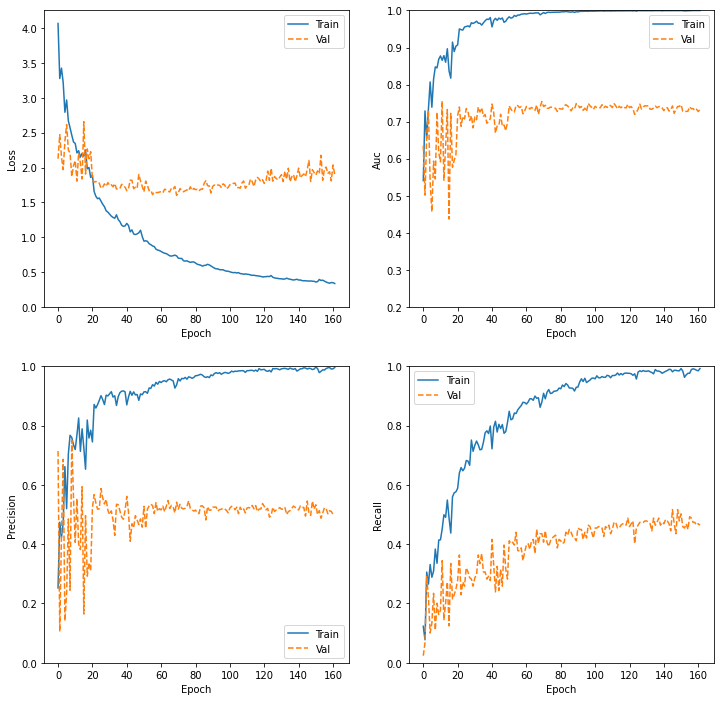

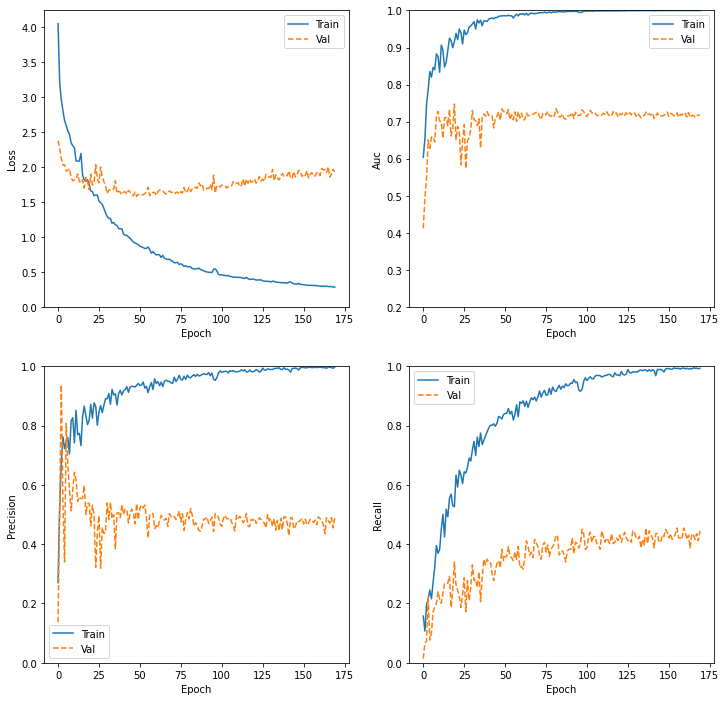

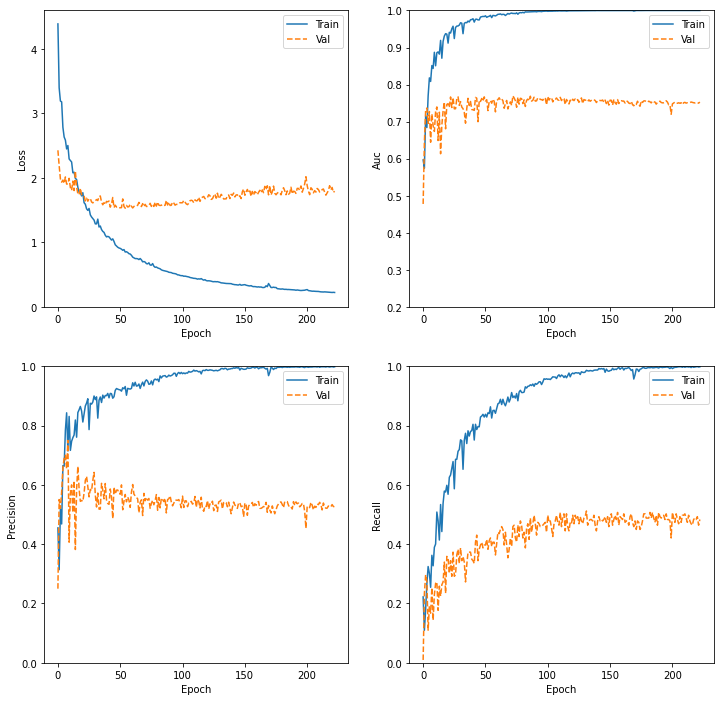

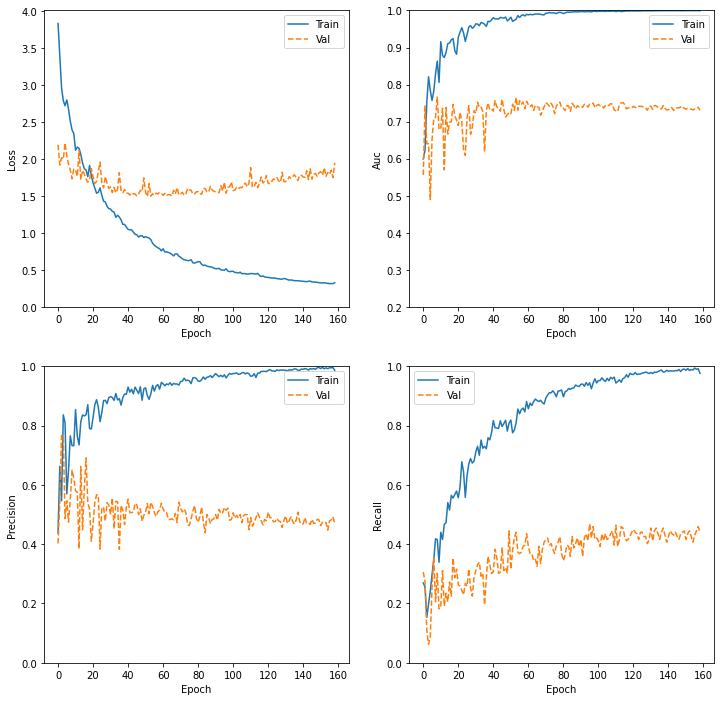

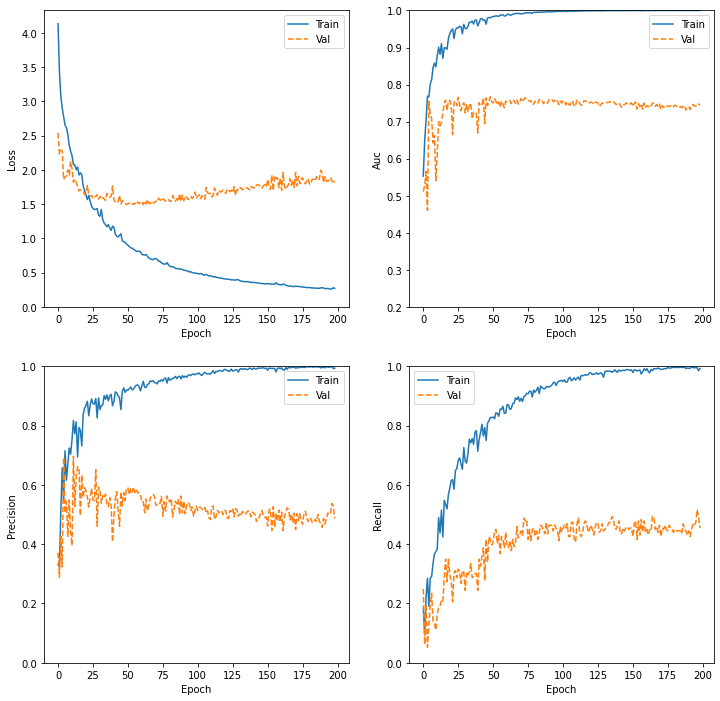

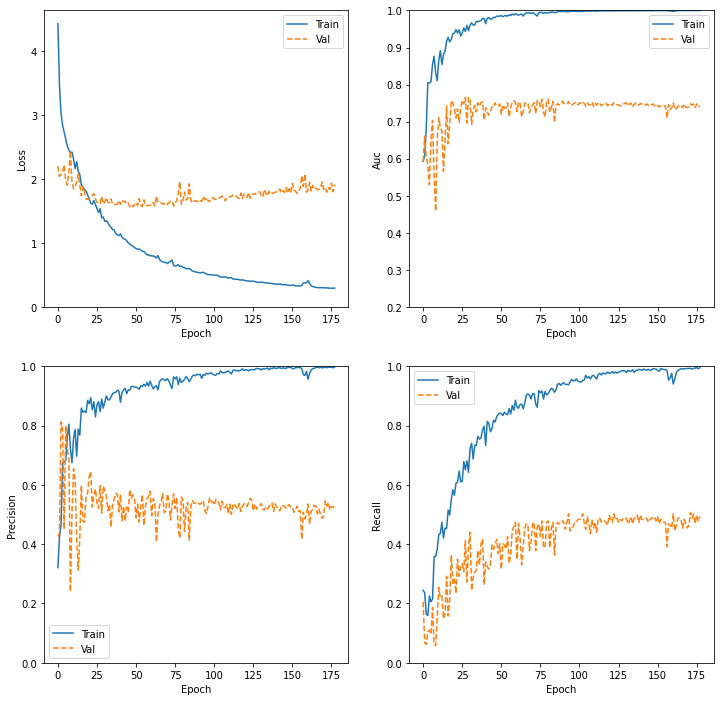

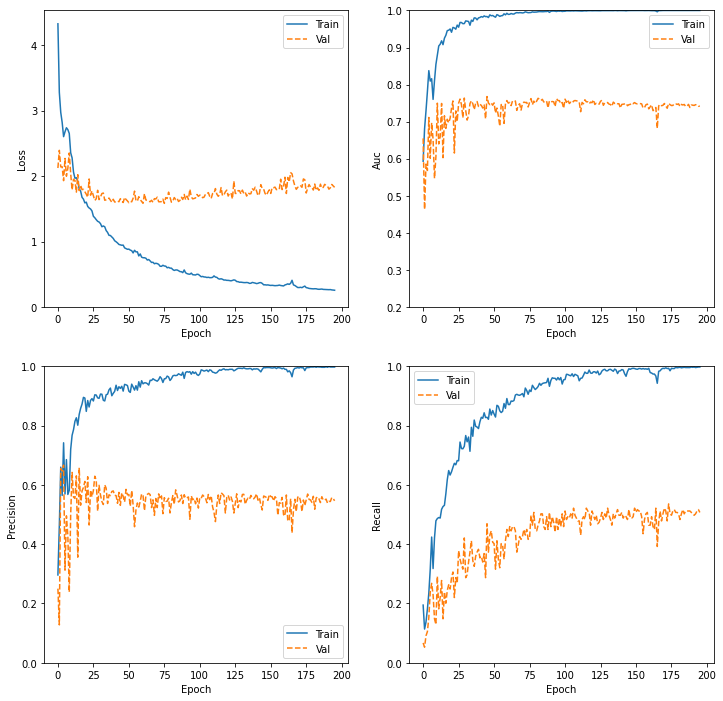

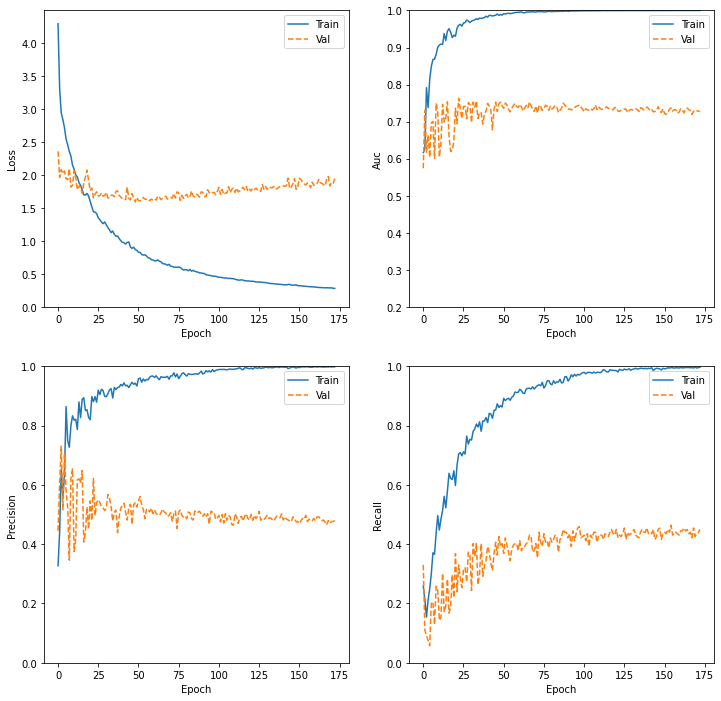

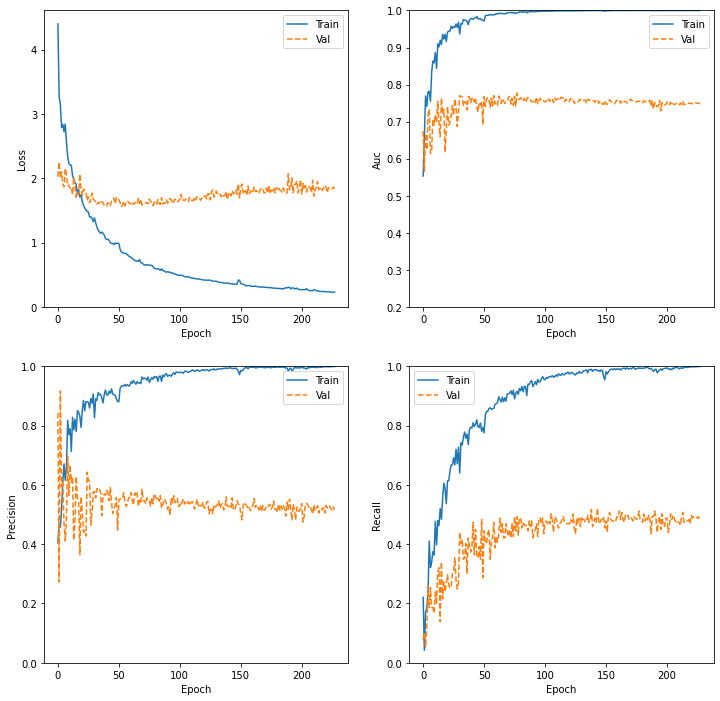

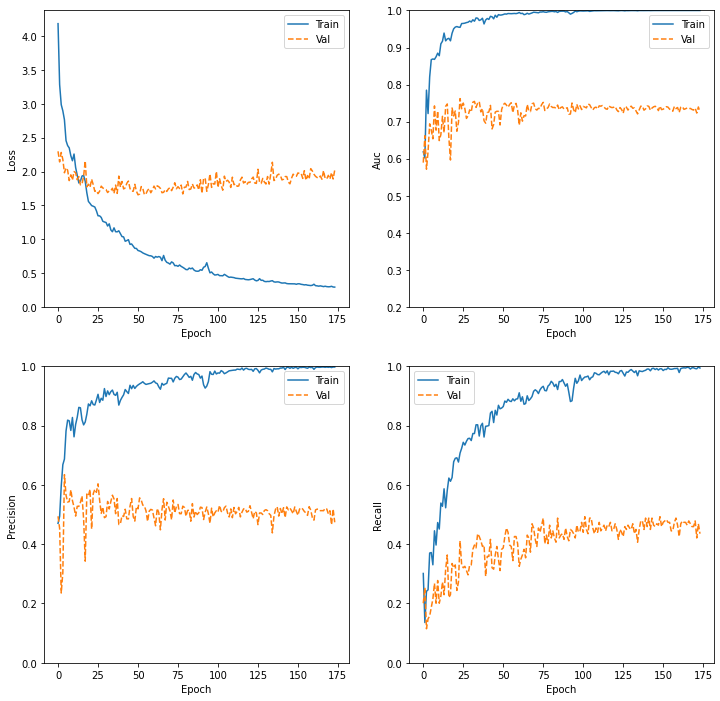

In [ ]:
VAL_LOSS = []
VAL_PRECISION =[]
VAL_RECALL=[]
VAL_AUC =[]

save_dir = '/content/drive/MyDrive/Colab Notebooks/TFM/'
fold_var = 1

for train_index, test_index in skf.split(np.zeros(1550),Y):
  training_data = train_df_poly.iloc[train_index]
  test_data = train_df_poly.iloc[test_index]


  train_data_generator = idg_train.flow_from_dataframe(training_data, 
                                                directory = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                                x_col = "image", 
                                                y_col = "probability",
                                                color_mode='rgb',
                                                subset = 'training',
                                                batch_size=64,
                                                shuffle=False,
                                                class_mode="categorical",
                                                target_size=(300,300))
  
  valid_data_generator=idg_train.flow_from_dataframe(training_data,
                                               directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                               x_col="image",
                                               y_col="probability",
                                               color_mode='rgb',
                                               subset="validation",
                                               batch_size=64,
                                               shuffle=False,
                                               class_mode="categorical",
                                               target_size=(300,300))

  test_data_generator  = idg_test.flow_from_dataframe(test_data, 
                                                 directory = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                                 x_col = "image",
                                                 y_col = "probability",
                                                 class_mode = "categorical", 
                                                 shuffle = False,
                                                 color_mode='rgb',
                                                 batch_size=1,
                                                 target_size=(300,300))
  #CREATE NEW MODEL
  model = create_new_model()

  #COMPILE NEW MODEL
  model.compile(loss='categorical_crossentropy',
		      optimizer=keras.optimizers.Adam(lr=0.0001),
		      metrics=METRICS)
  
  # CREATE CALLBACKS
  checkpoint = tf.keras.callbacks.ModelCheckpoint(save_dir+get_model_name(fold_var),
                                                 monitor='val_auc',
                                                 verbose=1,
                                                 save_best_only=True,
                                                 mode='max')
  callbacks_list = [checkpoint, early_stopping]
  
  # FIT THE MODEL
  history = model.fit(train_data_generator,
                      epochs=350,
                      callbacks=callbacks_list,
                      class_weight=class_weight,
                      validation_data=valid_data_generator)
  
  #PLOT HISTORY
  plt.figure(figsize=(12, 12))

  metrics_plot = ['loss', 'auc', 'precision', 'recall']
  for n, metric in enumerate(metrics_plot):
    name = metric.replace("_"," ").capitalize()
    plt.subplot(2,2,n+1)
    plt.plot(history.epoch, history.history[metric], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    if metric == 'loss':
      plt.ylim([0, plt.ylim()[1]])
    elif metric == 'auc':
      plt.ylim([0.2,1])
    else:
      plt.ylim([0,1])
    plt.legend()
    
  # LOAD BEST MODEL to evaluate the performance of the model
  model.load_weights(save_dir+get_model_name(fold_var))
  

  results = model.evaluate(test_data_generator)
  results = dict(zip(model.metrics_names,results))
  
  VAL_LOSS.append(results['loss'])
  VAL_PRECISION.append(results['precision'])
  VAL_RECALL.append(results['recall'])
  VAL_AUC.append(results['auc'])

  test_data_generator.reset()
  Y_pred = model.predict_generator(test_data_generator)
  y_pred = np.argmax(Y_pred, axis=1)
  print('Confusion Matrix')
  print(confusion_matrix(test_data_generator.classes, y_pred))
  print('Classification Report')
  target_names = ['0.0', '0.33', '0.66', '1.0']
  print(classification_report(test_data_generator.classes, y_pred, target_names=target_names))
  
  fold_var += 1
  keras.backend.clear_session()

# **K-FOLDS 4-capes Mono**

In [ ]:
from sklearn.model_selection import StratifiedKFold

In [ ]:
#We don’t need to create X, because as mentioned in the documentation page for StratifiedKFold , it is sufficient to provide only the labels Y to generate the splits and hence we can put np.zeros(n_samples) instead of X.

train_df_mono = pd.read_csv(TFM_path+"mono_file.csv", dtype='str')
Y = train_df_mono[['probability']]
                         
skf = StratifiedKFold(n_splits = 10, random_state = 7, shuffle = True) 

In [ ]:
idg_train = ImageDataGenerator(rescale=1./255, validation_split=0.15)
idg_test = ImageDataGenerator(rescale=1./255)

In [ ]:
# We also need to save the best model in each fold.
# Auxiliary function for getting model name in each of the k iterations

def get_model_name(k):
    return '4-capes_kfolds_'+str(k)+'.h5'

In [ ]:
lab_mono = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFM/mono_file.csv')
total_monolab = lab_mono.groupby(['probability']).size().sum()

#dividit per 2 dona millors resultats
weight_for_0 = (1 / lab_mono.groupby(['probability']).size()[0])*(total_monolab)/2.0 
weight_for_03 = (1 / lab_mono.groupby(['probability']).size()[1/3])*(total_monolab)/2.0
weight_for_06 = (1 / lab_mono.groupby(['probability']).size()[2/3])*(total_monolab)/2.0
weight_for_1 = (1 / lab_mono.groupby(['probability']).size()[1])*(total_monolab)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

Weight for class 0.0: 0.91
Weight for class 0.33: 4.59
Weight for class 0.66: 9.59
Weight for class 1.0: 1.72


In [ ]:
def create_new_model():

  w_mono_comp_4 = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               # últim 1 era per a b/n i 3 per rgb
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),
    layers.Dropout(rate=0.5),

    layers.Conv2D(filters=256, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),
    layers.Dropout(rate=0.6),

    #Classifier Head
    layers.Flatten(),                                        # flatten out the layers
    layers.Dense(512,activation='relu'),
    layers.Dense(4, kernel_regularizer=keras.regularizers.l2(0.1), activation = 'softmax')  
    ])
  return w_mono_comp_4

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=150,
    mode='max',
    restore_best_weights=True)

## **Define & Train**

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/500
13/13 [==============================] - 7s 373ms/step - loss: 4.3973 - tp: 109.7857 - fp: 145.1429 - tn: 1578.5714 - fn: 464.7857 - accuracy: 0.0000e+00 - precision: 0.4423 - recall: 0.2143 - auc: 0.6556 - val_loss: 2.2517 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 432.0000 - val_fn: 144.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.0912

Epoch 00001: val_auc improved from -inf to 0.09119, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/4-capes_kfolds_1.h5
Epoch 2/500
13/13 [==============================] - 4s 290ms/step - loss: 3.7325 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 1411.2857 - fn: 470.4286 - accuracy: 0.0000e+00 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4565 - val_loss: 2.1657 - val_tp: 0.0000e+00 - val

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[30 11  9  9]
 [ 2  5  3  1]
 [ 1  1  3  1]
 [ 5  2  2 23]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.79      0.51      0.62        59
        0.33       0.26      0.45      0.33        11
        0.66       0.18      0.50      0.26         6
         1.0       0.68      0.72      0.70        32

    accuracy                           0.56       108
   macro avg       0.48      0.55      0.48       108
weighted avg       0.67      0.56      0.59       108

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/500
13/13 [==============================] - 6s 379ms/step - loss: 3.8296 - tp: 114.9286 - fp: 166.0714 - tn: 1567.0714 - fn: 462.7857 - accuracy: 0.0000e+00 - precision: 0.4297 - recall: 0.2405 - auc: 0.6739 - val_loss: 2.2244 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[34  9  8  7]
 [ 3  7  2  0]
 [ 1  0  4  1]
 [ 7  3  1 21]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.76      0.59      0.66        58
        0.33       0.37      0.58      0.45        12
        0.66       0.27      0.67      0.38         6
         1.0       0.72      0.66      0.69        32

    accuracy                           0.61       108
   macro avg       0.53      0.62      0.55       108
weighted avg       0.68      0.61      0.63       108

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/500
13/13 [==============================] - 7s 399ms/step - loss: 4.9592 - tp: 119.7143 - fp: 244.2143 - tn: 1493.2143 - fn: 459.4286 - accuracy: 0.0000e+00 - precision: 0.3663 - recall: 0.2253 - auc: 0.6420 - val_loss: 2.2374 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[39 10  2  7]
 [ 1  7  2  2]
 [ 2  1  3  0]
 [ 4  2  2 24]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.85      0.67      0.75        58
        0.33       0.35      0.58      0.44        12
        0.66       0.33      0.50      0.40         6
         1.0       0.73      0.75      0.74        32

    accuracy                           0.68       108
   macro avg       0.56      0.63      0.58       108
weighted avg       0.73      0.68      0.69       108

Found 822 validated image filenames belonging to 4 classes.
Found 144 validated image filenames belonging to 4 classes.
Found 108 validated image filenames belonging to 4 classes.
Epoch 1/500
13/13 [==============================] - 7s 380ms/step - loss: 4.7531 - tp: 103.2857 - fp: 133.0000 - tn: 1595.8571 - fn: 473.0000 - accuracy: 0.0000e+00 - precision: 0.4494 - recall: 0.2113 - auc: 0.5958 - val_loss: 2.2021 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[39  8  5  7]
 [ 5  6  1  0]
 [ 4  0  1  1]
 [ 3  0  3 25]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.76      0.66      0.71        59
        0.33       0.43      0.50      0.46        12
        0.66       0.10      0.17      0.12         6
         1.0       0.76      0.81      0.78        31

    accuracy                           0.66       108
   macro avg       0.51      0.53      0.52       108
weighted avg       0.69      0.66      0.67       108

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/500
13/13 [==============================] - 7s 430ms/step - loss: 5.0790 - tp: 93.8571 - fp: 202.0714 - tn: 1533.2143 - fn: 484.5714 - accuracy: 0.0000e+00 - precision: 0.3401 - recall: 0.1886 - auc: 0.5710 - val_loss: 2.1850 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[47  6  2  4]
 [ 5  6  1  0]
 [ 3  2  0  0]
 [ 6  0  2 23]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.77      0.80      0.78        59
        0.33       0.43      0.50      0.46        12
        0.66       0.00      0.00      0.00         5
         1.0       0.85      0.74      0.79        31

    accuracy                           0.71       107
   macro avg       0.51      0.51      0.51       107
weighted avg       0.72      0.71      0.71       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/500
13/13 [==============================] - 6s 382ms/step - loss: 5.1802 - tp: 93.0714 - fp: 123.0000 - tn: 1620.0000 - fn: 487.9286 - accuracy: 0.0000e+00 - precision: 0.4440 - recall: 0.2000 - auc: 0.6058 - val_loss: 2.2418 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[35 12  6  6]
 [ 2  9  1  0]
 [ 0  3  2  0]
 [ 4  1  2 24]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.85      0.59      0.70        59
        0.33       0.36      0.75      0.49        12
        0.66       0.18      0.40      0.25         5
         1.0       0.80      0.77      0.79        31

    accuracy                           0.65       107
   macro avg       0.55      0.63      0.56       107
weighted avg       0.75      0.65      0.68       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/500
13/13 [==============================] - 7s 383ms/step - loss: 3.8744 - tp: 106.8571 - fp: 151.2143 - tn: 1589.6429 - fn: 473.4286 - accuracy: 0.0000e+00 - precision: 0.4416 - recall: 0.2038 - auc: 0.6760 - val_loss: 2.2050 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_t

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[24  6 19 10]
 [ 4  3  3  2]
 [ 1  1  0  3]
 [ 8  2  2 19]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.65      0.41      0.50        59
        0.33       0.25      0.25      0.25        12
        0.66       0.00      0.00      0.00         5
         1.0       0.56      0.61      0.58        31

    accuracy                           0.43       107
   macro avg       0.36      0.32      0.33       107
weighted avg       0.55      0.43      0.47       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/500
13/13 [==============================] - 6s 378ms/step - loss: 5.6471 - tp: 91.0000 - fp: 89.2857 - tn: 1632.2857 - fn: 482.8571 - accuracy: 0.0000e+00 - precision: 0.5037 - recall: 0.1856 - auc: 0.6187 - val_loss: 2.2684 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn:

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[30 11  6 12]
 [ 2  7  2  1]
 [ 1  1  2  1]
 [ 3  2  2 24]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.83      0.51      0.63        59
        0.33       0.33      0.58      0.42        12
        0.66       0.17      0.40      0.24         5
         1.0       0.63      0.77      0.70        31

    accuracy                           0.59       107
   macro avg       0.49      0.57      0.50       107
weighted avg       0.69      0.59      0.61       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/500
13/13 [==============================] - 7s 385ms/step - loss: 4.8412 - tp: 65.2857 - fp: 274.3571 - tn: 1453.6429 - fn: 510.7143 - accuracy: 0.0000e+00 - precision: 0.2388 - recall: 0.1345 - auc: 0.5733 - val_loss: 2.2044 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[48  7  2  2]
 [ 5  5  0  1]
 [ 3  1  1  1]
 [ 7  1  0 23]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.76      0.81      0.79        59
        0.33       0.36      0.45      0.40        11
        0.66       0.33      0.17      0.22         6
         1.0       0.85      0.74      0.79        31

    accuracy                           0.72       107
   macro avg       0.58      0.54      0.55       107
weighted avg       0.72      0.72      0.72       107

Found 822 validated image filenames belonging to 4 classes.
Found 145 validated image filenames belonging to 4 classes.
Found 107 validated image filenames belonging to 4 classes.
Epoch 1/500
13/13 [==============================] - 6s 374ms/step - loss: 6.2394 - tp: 92.6429 - fp: 243.7143 - tn: 1495.0000 - fn: 486.9286 - accuracy: 0.0000e+00 - precision: 0.3228 - recall: 0.1976 - auc: 0.5340 - val_loss: 2.1542 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[33  2 16  8]
 [ 4  3  3  1]
 [ 0  1  2  3]
 [ 1  1  2 27]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.56      0.68        59
        0.33       0.43      0.27      0.33        11
        0.66       0.09      0.33      0.14         6
         1.0       0.69      0.87      0.77        31

    accuracy                           0.61       107
   macro avg       0.52      0.51      0.48       107
weighted avg       0.73      0.61      0.64       107



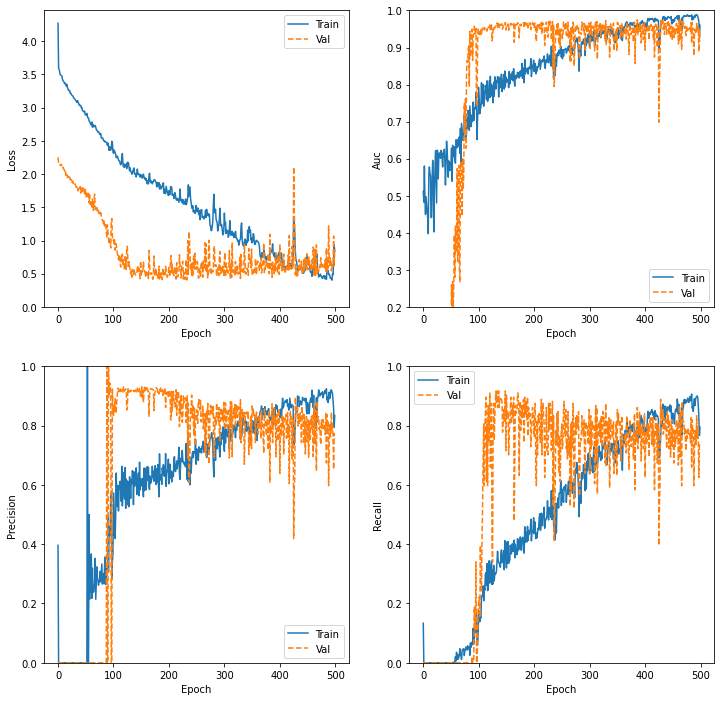

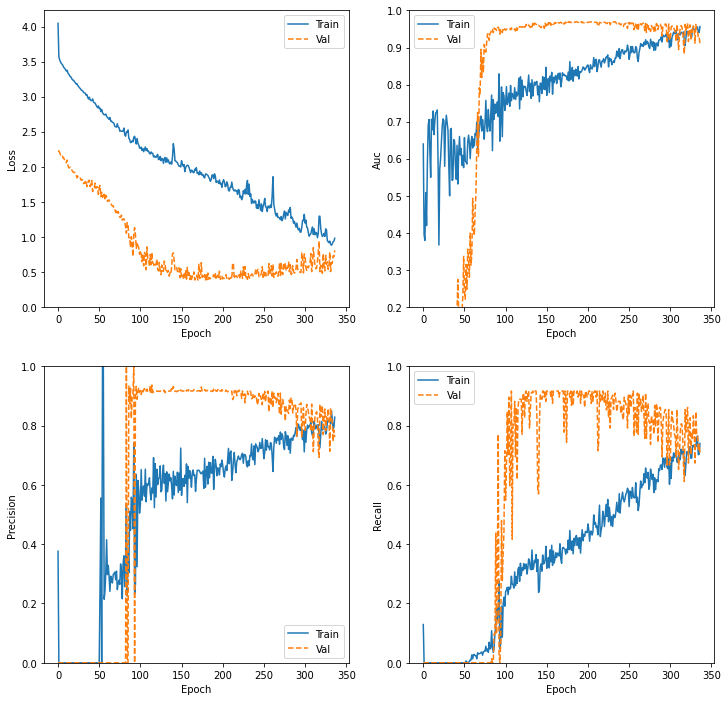

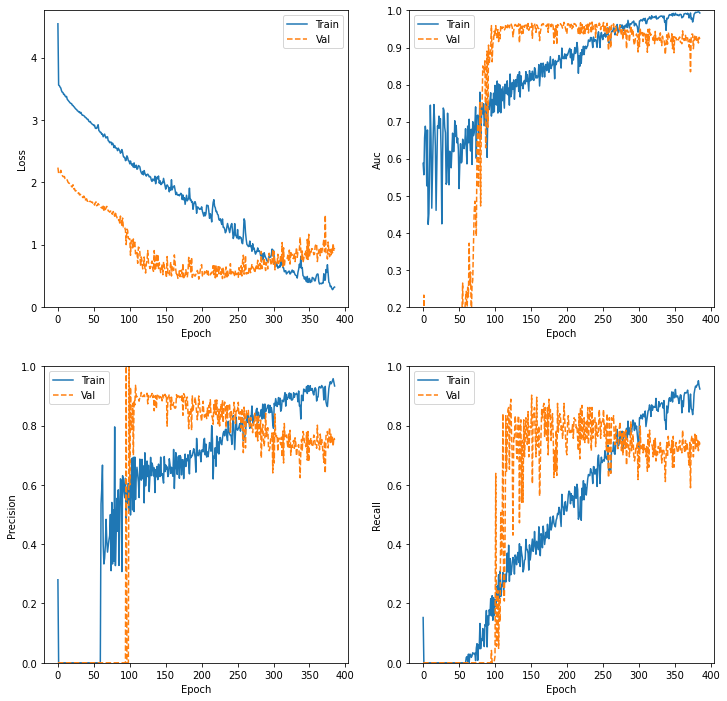

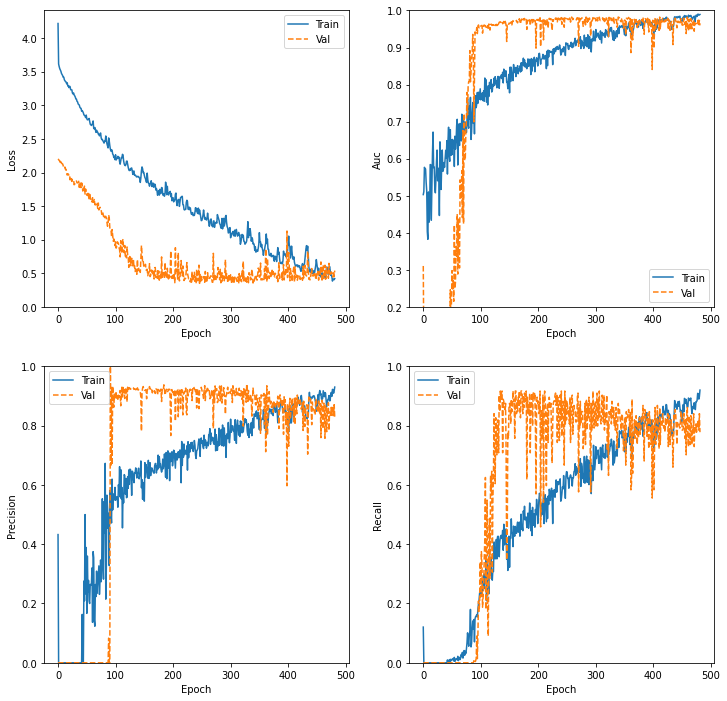

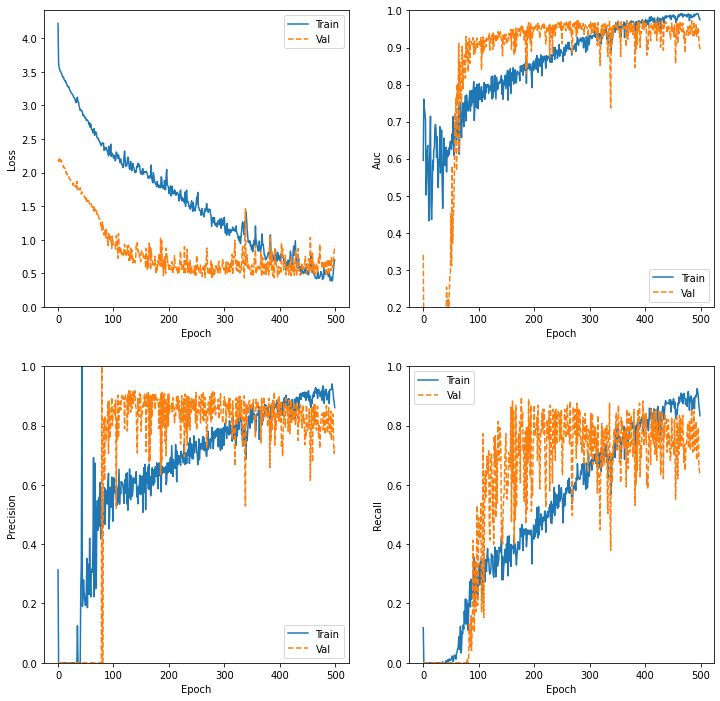

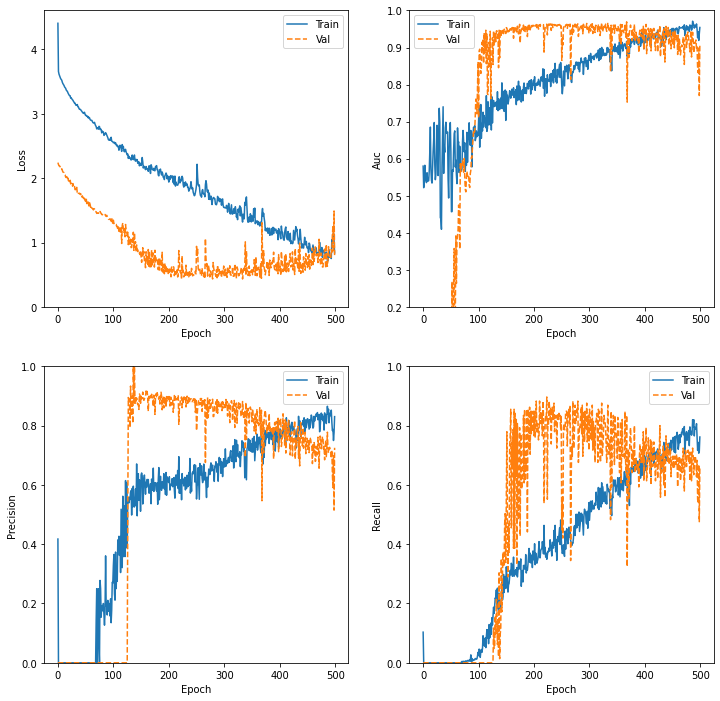

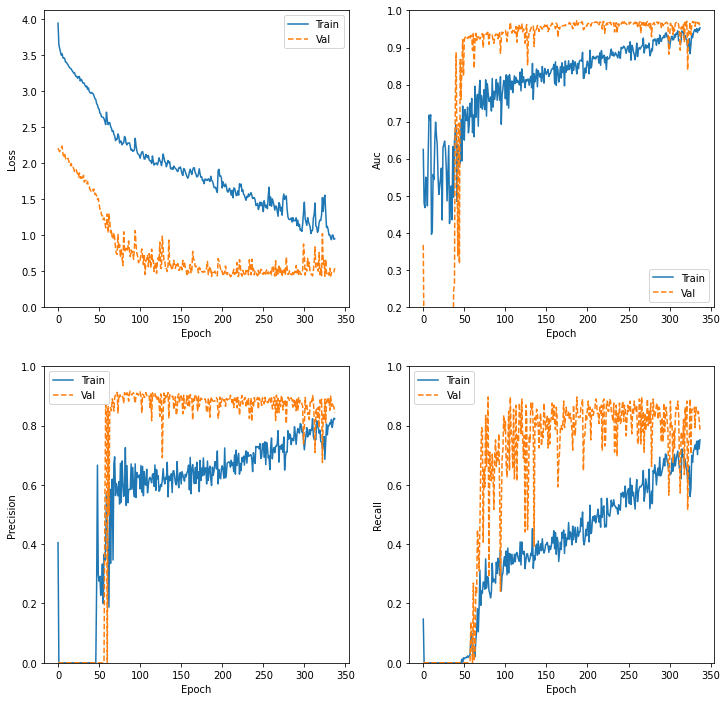

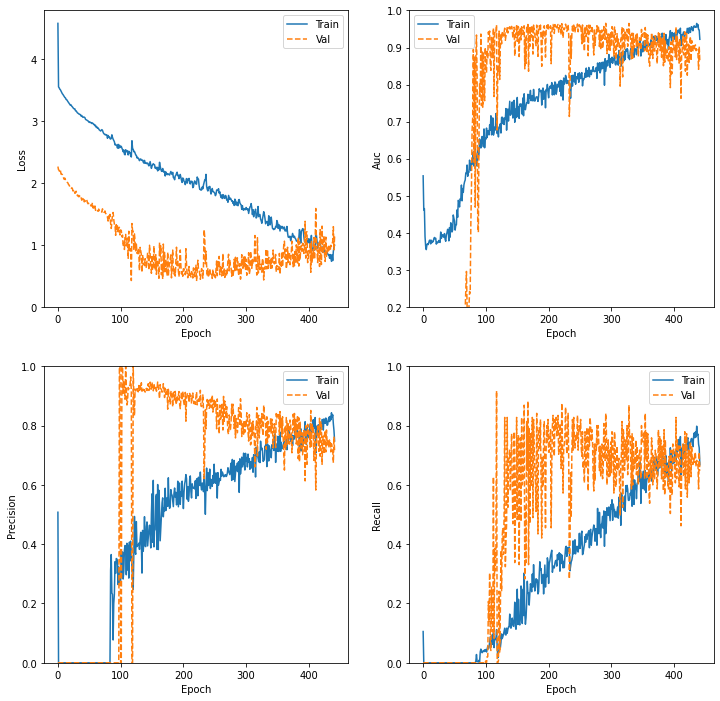

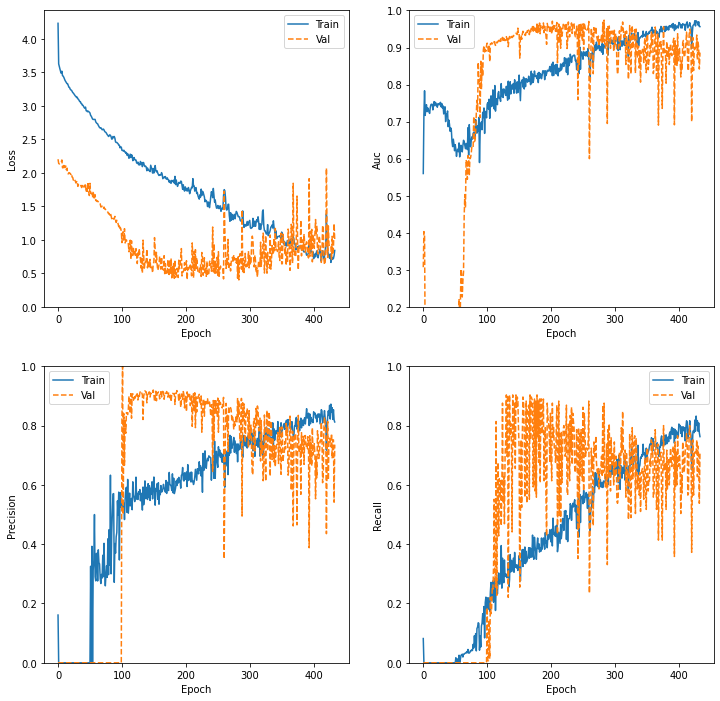

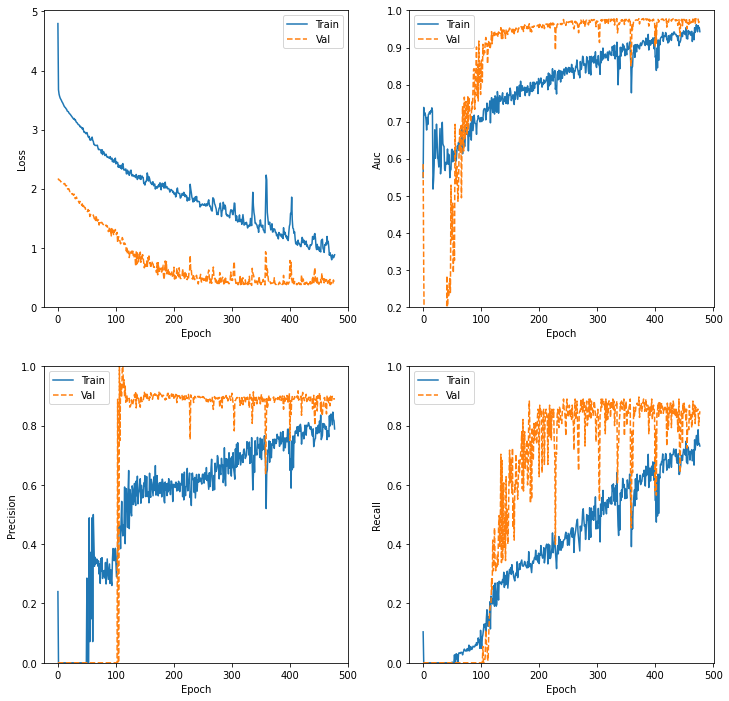

In [ ]:
VAL_LOSS = []
VAL_PRECISION =[]
VAL_RECALL=[]
VAL_AUC =[]

save_dir = '/content/drive/MyDrive/Colab Notebooks/TFM/'
fold_var = 1

for train_index, test_index in skf.split(np.zeros(1074),Y):
  training_data = train_df_mono.iloc[train_index]
  test_data = train_df_mono.iloc[test_index]


  train_data_generator = idg_train.flow_from_dataframe(training_data, 
                                                directory = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                                x_col = "image", 
                                                y_col = "probability",
                                                color_mode='rgb',
                                                subset = 'training',
                                                batch_size=64,
                                                shuffle=False,
                                                class_mode="categorical",
                                                target_size=(300,300))
  
  valid_data_generator=idg_train.flow_from_dataframe(training_data,
                                               directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                               x_col="image",
                                               y_col="probability",
                                               color_mode='rgb',
                                               subset="validation",
                                               batch_size=64,
                                               shuffle=False,
                                               class_mode="categorical",
                                               target_size=(300,300))

  test_data_generator  = idg_test.flow_from_dataframe(test_data, 
                                                 directory = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                                 x_col = "image",
                                                 y_col = "probability",
                                                 class_mode = "categorical", 
                                                 shuffle = False,
                                                 color_mode='rgb',
                                                 batch_size=1,
                                                 target_size=(300,300))
  #CREATE NEW MODEL
  model = create_new_model()

  #COMPILE NEW MODEL
  model.compile(loss='categorical_crossentropy',
		      optimizer=keras.optimizers.Adam(lr=0.0001),
		      metrics=METRICS)
  
  # CREATE CALLBACKS
  checkpoint = tf.keras.callbacks.ModelCheckpoint(save_dir+get_model_name(fold_var),
                                                 monitor='val_auc',
                                                 verbose=1,
                                                 save_best_only=True,
                                                 mode='max')
  callbacks_list = [checkpoint, early_stopping]
  
  # FIT THE MODEL
  history = model.fit(train_data_generator,
                      epochs=500,
                      callbacks=callbacks_list,
                      class_weight=class_weight,
                      validation_data=valid_data_generator)
  
  #PLOT HISTORY
  plt.figure(figsize=(12, 12))

  metrics_plot = ['loss', 'auc', 'precision', 'recall']
  for n, metric in enumerate(metrics_plot):
    name = metric.replace("_"," ").capitalize()
    plt.subplot(2,2,n+1)
    plt.plot(history.epoch, history.history[metric], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    if metric == 'loss':
      plt.ylim([0, plt.ylim()[1]])
    elif metric == 'auc':
      plt.ylim([0.2,1])
    else:
      plt.ylim([0,1])
    plt.legend()
    
  # LOAD BEST MODEL to evaluate the performance of the model
  model.load_weights(save_dir+get_model_name(fold_var))
  

  results = model.evaluate(test_data_generator)
  results = dict(zip(model.metrics_names,results))
  
  VAL_LOSS.append(results['loss'])
  VAL_PRECISION.append(results['precision'])
  VAL_RECALL.append(results['recall'])
  VAL_AUC.append(results['auc'])

  test_data_generator.reset()
  Y_pred = model.predict_generator(test_data_generator)
  y_pred = np.argmax(Y_pred, axis=1)
  print('Confusion Matrix')
  print(confusion_matrix(test_data_generator.classes, y_pred))
  print('Classification Report')
  target_names = ['0.0', '0.33', '0.66', '1.0']
  print(classification_report(test_data_generator.classes, y_pred, target_names=target_names))
  
  fold_var += 1
  keras.backend.clear_session()

# **K-Folds 3-capes Poli**

In [ ]:
from sklearn.model_selection import StratifiedKFold

In [ ]:
#We don’t need to create X, because as mentioned in the documentation page for StratifiedKFold , it is sufficient to provide only the labels Y to generate the splits and hence we can put np.zeros(n_samples) instead of X.

train_df_poly = pd.read_csv(TFM_path+"poly_file.csv", dtype='str')
Y = train_df_poly[['probability']]
                         
skf = StratifiedKFold(n_splits = 10, random_state = 7, shuffle = True) 

In [ ]:
idg_train = ImageDataGenerator(rescale=1./255, validation_split=0.15)
idg_test = ImageDataGenerator(rescale=1./255)

In [ ]:
# We also need to save the best model in each fold.
# Auxiliary function for getting model name in each of the k iterations

def get_model_name(k):
    return '3-capes_kfolds_poly_'+str(k)+'.h5'

In [ ]:
lab_poly = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFM/poly_file.csv')
total_polylab = lab_poly.groupby(['probability']).size().sum()

#dividit per 2 dona millors resultats
weight_for_0 = (1 / lab_poly.groupby(['probability']).size()[0])*(total_polylab)/2.0 
weight_for_03 = (1 / lab_poly.groupby(['probability']).size()[1/3])*(total_polylab)/2.0
weight_for_06 = (1 / lab_poly.groupby(['probability']).size()[2/3])*(total_polylab)/2.0
weight_for_1 = (1 / lab_poly.groupby(['probability']).size()[1])*(total_polylab)/2.0

class_weight = {0: weight_for_0, 1: weight_for_03, 2: weight_for_06, 3: weight_for_1}

print('Weight for class 0.0: {:.2f}'.format(weight_for_0))
print('Weight for class 0.33: {:.2f}'.format(weight_for_03))
print('Weight for class 0.66: {:.2f}'.format(weight_for_06))
print('Weight for class 1.0: {:.2f}'.format(weight_for_1))

Weight for class 0.0: 0.84
Weight for class 0.33: 4.35
Weight for class 0.66: 15.50
Weight for class 1.0: 1.93


In [ ]:
def create_new_model():
  model = keras.Sequential([
    layers.Conv2D(
                  filters=32, 
                  kernel_size=5,
                  padding="same",
                  activation='relu', 
                  input_shape = [300,300,3]),               
    layers.MaxPool2D(
                  pool_size=2,
                  padding ='same'),                      

    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),
    layers.Dropout(rate=0.4),

    layers.Flatten(),                                        
    layers.Dense(256,activation='relu'),
    layers.Dense(4, kernel_regularizer=keras.regularizers.l2(0.01), activation = 'softmax')  
    ])
  
  return model

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_auc', 
    verbose=1,
    patience=150,
    mode='max',
    restore_best_weights=True)

## **Define & Train**

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/400
19/19 [==============================] - 662s 35s/step - loss: 3.2214 - tp: 28.3500 - fp: 88.9500 - tn: 1827.4500 - fn: 610.4500 - accuracy: 0.0000e+00 - precision: 0.2204 - recall: 0.0515 - auc: 0.5079 - val_loss: 1.4137 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 627.0000 - val_fn: 209.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.6467

Epoch 00001: val_auc improved from -inf to 0.64673, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/3-capes_kfolds_poly_1.h5
Epoch 2/400
19/19 [==============================] - 5s 283ms/step - loss: 3.2019 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 1974.9000 - fn: 658.3000 - accuracy: 0.0000e+00 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4547 - val_loss: 1.4438 - val_tp: 0.0000e+00 -

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[50 37  0  5]
 [ 6 11  0  0]
 [ 3  2  0  0]
 [21  9  0 11]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.62      0.54      0.58        92
        0.33       0.19      0.65      0.29        17
        0.66       0.00      0.00      0.00         5
         1.0       0.69      0.27      0.39        41

    accuracy                           0.46       155
   macro avg       0.37      0.36      0.31       155
weighted avg       0.57      0.46      0.48       155



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/400
19/19 [==============================] - 8s 326ms/step - loss: 3.1201 - tp: 130.2500 - fp: 76.7000 - tn: 2336.2000 - fn: 674.0500 - accuracy: 0.0000e+00 - precision: 0.6637 - recall: 0.1795 - auc: 0.6657 - val_loss: 1.5538 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 627.0000 - val_fn: 209.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.3265

Epoch 00001: val_auc improved from -inf to 0.32646, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/3-capes_kfolds_poly_2.h5
Epoch 2/400
19/19 [==============================] - 5s 278ms/step - loss: 2.5835 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 1983.9000 - fn: 661.3000 - accuracy: 0.0000e+00 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5325 - val_loss: 1.4352 - val_tp: 0.0000e+00 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[88  1  0  3]
 [16  1  0  0]
 [ 4  0  0  1]
 [24  0  0 17]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.67      0.96      0.79        92
        0.33       0.50      0.06      0.11        17
        0.66       0.00      0.00      0.00         5
         1.0       0.81      0.41      0.55        41

    accuracy                           0.68       155
   macro avg       0.49      0.36      0.36       155
weighted avg       0.66      0.68      0.62       155



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/400
19/19 [==============================] - 8s 340ms/step - loss: 3.7888 - tp: 10.7500 - fp: 70.5000 - tn: 2315.4000 - fn: 784.5500 - accuracy: 0.0000e+00 - precision: 0.1739 - recall: 0.0175 - auc: 0.5131 - val_loss: 1.3887 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 627.0000 - val_fn: 209.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.6488

Epoch 00001: val_auc improved from -inf to 0.64877, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/3-capes_kfolds_poly_3.h5
Epoch 2/400
19/19 [==============================] - 5s 288ms/step - loss: 2.7007 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 1916.4000 - fn: 638.8000 - accuracy: 0.0000e+00 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.8170 - val_loss: 1.4287 - val_tp: 0.0000e+00 -

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[82  2  0  8]
 [13  4  0  1]
 [ 3  1  0  1]
 [16  2  0 22]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.72      0.89      0.80        92
        0.33       0.44      0.22      0.30        18
        0.66       0.00      0.00      0.00         5
         1.0       0.69      0.55      0.61        40

    accuracy                           0.70       155
   macro avg       0.46      0.42      0.43       155
weighted avg       0.66      0.70      0.66       155



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/400
19/19 [==============================] - 8s 335ms/step - loss: 4.3286 - tp: 241.3000 - fp: 262.7000 - tn: 2181.7000 - fn: 573.5000 - accuracy: 0.0012 - precision: 0.5167 - recall: 0.3475 - auc: 0.7309 - val_loss: 1.5203 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 627.0000 - val_fn: 209.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.4828

Epoch 00001: val_auc improved from -inf to 0.48282, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/3-capes_kfolds_poly_4.h5
Epoch 2/400
19/19 [==============================] - 5s 277ms/step - loss: 2.5949 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 1952.4000 - fn: 650.8000 - accuracy: 0.0000e+00 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6044 - val_loss: 1.4863 - val_tp: 0.0000e+00 - v

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[92  0  0  0]
 [18  0  0  0]
 [ 5  0  0  0]
 [39  0  0  1]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.60      1.00      0.75        92
        0.33       0.00      0.00      0.00        18
        0.66       0.00      0.00      0.00         5
         1.0       1.00      0.03      0.05        40

    accuracy                           0.60       155
   macro avg       0.40      0.26      0.20       155
weighted avg       0.61      0.60      0.46       155



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/400
19/19 [==============================] - 8s 343ms/step - loss: 3.6819 - tp: 20.4000 - fp: 113.1500 - tn: 2317.7500 - fn: 789.9000 - accuracy: 0.0000e+00 - precision: 0.1418 - recall: 0.0271 - auc: 0.6268 - val_loss: 1.5183 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 627.0000 - val_fn: 209.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.3172

Epoch 00001: val_auc improved from -inf to 0.31720, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/3-capes_kfolds_poly_5.h5
Epoch 2/400
19/19 [==============================] - 5s 283ms/step - loss: 2.6333 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 1974.9000 - fn: 658.3000 - accuracy: 0.0000e+00 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6550 - val_loss: 1.4728 - val_tp: 0.0000e+00 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[51 36  0  5]
 [ 7  9  0  2]
 [ 2  2  1  0]
 [18  3  1 18]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.65      0.55      0.60        92
        0.33       0.18      0.50      0.26        18
        0.66       0.50      0.20      0.29         5
         1.0       0.72      0.45      0.55        40

    accuracy                           0.51       155
   macro avg       0.51      0.43      0.43       155
weighted avg       0.61      0.51      0.54       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/400
19/19 [==============================] - 8s 340ms/step - loss: 3.8246 - tp: 179.5500 - fp: 286.6500 - tn: 2121.7500 - fn: 623.2500 - accuracy: 0.0000e+00 - precision: 0.4117 - recall: 0.2219 - auc: 0.7059 - val_loss: 1.4787 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[77  4  0 11]
 [ 6 10  0  2]
 [ 3  1  0  1]
 [15  3  0 22]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.76      0.84      0.80        92
        0.33       0.56      0.56      0.56        18
        0.66       0.00      0.00      0.00         5
         1.0       0.61      0.55      0.58        40

    accuracy                           0.70       155
   macro avg       0.48      0.49      0.48       155
weighted avg       0.67      0.70      0.69       155



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/400
19/19 [==============================] - 8s 350ms/step - loss: 3.7453 - tp: 170.1000 - fp: 142.7500 - tn: 2270.1500 - fn: 634.2000 - accuracy: 0.0020 - precision: 0.5479 - recall: 0.2574 - auc: 0.5858 - val_loss: 1.4849 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 627.0000 - val_fn: 209.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.3400

Epoch 00001: val_auc improved from -inf to 0.34005, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/3-capes_kfolds_poly_7.h5
Epoch 2/400
19/19 [==============================] - 6s 288ms/step - loss: 2.6207 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 1970.4000 - fn: 656.8000 - accuracy: 0.0000e+00 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6249 - val_loss: 1.4525 - val_tp: 0.0000e+00 - v

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[72  2  1 17]
 [ 9  5  1  3]
 [ 5  0  0  0]
 [ 8  1  1 30]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.77      0.78      0.77        92
        0.33       0.62      0.28      0.38        18
        0.66       0.00      0.00      0.00         5
         1.0       0.60      0.75      0.67        40

    accuracy                           0.69       155
   macro avg       0.50      0.45      0.46       155
weighted avg       0.68      0.69      0.68       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/400
19/19 [==============================] - 8s 338ms/step - loss: 3.2933 - tp: 221.7500 - fp: 190.1500 - tn: 2249.7500 - fn: 591.5500 - accuracy: 0.0020 - precision: 0.5454 - recall: 0.3152 - auc: 0.7292 - val_loss: 1.4809 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[55 27  0 10]
 [ 8  9  0  1]
 [ 2  1  0  2]
 [19  1  0 20]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.65      0.60      0.62        92
        0.33       0.24      0.50      0.32        18
        0.66       0.00      0.00      0.00         5
         1.0       0.61      0.50      0.55        40

    accuracy                           0.54       155
   macro avg       0.37      0.40      0.37       155
weighted avg       0.57      0.54      0.55       155



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/400
19/19 [==============================] - 8s 339ms/step - loss: 3.5451 - tp: 65.6500 - fp: 327.5500 - tn: 2080.8500 - fn: 737.1500 - accuracy: 0.0000e+00 - precision: 0.2114 - recall: 0.0828 - auc: 0.5275 - val_loss: 1.4670 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 627.0000 - val_fn: 209.0000 - val_accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.5206

Epoch 00001: val_auc improved from -inf to 0.52064, saving model to /content/drive/MyDrive/Colab Notebooks/TFM/3-capes_kfolds_poly_9.h5
Epoch 2/400
19/19 [==============================] - 5s 281ms/step - loss: 2.8666 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 1988.4000 - fn: 662.8000 - accuracy: 0.0000e+00 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6658 - val_loss: 1.4301 - val_tp: 0.0000e+00 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[82  1  2  7]
 [ 8  9  1  0]
 [ 4  0  0  1]
 [12  1  0 27]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.77      0.89      0.83        92
        0.33       0.82      0.50      0.62        18
        0.66       0.00      0.00      0.00         5
         1.0       0.77      0.68      0.72        40

    accuracy                           0.76       155
   macro avg       0.59      0.52      0.54       155
weighted avg       0.75      0.76      0.75       155

Found 1186 validated image filenames belonging to 4 classes.
Found 209 validated image filenames belonging to 4 classes.
Found 155 validated image filenames belonging to 4 classes.
Epoch 1/400
19/19 [==============================] - 8s 353ms/step - loss: 3.4863 - tp: 174.7500 - fp: 180.0000 - tn: 2259.9000 - fn: 638.5500 - accuracy: 0.0048 - precision: 0.5084 - recall: 0.2687 - auc: 0.6874 - val_loss: 1.5657 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion Matrix
[[77  2  0 13]
 [ 9  7  0  2]
 [ 4  0  0  1]
 [12  1  0 27]]
Classification Report
              precision    recall  f1-score   support

         0.0       0.75      0.84      0.79        92
        0.33       0.70      0.39      0.50        18
        0.66       0.00      0.00      0.00         5
         1.0       0.63      0.68      0.65        40

    accuracy                           0.72       155
   macro avg       0.52      0.48      0.49       155
weighted avg       0.69      0.72      0.70       155



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


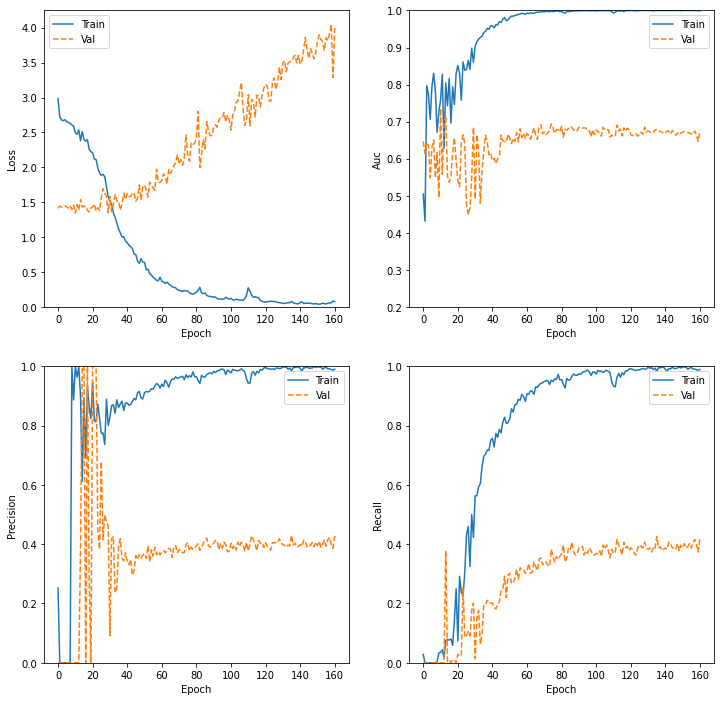

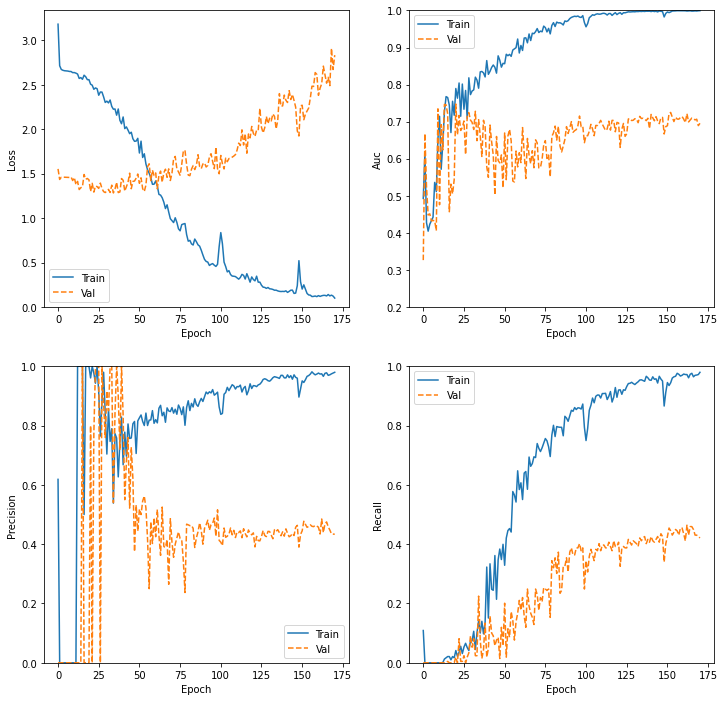

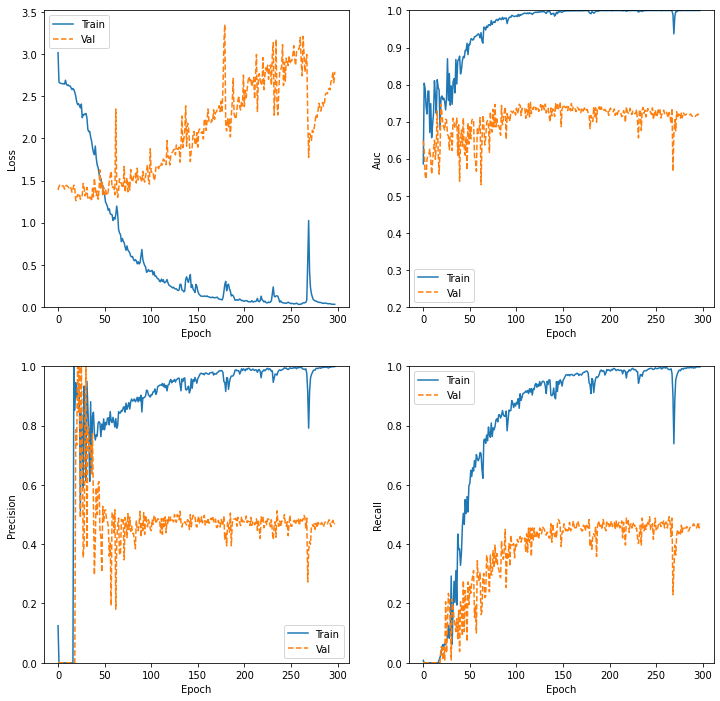

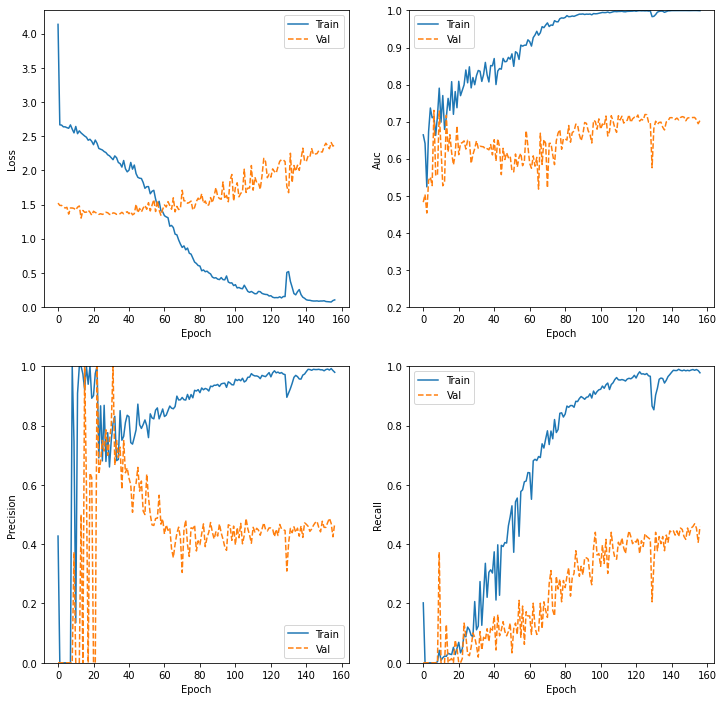

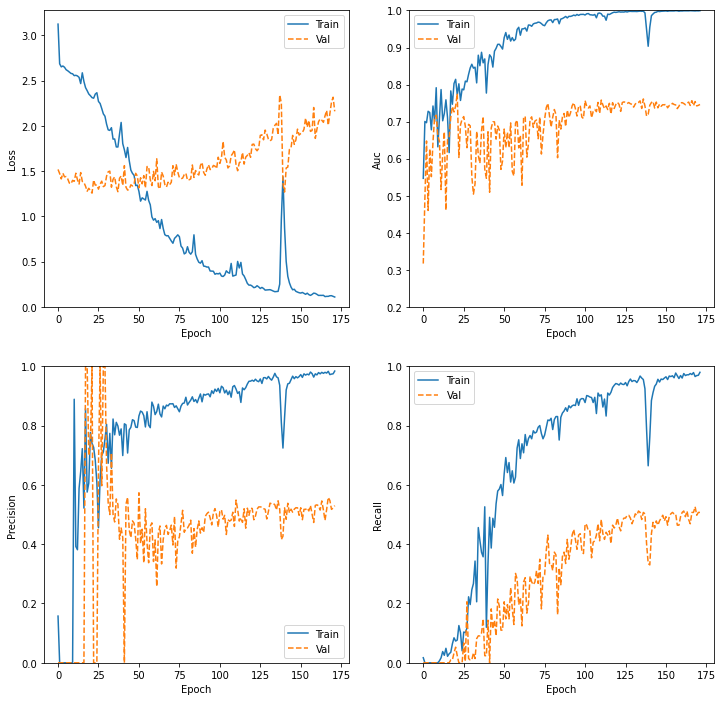

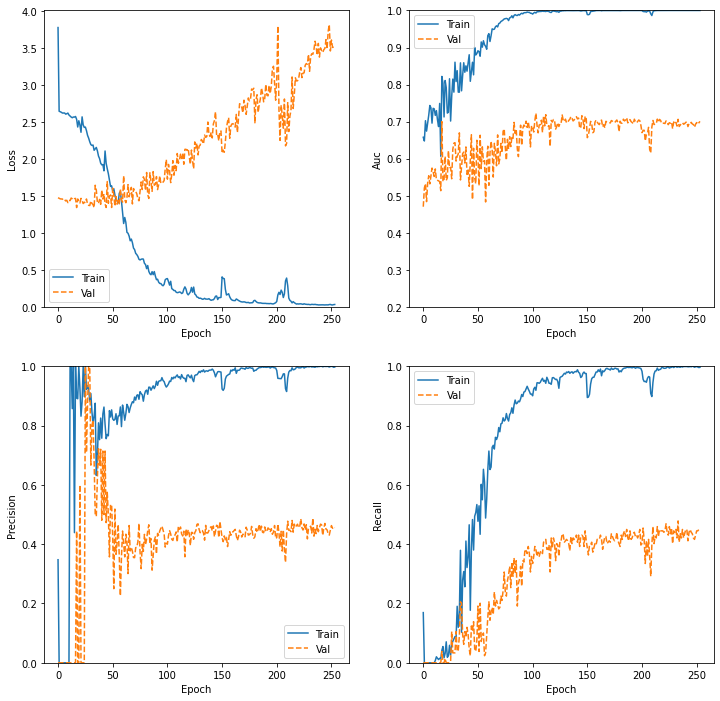

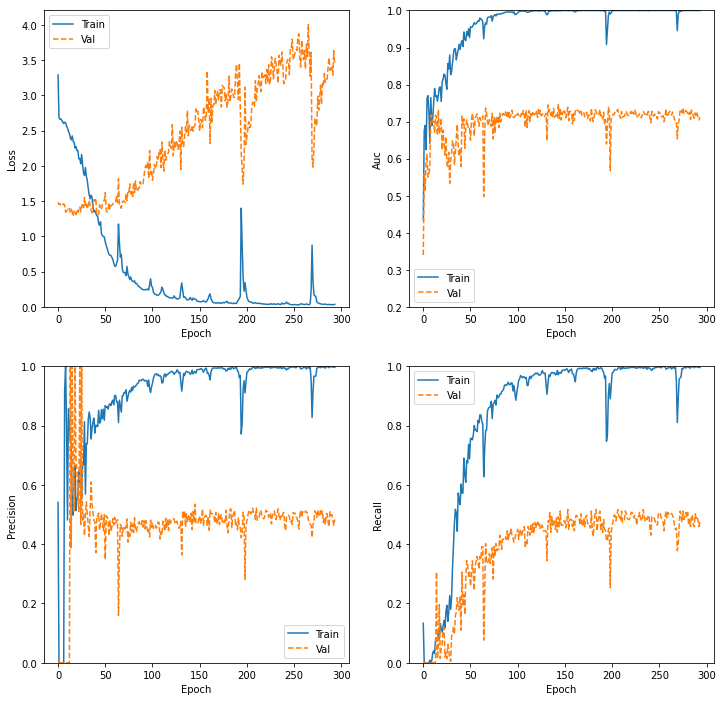

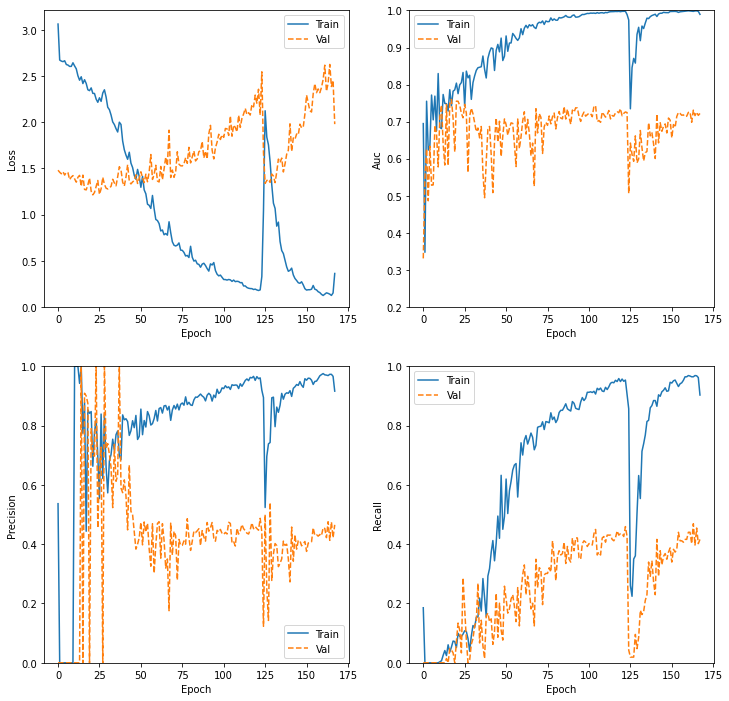

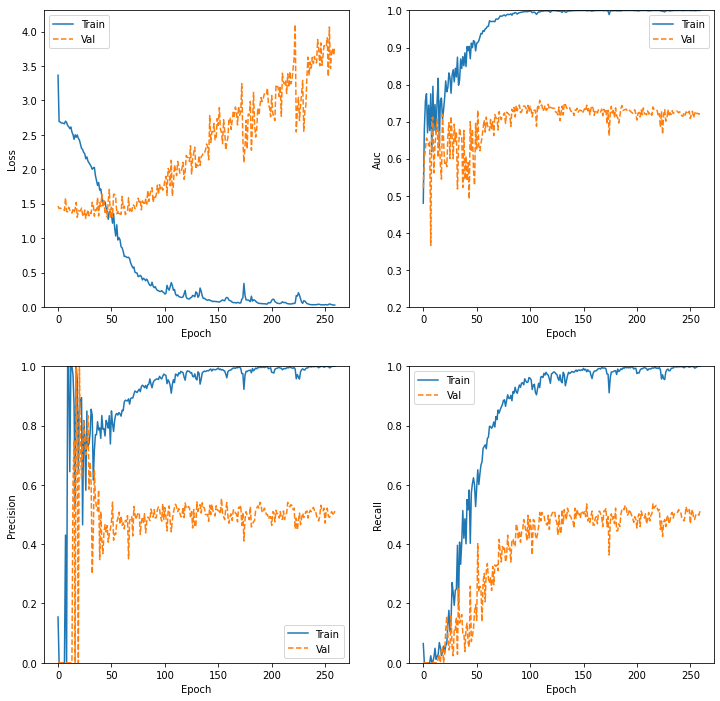

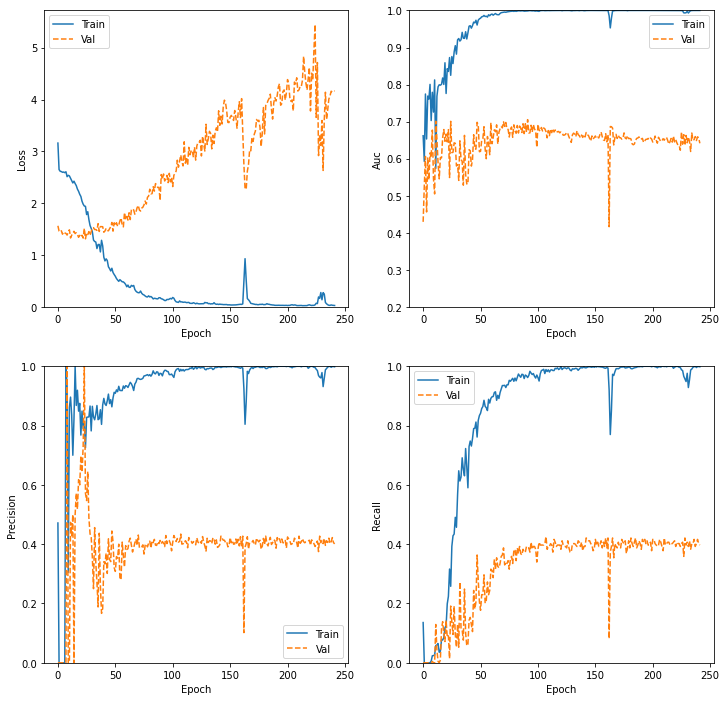

In [ ]:
VAL_LOSS = []
VAL_PRECISION =[]
VAL_RECALL=[]
VAL_AUC =[]

save_dir = '/content/drive/MyDrive/Colab Notebooks/TFM/'
fold_var = 1

for train_index, test_index in skf.split(np.zeros(1550),Y):
  training_data = train_df_poly.iloc[train_index]
  test_data = train_df_poly.iloc[test_index]


  train_data_generator = idg_train.flow_from_dataframe(training_data, 
                                                directory = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                                x_col = "image", 
                                                y_col = "probability",
                                                color_mode='rgb',
                                                subset = 'training',
                                                batch_size=64,
                                                shuffle=False,
                                                class_mode="categorical",
                                                target_size=(300,300))
  
  valid_data_generator=idg_train.flow_from_dataframe(training_data,
                                               directory="/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                               x_col="image",
                                               y_col="probability",
                                               color_mode='rgb',
                                               subset="validation",
                                               batch_size=64,
                                               shuffle=False,
                                               class_mode="categorical",
                                               target_size=(300,300))

  test_data_generator  = idg_test.flow_from_dataframe(test_data, 
                                                 directory = "/content/drive/MyDrive/Colab Notebooks/TFM/elpv-dataset-master/",
                                                 x_col = "image",
                                                 y_col = "probability",
                                                 class_mode = "categorical", 
                                                 shuffle = False,
                                                 color_mode='rgb',
                                                 batch_size=1,
                                                 target_size=(300,300))
  #CREATE NEW MODEL
  model = create_new_model()

  #COMPILE NEW MODEL
  model.compile(loss='categorical_crossentropy',
		      optimizer=keras.optimizers.Adam(lr=0.0001),
		      metrics=METRICS)
  
  # CREATE CALLBACKS
  checkpoint = tf.keras.callbacks.ModelCheckpoint(save_dir+get_model_name(fold_var),
                                                 monitor='val_auc',
                                                 verbose=1,
                                                 save_best_only=True,
                                                 mode='max')
  callbacks_list = [checkpoint, early_stopping]
  
  # FIT THE MODEL
  history = model.fit(train_data_generator,
                      epochs=400,
                      callbacks=callbacks_list,
                      class_weight=class_weight,
                      validation_data=valid_data_generator)
  
  #PLOT HISTORY
  plt.figure(figsize=(12, 12))

  metrics_plot = ['loss', 'auc', 'precision', 'recall']
  for n, metric in enumerate(metrics_plot):
    name = metric.replace("_"," ").capitalize()
    plt.subplot(2,2,n+1)
    plt.plot(history.epoch, history.history[metric], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    if metric == 'loss':
      plt.ylim([0, plt.ylim()[1]])
    elif metric == 'auc':
      plt.ylim([0.2,1])
    else:
      plt.ylim([0,1])
    plt.legend()
    
  # LOAD BEST MODEL to evaluate the performance of the model
  model.load_weights(save_dir+get_model_name(fold_var))
  

  results = model.evaluate(test_data_generator)
  results = dict(zip(model.metrics_names,results))
  
  VAL_LOSS.append(results['loss'])
  VAL_PRECISION.append(results['precision'])
  VAL_RECALL.append(results['recall'])
  VAL_AUC.append(results['auc'])

  test_data_generator.reset()
  Y_pred = model.predict_generator(test_data_generator)
  y_pred = np.argmax(Y_pred, axis=1)
  print('Confusion Matrix')
  print(confusion_matrix(test_data_generator.classes, y_pred))
  print('Classification Report')
  target_names = ['0.0', '0.33', '0.66', '1.0']
  print(classification_report(test_data_generator.classes, y_pred, target_names=target_names))
  
  fold_var += 1
  keras.backend.clear_session()